# CRYO2ICE radar/laser freeboards, snow depth on sea ice and comparison against auxiliary data during winter season 2020-2021

A first examination of CRYO2ICE (CryoSat-2 and ICESat-2) freeboards (radar or laser), derived snow depths, and comparison auxiliary data (daily snow depth maps from passive microwave or reanalysis-based models, and buoys) during the winter season (November-April) of 2020-2021. 

This program computes CRYO2ICE comparable observations at CryoSat-2 locations (baseline) by a defined search radius using the European Space Agency's (ESA's) Baseline-D L1B and L2 products for CryoSat-2 and ATL10 from NASA's ICESat-2. These are later compared with freeboard products from ESA's Climate Change Initiative (CCI+) and the lognormal altimetric re-tracker model (LARM, Landy et al. 2021), to investigate impact of different re-trackers, as well as daily snow depth maps from passive microwave (AMSR2/ASMR-E) and reanalysis-based snow models (SnowModel-Lagrangian/SMLG and an updated version of this SMLG-HS).

## Concept of CRYO2ICE and making the observations comparable

# Initialisation
Below, packages to run this code are imported. Note that the maps are using basemap library, which is currently not being updated and that needs an filepath to run.

In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import mpl_toolkits
import pandas as pd 
import netCDF4
import os
from matplotlib.lines import Line2D

# Input filepath for basemap 
os.environ['PROJ_LIB'] = 'C:/Users/renee/anaconda3/Lib/site-packages/mpl_toolkits/basemap'
os.environ['GMT_LIBRARY_PATH']=r'C:\Users\USERNAME\Anaconda3\envs\pygmt\Library\bin'
from mpl_toolkits.basemap import Basemap 
from mpl_toolkits.axes_grid1 import ImageGrid
from scipy.interpolate import griddata
from scipy import stats
from matplotlib.patches import Wedge
import proplot as plot
import pyproj
from astropy.time import Time 
import h5py
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd
from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
from itertools import chain
import sys
from scipy import interpolate
from netCDF4 import Dataset,num2date
pd.options.mode.chained_assignment = None
import proplot as pplt


# Set font for plots
mpl.rcParams['font.sans-serif'] = "Arial"
# Then, "ALWAYS use sans-serif fonts"
mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = 'white'

In [2]:
# Prepare colors to use in the study

from matplotlib.colors import LinearSegmentedColormap,rgb2hex
from scipy.stats import linregress

cmap = plt.cm.get_cmap('Blues')
cmap_qual2 = [cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]

cmap_qual_green = LinearSegmentedColormap.from_list('list', ['green', 'gray'], N = 2)

'''cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))'''
cmap_check = plt.cm.get_cmap('BuRd_r')
cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))), rgb2hex(cmap_check((3/8))),
            rgb2hex(cmap_check((5/8))), rgb2hex(cmap_check(6/8)), rgb2hex(cmap_check(7/8)), rgb2hex(cmap_check(8/8)), cmap_qual_green(1)]

cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))

### Load and prep observations

In [14]:

def get_valid_freeboard_flag(flag): # function to use the bitwise quality flag of CS2 L2 data 
    """
    flag_masks = 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432, 67108864, 134217728, 268435456; // int 
    
    removed flags in dict_error: 
    #        'sarin_bad_velocity'       : 2,
    #        'sarin_out_of_range'       : 4,
    #        'sarin_bad_baseline'       : 8,
    #        'delta_time_error'         :32,
    #        'mispointing_error'        :64,
    #        'sarin_height_ambiguous'   :2048,
    
    """
    # flags to look for
    dict_error= {
        'calibration_warning'      : 1,
        'sarin_bad_velocity'       : 2,
        'sarin_out_of_range'       : 4,
        'sarin_bad_baseline'       : 8,
        'delta_time_error'         :32,
        'mispointing_error'        :64,
        'sarin_side_redundant'     :256,
        'sarin_rx_2_error'         :512,
        'sarin_rx_1_error'         :1024,
        'sarin_height_ambiguous'   :2048,
        'surf_type_class_ocean'    :32768,
        'freeboard_error'          :65536,
        'peakiness_error'          :131072,
        'ssha_interp_error'        :262144,
        'orbit_discontinuity'      :33554432,
        'orbit_error'              :67108864,
        'height_sea_ice_error'     :268435456,
        }
    # all flags provided in data product
    all_flag= {
        'calibration_warning'      : 1,
        'sarin_bad_velocity'       : 2,
        'sarin_out_of_range'       : 4,
        'sarin_bad_baseline'       : 8,
        'lrm_slope_model_invalid'  :16,
        'delta_time_error'         :32,
        'mispointing_error'        :64,
        'surface_model_unavailable':128,
        'sarin_side_redundant'     :256,
        'sarin_rx_2_error'         :512,
        'sarin_rx_1_error'         :1024,
        'sarin_height_ambiguous'   :2048,
        'surf_type_class_undefined':4096,
        'surf_type_class_sea_ice'  :8192,
        'surf_type_class_lead'     :16384,
        'surf_type_class_ocean'    :32768,
        'freeboard_error'          :65536,
        'peakiness_error'          :131072,
        'ssha_interp_error'        :262144,
        'sig0_3_error'             :524288,
        'sig0_2_error'             :1048576,
        'sig0_1_error'             :2097152,
        'height_3_error'           :4194304,
        'height_2_error'           :8388608,
        'height_1_error'           :16777216,
        'orbit_discontinuity'      :33554432,
        'orbit_error'              :67108864,
        'block_degraded'           :134217728,
        'height_sea_ice_error'     :268435456,
        }

    # sea ice class flag
    flag_seaice = np.bitwise_and(flag, all_flag['surf_type_class_sea_ice'])/all_flag['surf_type_class_sea_ice']

    # errors identified
    flag_error = np.zeros(flag.size)
    for key in dict_error.keys():
        flag0_error = np.bitwise_and(flag,dict_error[key])/dict_error[key]
        flag_error = np.logical_or(flag0_error,flag_error)

    flag_valid_fb = flag_seaice - flag_error
    # observations where the flags were not active
    flag_valid_fb[flag_valid_fb<0] =0


    return flag_valid_fb

def fit2(lat, lat2,  h, degree): # regression fit function
    p_fit = np.polyfit(lat, h, degree)
    p_val = np.polyval(p_fit, lat2)
    return p_val

def NN_search(df_CS2_new, df_IS2): # nearest neighbour search (used for extracting IS2 mean sea surface point)
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd
    
    # latitude/longitude to be used as baseline (CS2 for this study)
    query_lats = df_CS2_new[['lat']].to_numpy()
    query_lons = df_CS2_new[['lon']].to_numpy()
    
    # search tree structure for IS2 points using haversine formula, leaf_size = 15 (can be changed)
    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1) # only nearest neighbour (k=1). output are distance to points and index in df_IS2 array
    
    # extract of mean sea surface (MSS) in IS2 array
    mss_interp = [],
    for i in indices:
        mss_interp = np.append(mss_interp, df_IS2['mss'][int(i)])

    return mss_interp

def load_data(fp1,fp2): # load CS2 observations
    from scipy.interpolate import interp1d, UnivariateSpline
    import datetime # Python standard library datetime module
    from netCDF4 import Dataset,num2date # http://unidata.github.io/netcdf4-python/

    ds = netCDF4.Dataset(fp1, 'r')
    # extract freeboard, latitude, longitude,time, flag, mean sea suface, lat/lon for mean sea surface (1 Hz sampling)
    sea_ice_freeboard = ds.variables['freeboard_20_ku'][:]
    lat = ds.variables['lat_poca_20_ku'][:]
    lon = ds.variables['lon_poca_20_ku'][:]
    time = ds.variables['time_20_ku'][:]
    flag = ds.variables[ 'flag_prod_status_20_ku'][:]
    flag_valid = get_valid_freeboard_flag(flag)
    mss = ds.variables['mean_sea_surf_sea_ice_01'][:]
    lat_01 = ds.variables['lat_01'][:]
    lon_01 = ds.variables['lon_01'][:]
    
    df_1hz = pd.DataFrame({'lat':lat_01, 'lon':lon_01, 'mss':mss})
    df_20hz = pd.DataFrame({'lat':lat, 'lon':lon})
    mss_interp = NN_search(df_20hz, df_1hz) # identify nearest MSS point at 20 Hz sampling
    sif_no_mss = sea_ice_freeboard-mss_interp # sea ice freeboard without MSS
    
    # extract time as string with exact date/time (CS2 given in TAI)
    tname = "time_20_ku"
    nctime = ds.variables[tname][:] # get values
    t_unit = ds.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"
    t_cal = ds.variables[tname].calendar
    tvalue = num2date(nctime,units = t_unit,calendar = t_cal)
    str_time = [str(i) for i in tvalue]
    
    # extract waveform parameter (SSD) and waveform from L1B CS2
    ds2 = netCDF4.Dataset(fp2, 'r')
    ssd =  ds2.variables['stack_std_20_ku'][:]
    pwr_waveform = ds2.variables['pwr_waveform_20_ku'][:]
    
    ppk = [] # initialise
    # compute pulse peakiness (PP)
    for i in pwr_waveform:
        calc_pp = []
        noise = np.nanmean(i[10:19])
        i = i[i>noise]

        pp = np.nanmax(i)/np.nanmean(i)
        ppk = np.append(ppk,pp)
    
    # save all data
    df = pd.DataFrame({'sif':sea_ice_freeboard, 'lat':lat, 'lon':lon, 'flag':flag_valid, 'mss':mss_interp, 'ssd':ssd, 'ppk':ppk, 'time':str_time})
    
    # remove non-Arctic data and flagged data
    df = df[df['lat']>60]
    df = df[df['flag']==1]  
    df=df.reset_index(drop=True) # reset index
    
    # extract parameters to return as individual value
    lon_filtered = np.array(df['lon'])
    lat_filtered = np.array(df['lat'])
    fb_filtered = np.array(df['sif'])
    mss_filtered = np.array(df['mss'])
    ssd_filtered = np.array(df['ssd'])
    ppk_filtered = np.array(df['ppk'])
    time_filtered = np.array(df['time'])
    return lon_filtered, lat_filtered, fb_filtered, mss_filtered, ssd_filtered,ppk_filtered, time_filtered

    

### Read and prepare ICESat-2 data to seperate granules

Below are help functions provided as part of ICESat-2 Hackathon to open, read and save IS2 h5-files.

In [4]:
import pyproj
from astropy.time import Time 
import h5py
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd
from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
from itertools import chain
import sys

def list_files_local(path):
    ''' Get file list from local folder. '''
    from glob import glob
    return glob(path)

def gps2dyr(time):
    '''Convert GPS time to decimal years'''
    return Time(time, format='gps').decimalyear

def track_type(time, lat, tmax=1):
    '''
    Separate tracks into ascending and descending. 
    
    Defines tracks as segments with time breaks > tmax , 
    and tests whether lat increases or decreases w/time.
    '''
    tracks = np.zeros(lat.shape) # generates track segment
    tracks[0:np.argmax(np.abs(lat))] = 1 # set values for segment
    i_asc = np.zeros(tracks.shape, dtype=bool) # output index array 
    
    # loop through individual segments
    for track in np.unique(tracks):
        
        i_track, = np.where(track == tracks) # get all pts from seg
        
        if len(i_track) < 2: continue
            
        # Test if lat increase (asc) or descreases (des) with time
        i_min = time[i_track].argmin()
        i_max = time[i_track].argmax()
        lat_diff = lat[i_track][i_max] - lat[i_track][i_min]
        
        # Determine track trype
        if lat_diff > 0: i_asc[i_track] = True
            
    return i_asc, np.invert(i_asc)

def transform_coord(proj1, proj2, x, y):
    '''
    Transform coordinates from proj1 to proj2 (EPSG num). 
    
    Example EPSG projs: 
        Geodetic (lon/lat): 4326
        Polar Stereo AnIS (x/y): 3031
        Polar Stereo GrIS (x/y): 3413
    '''
    # Set full EPSG projection strings 
    proj1 = pyproj.Proj("+init=EPSG:"+str(proj1))
    proj2 = pyproj.Proj("+init=EPSG:"+str(proj2))
    return pyproj.transform(proj1, proj2, x, y)  # convert

def read_h5(fname, vnames=[]):
    '''Simple HDF5 reader'''
    with h5py.File(fname, 'r') as f:
        return [f[v][:] for v in vnames]

### Simple reader

In [15]:
# Adapted from code from ICESat-2 Hackaton.

def read_data(fname, bbox=None):
    '''
    Read ATL03 data file and output 6 reduced files. 
    
    Extract variables of interest and separate the ATL03 file
    into each beam (ground track) and ascending/descending orbits. 
    '''
    
    # Each beam is a group 
    group = ['/gt1l', '/gt1r', '/gt2l', '/gt2r', '/gt3l', '/gt3r']
    
    # Loop through beams
    for k,g in enumerate(group):
    
        #-----------------------------------#
        # 1) Read in data for a single beam #
        #-----------------------------------#
    
        # Load variables into memory (more can be added!)
        with h5py.File(fname, 'r') as fi:
                
            lat_fb = fi[g+ '/freeboard_beam_segment/beam_freeboard/latitude'][:]
            lon_fb = fi[g+ '/freeboard_beam_segment/beam_freeboard/longitude'][:]
            fb = fi[g+ '/freeboard_beam_segment/beam_freeboard/beam_fb_height'][:]
            gw_fb = fi[g+ '/freeboard_beam_segment/height_segments/height_segment_w_gaussian'][:]
            mss = fi[g+ '/freeboard_beam_segment/geophysical/height_segment_mss'][:]
            mean_tide = fi[g+ '/freeboard_beam_segment/geophysical/height_segment_geoid_free2mean'][:]
            SET_corr = fi[g+ '/freeboard_beam_segment/geophysical/height_segment_earth_free2mean'][:]
            mss_meantide = mss+mean_tide+SET_corr # correct MSS to be in mean-tisde system (check ATBD for ICESat-2 for more information)
        
        #-----------------------#
        # 4) Save selected data #
        #-----------------------#
        
        # Define output file name
        ofile = fname.replace('.h5', '_'+g[1:]+'_no_mss_corr_v5.h5')
                
        # Save variables
        with h5py.File(ofile, 'w') as f:
            #f['orbit'] = orb
            f['lon_fb'] = lon_fb
            f['lat_fb'] = lat_fb
            f['fb'] = fb - mss_meantide
            f['gw'] = gw_fb
            f['fb_with_mss'] = fb
            f['mss']=mss_meantide

            
            print('out ->', ofile)

### Preparation of pan-Arctic plot maps 

In [6]:
def plot_panArctic(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='l',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[1,1,1,1],linewidth=0.5, fontsize=14, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,5),linewidth=0.5, fontsize=14, dashes=[1,5])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='gray')
    m.drawmapboundary(fill_color='black')
    x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set)
    #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def plot_panArctic2(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='l',ax=ax, round=True)
    #m.drawmeridians(np.arange(0,360,30),labels=[1,1,1,1],linewidth=0.5, fontsize=14, dashes=[1,5])
    #m.drawparallels(np.arange(-90,90,20),linewidth=0.5, fontsize=14, dashes=[1,5])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='gray')
    m.drawmapboundary(fill_color='black')
    x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set)
    #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

# Load IS2 ATL10 data and prep with simple reader

In [336]:
files = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_02.h5 # load all files for prep, might have to change code if the version nr of file does not end with _02.h5
files

['E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201102092337_05990901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201105001511_06390901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201105014928_06400901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201106060641_06580901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201106074058_06590901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201108174942_06960901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201108192359_06970901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201108223234_06990901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/ATL10-01_20201110011530_07160901_005_02.h5',
 'E:/DTU/CRYO2ICE/Data/CRYO2

In [ ]:
# Read data and extract beam wise IS2 data

njobs = len(files)

# bbox = [lonmin, lonmax, latmin, latmax]
bbox = [0,360, 60, 90]

if njobs == 1:
    print('running in serial ...')
    [read_data(f, bbox) for f in files]

else:
    print('running in parallel (%d jobs) ...' % njobs)
    from joblib import Parallel, delayed
    Parallel(n_jobs=njobs, verbose=5)(delayed(read_data)(f, bbox) for f in files)

# Load prepared IS2 data after processed with simple-reader and CS2 data for further processing

In [9]:
# Length of all lists with filenames are printed for qualitative assessment of whether all tracks 
# are included in the list (all list should be of same length)

files_check_CS2_L1b = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/CS2/L1b/*.nc
print(len(files_check_CS2_L1b))

files_check_CS2_L2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/CS2/L2/*.nc
print(len(files_check_CS2_L2))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt1l_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt1l_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt1l_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt1l_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt1l_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt1l_no_mss_corr.h5
files_check_IS2a = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2a))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt2l_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt2l_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt2l_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt2l_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt2l_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt2l_no_mss_corr.h5
files_check_IS2b = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2b))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt3l_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt3l_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt3l_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt3l_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt3l_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt3l_no_mss_corr.h5
files_check_IS2c = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2c))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt1r_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt1r_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt1r_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt1r_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt1r_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt1r_no_mss_corr.h5
files_check_IS2d = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2d))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt2r_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt2r_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt2r_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt2r_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt2r_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt2r_no_mss_corr.h5
files_check_IS2e = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2e))

files_check_IS2a_v1 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/November/*_gt3r_no_mss_corr.h5
files_check_IS2a_v2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/December/*_gt3r_no_mss_corr.h5
files_check_IS2a_v3 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/January/*_gt3r_no_mss_corr.h5
files_check_IS2a_v4 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/February/*_gt3r_no_mss_corr.h5
files_check_IS2a_v5 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/March/*_gt3r_no_mss_corr.h5
files_check_IS2a_v6 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_data/IS2/Monthly_data/April/*_gt3r_no_mss_corr.h5
files_check_IS2f = files_check_IS2a_v1 + files_check_IS2a_v2 + files_check_IS2a_v3 + files_check_IS2a_v4 + files_check_IS2a_v5 + files_check_IS2a_v6
print(len(files_check_IS2f))

389
389
389
389
389
389
389
389


# CRYO2ICE tracks: bin data 

In [7]:
def load_all_data(k, files_check_IS2a, files_check_IS2b, files_check_IS2c,files_check_IS2d, files_check_IS2e, files_check_IS2f, files_check_CS2_L2, files_check_CS2_L1b, list_total,dist_req):
    '''
    Load all IS2 and CS2 data using the 6 lists of filenames for IS2 (beam specific) and 2 lists of CS2 files (L1B and L2). 
    The IS2 beams are given an ID number (1-6). 
    All IS2 observations are concatenated into data frame. 
    
    CS2 data is loaded and filtered to inlcude only data from 60 degrees latitude and upwards. 
    Smoothing of CS2 data using defined search radius for IS2 (e.g., 3500 m) is applied. 
    
    
    input: 
    - k: integer value denoting current file being used (start at 0)
    - files_check_IS2a-files_check_ISf: lists of filenames for IS2 files (beam specific)
    - files_check_CS2_L1b/files_check_CS2_L2: lists of filenames for CS2 files (L1B or L2)
    - list_total: array with numbers of files (e.g., from 0 to 388).
    - dist_req: distance requirement (value defined in metres)
    
    output: 
    - df_IS2: dataframe for IS2 observations with variables (lon: longitude, lat: latitude, fb: laser freeboard without mss, gw: gaussian width, fb_with_mss: laser freeboard with mss, mss: mean sea surface)
    - df_CS2: dataframe for CS2 observations with variables (lon: longitude, lat: latitude, fb: radra freeboard with mss, fb_no_mss: radar freeboard without mss, mss: mean sea surface, ssd: stack standar deviation, ppk: pulse peakiness, time: time in TAI)
    '''
    
    
    ### IS2
    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2a[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2a = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2a['beam_ID']=1

    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2b[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2b = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2b['beam_ID']=2

    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2c[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2c = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2c['beam_ID']=3
    
    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2d[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2d = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2d['beam_ID']=4

    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2e[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2e = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2e['beam_ID']=5

    lon_gt2l, lat_gt2l,fb_gt2l, gw_gt2l, fb_mss, mss = read_h5(files_check_IS2f[k], ['lon_fb', 'lat_fb', 'fb', 'gw', 'fb_with_mss', 'mss'])
    gw_gt2l[fb_gt2l>5] = np.nan
    fb_gt2l[fb_gt2l>5] = np.nan
    df_IS2f = pd.DataFrame({'lat':lat_gt2l, 'lon':lon_gt2l, 'fb':fb_gt2l, 'gw':gw_gt2l, 'fb_with_mss':fb_mss, 'mss_IS2':mss})
    df_IS2f['beam_ID']=6
    
    frames = [df_IS2a, df_IS2b, df_IS2c, df_IS2d, df_IS2e, df_IS2f]
    df_IS2 = pd.concat(frames)
    df_IS2 = df_IS2.dropna().reset_index()
    
    ### CS2
    fp1 = files_check_CS2_L2[k]
    fp2 = files_check_CS2_L1b[k]
        
    lon, lat,fb, mss, ssd, ppk, time = load_data(fp1, fp2)
    df_CS2 = pd.DataFrame({'lat':lat, 'lon':lon, 'fb':fb, 'mss':mss, 'fb_no_mss':fb-mss, 'ssd':ssd, 'ppk':ppk, 'time':time})
    df_CS2 = df_CS2[(df_CS2['lat']>60)].reset_index()
    
    df_CS2_new = CRYO2ICE_smooth_CS2_data(df_CS2,dist_req)
    
    frames = [df_CS2, df_CS2_new]
    df_CS2 = pd.concat(frames, axis=1)
    
    basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
    
    print('File '+str(k)+'/'+str(len(list_total)-1)+ ': ' + basename_without_ext)
    
    
    return df_IS2, df_CS2, fp1           

def CRYO2ICE_identify_IS2_data2(df_CS2, df_IS2, dist_req):
    '''
    
    '''
    
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['lat']].to_numpy()
    query_lons = df_CS2[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values),  metric='haversine')

    dist_in_metres = dist_req
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres
    

    mean_fb_IS2, mean_gw_IS2, mss_IS2_mean, w_mean_fb_IS2  =  np.empty(len(query_lats)),np.empty(len(query_lats)),np.empty(len(query_lats)),np.empty(len(query_lats))
    dist_std_all, dist_avg_all, dist_min_all, dist_max_all = np.empty(len(query_lats)), np.empty(len(query_lats)),np.empty(len(query_lats)),np.empty(len(query_lats))
    GT1L, GT2L, GT3L, GT1R, GT2R, GT3R = np.empty(len(query_lats)), np.empty(len(query_lats)), np.empty(len(query_lats)), np.empty(len(query_lats)), np.empty(len(query_lats)), np.empty(len(query_lats))
    k = 0
    
    for i in is_within:
        GT1L_count, GT2L_count, GT3L_count, GT1R_count, GT2R_count, GT3R_count = 0,0,0,0,0,0
        beam_ID_all = df_IS2['beam_ID'].iloc[i]
        if len(i)>10:
            data_fb_mean_IS2 = df_IS2['fb'].iloc[i]
            data_gw_mean_IS2 = df_IS2['gw'].iloc[i]
            data_mss_mean_IS2 = df_IS2['mss_IS2'].iloc[i]
        
            mean_fb_val = np.nanmean(data_fb_mean_IS2)


            w_mean_fb_val = np.ma.average(data_fb_mean_IS2, weights=(1/distances_in_metres[k]))
            mss_IS2_mean_val = np.ma.average(data_mss_mean_IS2, weights=(1/distances_in_metres[k]))
            mean_gw_val = np.ma.average(data_gw_mean_IS2, weights=(1/distances_in_metres[k]))
            
            dist_min = np.nanmin(distances_in_metres[k])
            dist_max = np.nanmax(distances_in_metres[k])
            dist_avg = np.nanmean(distances_in_metres[k])
            dist_std = np.nanstd(distances_in_metres[k])
            
        else:
            mean_fb_val = np.nan
            w_mean_fb_val = np.nan
            mss_IS2_mean_val = np.nan
            mean_gw_val = np.nan
            dist_min = np.nan
            dist_max = np.nan
            dist_avg = np.nan
            dist_std = np.nan
        
        for j in beam_ID_all:
            if j == 1:
                GT1L_count += 1
            elif j == 2:
                GT2L_count += 1
            elif j == 3:
                GT3L_count += 1
            elif j == 4:
                GT1R_count += 1
            elif j == 5:
                GT2R_count += 1
            elif j == 6:
                GT3R_count += 1

        
        mean_fb_IS2[k] = mean_fb_val
        w_mean_fb_IS2[k] = w_mean_fb_val
        mss_IS2_mean[k] = mss_IS2_mean_val
        mean_gw_IS2[k] = mean_gw_val
        dist_avg_all[k] = dist_avg
        dist_min_all[k] = dist_min
        dist_max_all[k] = dist_max
        dist_std_all[k] = dist_std
        
        GT1R[k] = GT1R_count
        GT2R[k] = GT2R_count
        GT3R[k] = GT3R_count
        GT1L[k] = GT1L_count
        GT2L[k] = GT2L_count
        GT3L[k] = GT3L_count
        
        k = k+1
    
    
    df_IS2_new = pd.DataFrame({'IS2_mean_fb':mean_fb_IS2, 'IS2_w_mean_fb':w_mean_fb_IS2,'IS2_mean_gw':mean_gw_IS2, 'IS2_mean_MSS':mss_IS2_mean, 'IS2_dist_min':dist_min_all,
                               'IS2_dist_max':dist_max_all, 'IS2_dist_avg':dist_avg_all, 'IS2_dist_std':dist_std_all, 'GT1L_count':GT1L, 'GT2L_count':GT2L, 'GT3L_count':GT3L, 
                               'GT1R_count':GT1R, 'GT2R_count':GT2R, 'GT3R_count':GT3R})
    
    return df_IS2_new

def numpy_nan_mean(a):
    
    return np.nan if np.all(a!=a) else np.nanmean(a)

def CRYO2ICE_smooth_CS2_data(df_CS2,dist_req):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['lat']].to_numpy()
    query_lons = df_CS2[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_CS2[['lat', 'lon']].values),  metric='haversine')

    dist_in_metres = dist_req
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres

    smooth_CS2 = np.empty(len(query_lats))
    k = 0
    for i in is_within:
        data_fb_mean_IS2 = df_CS2['fb'].iloc[i]
        smooth_CS2[k] = numpy_nan_mean(data_fb_mean_IS2)

        k = k+1
    
    df_CS2_new = pd.DataFrame({'CS2_smooth':smooth_CS2})
    
    return df_CS2_new


def CRYO2ICE_identify(df_CS2, df_IS2,dist_req):
    df_IS2_new = CRYO2ICE_identify_IS2_data2(df_CS2, df_IS2,dist_req)
    
    frames = [df_CS2, df_IS2_new]
    data_check = pd.concat(frames, axis=1)
    
    data_check = data_check.dropna()
    
    return data_check

In [8]:
list_total = np.arange(0, len(files_check_CS2_L1b))
#list_total = np.arange(0,1)

dist_req = 3500
for k in list_total:
    df_IS2, df_CS2, fp1 = load_all_data(k, files_check_IS2a, files_check_IS2b, files_check_IS2c, files_check_IS2d, files_check_IS2e, files_check_IS2f,files_check_CS2_L2, files_check_CS2_L1b, list_total,dist_req)
    try:
        # Identify CRYO2ICE track
        print('Identifying CRYO2ICE track...')

        data_check = CRYO2ICE_identify(df_CS2, df_IS2, dist_req)
        print('CRYO2ICE track identified and binned. Calculating parameters...')
        
        # Compute snow depth 
        ds = 0.30
        ns = (1+0.51*ds)**(1.5)

        data_check['IS2_w_mean_fb_MSS']=data_check['IS2_w_mean_fb']+data_check['IS2_mean_MSS']
        data_check['snow_depth_original_MSS']=(data_check['IS2_w_mean_fb_MSS']-data_check['fb'])/ns
        data_check['snow_depth_original_MSS_smoothed']=(data_check['IS2_w_mean_fb_MSS']-data_check['CS2_smooth'])/ns


        data_check2 = data_check[(data_check['ppk']<9) & (data_check['ssd']>6.29)]

        print('All data has been properly run. Saving data...')

        path = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_binned'
        basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
        basename_without_ext

        data_check.to_hdf(path + '/' +'CRYO2ICE_' +basename_without_ext + '_original_MSS_smooth.h5', key='CRYO2ICE', mode='w')
        data_check2.to_hdf(path + '/' +'CRYO2ICE_' +basename_without_ext + '_ssd_ppk_filt_original_MSS_smooth.h5', key='CRYO2ICE', mode='w')

        print('Data has been saved in data/CRYO2ICE_binned-folder. Ready for new analysis.')
        

    except: 
        print('No CRYO2ICE data available... Ready to run new analysis.')
    
print('Analysis finished.')

NameError: name 'files_check_CS2_L1b' is not defined

## Variance analysis 

In [9]:
def CRYO2ICE_identify_IS2_data2_semivariogram(df_CS2, df_IS2, dist):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['lat']].to_numpy()
    query_lons = df_CS2[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    #dist_in_metres = 1500
    dist_in_metres = dist
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres
    

    mean_fb_IS2, mean_gw_IS2, mss_IS2_mean, w_mean_fb_IS2  = [], [], [], []
    k = 0
    for i in is_within:
        data_fb_mean_IS2, data_gw_mean_IS2, data_mss_mean_IS2 = [], [],[],
        if len(i)>10:
            for j in i: 
                data_fb_mean_IS2 = np.append(data_fb_mean_IS2, df_IS2['fb'][j])
                data_gw_mean_IS2 = np.append(data_gw_mean_IS2, df_IS2['gw'][j])
                data_mss_mean_IS2 = np.append(data_mss_mean_IS2, df_IS2['mss_IS2'][j])
        
            mean_fb_val = np.nanmean(data_fb_mean_IS2)


            masked_data = np.ma.masked_array(data_fb_mean_IS2, np.isnan(data_fb_mean_IS2))
            w_mean_fb_val = np.ma.average(masked_data, weights=(1/(distances_in_metres[k]/dist_in_metres)))
            mss_IS2_mean_val = np.nanmean(data_mss_mean_IS2)
            mean_gw_val = np.nanmean(data_gw_mean_IS2)
        else:
            mean_fb_val = np.nan
            w_mean_fb_val = np.nan
            mss_IS2_mean_val = np.nan
            mean_gw_val = np.nan
        
        mean_fb_IS2 = np.append(mean_fb_IS2, mean_fb_val)
        w_mean_fb_IS2 = np.append(w_mean_fb_IS2, w_mean_fb_val)
        mss_IS2_mean = np.append(mss_IS2_mean,mss_IS2_mean_val)
        mean_gw_IS2 = np.append(mean_gw_IS2, mean_gw_val)
        
        k = k+1
    df_IS2_new = pd.DataFrame({'IS2_mean_fb':mean_fb_IS2, 'IS2_w_mean_fb':w_mean_fb_IS2,'IS2_mean_gw':mean_gw_IS2, 'IS2_mean_MSS':mss_IS2_mean})
    
    return df_IS2_new

def CRYO2ICE_identify_semivariogram(df_CS2, df_IS2, dist):
    df_IS2_new = CRYO2ICE_identify_IS2_data2_semivariogram(df_CS2, df_IS2, dist)
    
    frames = [df_CS2, df_IS2_new]
    data_check = pd.concat(frames, axis=1)
    data_check = data_check.dropna()
    
    return data_check

In [ ]:
import statistics 

list_total = np.arange(0, len(files_check_CS2_L1b))

for k in list_total:
    N_total, variance_total, distance_total, IS2_variance_total = [],[],[],[]
    
    for j in np.arange(850, 3550, 50):
        df_IS2, df_CS2, fp1 = load_all_data(k, files_check_IS2a, files_check_IS2b, files_check_IS2c, files_check_IS2d, files_check_IS2e, files_check_IS2f, files_check_CS2_L2, files_check_CS2_L1b, list_total, j)
        try:
                print('Radius: '+str(j)+ 'm')
                # Identify CRYO2ICE track
                print('Identifying CRYO2ICE track...')
                data_check = CRYO2ICE_identify_semivariogram(df_CS2, df_IS2, j)

                print('CRYO2ICE track identified and binned. Computing parameters...')
                data_check['IS2_w_mean_fb_MSS']=data_check['IS2_w_mean_fb']+data_check['IS2_mean_MSS']

                N = len(data_check)
                vari_difference = statistics.variance(data_check['IS2_w_mean_fb_MSS']-data_check['fb'])
                vari_IS2 = statistics.variance(data_check['IS2_w_mean_fb_MSS'])
                vari_CS2 = statistics.variance(data_check['fb'])

                N_total=np.append(N_total, N)
                variance_total = np.append(variance_total, vari_difference)
                distance_total = np.append(distance_total, j)
                IS2_variance_total = np.append(IS2_variance_total, vari_IS2)

        except: 
                N_total=np.append(N_total, np.nan)
                variance_total = np.append(variance_total, np.nan)
                distance_total = np.append(distance_total, j)
                IS2_variance_total = np.append(IS2_variance_total, np.nan)

                #print('No CRYO2ICE data available... Ready to run new analysis.')
    try: 
        print('All variance data has been properly run. Saving data...')
        
        df_variance = pd.DataFrame({'N_total':N_total, 'variance_total':variance_total, 'distance_total':distance_total, 'IS2_variance_total':IS2_variance_total})
        
        path = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_original_MSS'
        basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
        basename_without_ext

        df_variance.to_csv(path + '/' +'CRYO2ICE_original_MSS_' +basename_without_ext + '_variance_analysis_semivariogram.csv')
        print('Data has been saved in CRYO2ICE_original_MSS-folder. Ready for new analysis.')
    except: 
        print('No data available for save.')
    
print('Analysis finished.')

File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identi

CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 0/388: CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001


CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 1/388: CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001


CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 2/388: CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001


CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 3/388: CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001


CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 4/388: CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001


CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 5/388: CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001


CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001


File 6/388: CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: C

CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 7/388: CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001


CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 8/388: CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001


CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 9/388: CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001


File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 10/388: CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 11/388: CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500

File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 12/388: CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_

CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 13/388: CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data ha

File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 14/388: CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 15/388: CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039

File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 16/388: CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 17/388: CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026

File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 18/388: CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813

CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 19/388: CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2IC

File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 20/388: CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 21/388: CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944

File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 22/388: CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 23/388: CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651

File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 24/388: CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002

CRYO2ICE track identified and binned. Computing parameters...
File 25/388: CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE

File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 26/388: CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 27/388: CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642

File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 28/388: CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 29/388: CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254

File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 30/388: CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 31/388: CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800

File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track 

File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 32/388: CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 33/388: CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344

File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 34/388: CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 35/388: CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859

File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 36/388: CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 37/388: CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750

File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE trac

File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 38/388: CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 

CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 39/388: CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000

File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 40/388: CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 41/388: CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942

File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 42/388: CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 43/388: CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601

File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE tra

File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 44/388: CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45

CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 45/388: CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401

File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 46/388: CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 47/388: CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616

File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 48/388: CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 49/388: CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446

File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE tra

File 50/388: CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/

CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 51/388: CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132

File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 52/388: CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 53/388: CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034

File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 54/388: CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 55/388: CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413

File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 56/388: CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D

CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 57/388: CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035

File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 58/388: CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 59/388: CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012

File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 60/388: CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 61/388: CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233

File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 62/388: CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055

CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 63/388: CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2I

File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 2950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 3000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 64/388: CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001
Radius: 2600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001
Radius: 2650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 65/388: CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711

File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 66/388: CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001
Radius: 1850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001
Radius: 1900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 67/388: CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419

File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 68/388: CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 1100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 1150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201

CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 3450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 69/388: CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001
Radius: 3500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE

File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 70/388: CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001
Radius: 2700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001
Radius: 2750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001
Radius: 2800m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001
Radius: 2850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001
Radius: 2900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 71/388: CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643

File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2450m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2500m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 72/388: CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001
Radius: 2550m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001
Radius: 1950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001
Radius: 2000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001
Radius: 2050m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001
Radius: 2100m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001
Radius: 2150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 73/388: CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703

File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1550m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1600m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1650m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1700m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1750m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 74/388: CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001
Radius: 1800m
Identifying CRYO2ICE track...
CRYO2ICE tra

CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001
Radius: 1200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001
Radius: 1250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001
Radius: 1300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001
Radius: 1350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001
Radius: 1400m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 75/388: CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617

CRYO2ICE track identified and binned. Computing parameters...
All variance data has been properly run. Saving data...
Data has been saved in CRYO2ICE-folder. Ready for new analysis.
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 850m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 900m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 950m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 1000m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 1050m
Identifying CRYO2ICE track...
CRYO2ICE

File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3150m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3200m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3250m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3300m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3350m
Identifying CRYO2ICE track...
CRYO2ICE track identified and binned. Computing parameters...
File 76/388: CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001
Radius: 3400m
Identifying CRYO2ICE track...
CRYO2ICE tra

In [10]:
files_check_radii = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/*semivariogram.csv

li = []
k = 0
for filename in files_check_radii:
    df = pd.read_csv(filename, index_col=None, header=0)
    df['ID']=k
    li.append(df)
    k = k+1
    
frame = pd.concat(li, axis=0, ignore_index=True)

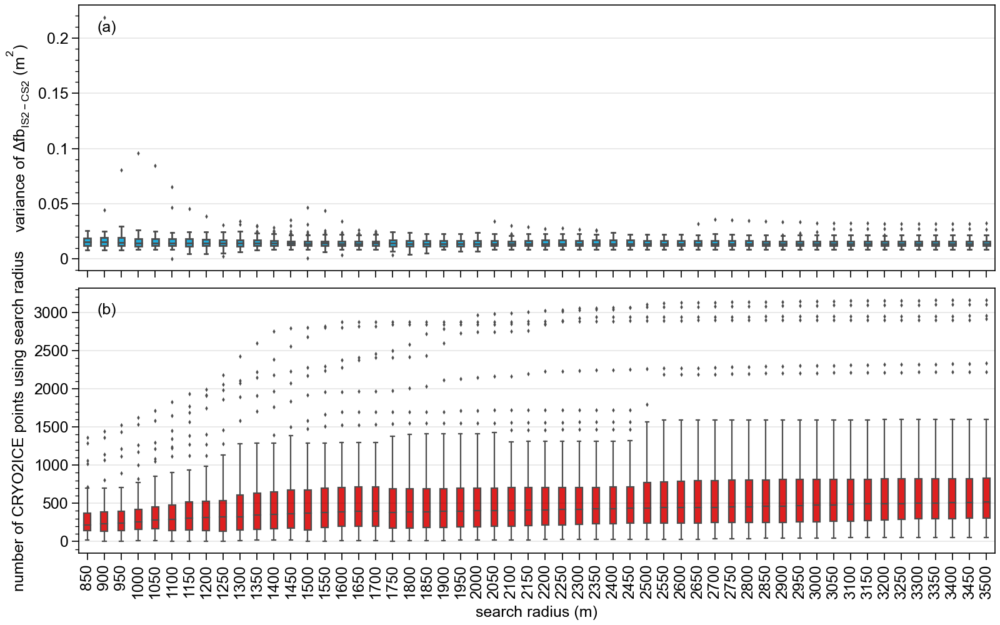

In [12]:
import seaborn as sns

fig,ax = plt.subplots(nrows=2, figsize=(8,5), constrained_layout=True, sharex=True)
g=sns.boxplot(x="distance_total", y="variance_total",
                 data=frame, color='deepskyblue', ax = ax[0], width=0.4, linewidth=1, fliersize=0.5)
ax[0].set_xlabel('')

g=sns.boxplot(x="distance_total", y="N_total",
                 data=frame, color='red', ax=ax[1], width=0.4, linewidth=0.8, fliersize=0.5)
#g.set_xticklabels(ax.get_xticklabels(),rotation=90)
g.set_xticklabels(np.arange(850, 3550, 50),rotation=90)

ax[0].set_ylabel(r'variance of $\Delta{fb}_{IS2-CS2}$ (m$^2$)')
ax[1].set_ylabel(r'number of CRYO2ICE points using search radius')
plt.xlabel('search radius (m)')

ax[0].tick_params(axis='x', which='minor', bottom=False)
ax[1].tick_params(axis='x', which='minor', bottom=False)
#ax[0].set_ylim([0, 0.05])

ax[0].text(0.02, 0.90,'(a)',transform = ax[0].transAxes)
ax[1].text(0.02, 0.90,'(b)',transform = ax[1].transAxes)

plt.show()


Text(0.5, 0, 'search radius (m)')

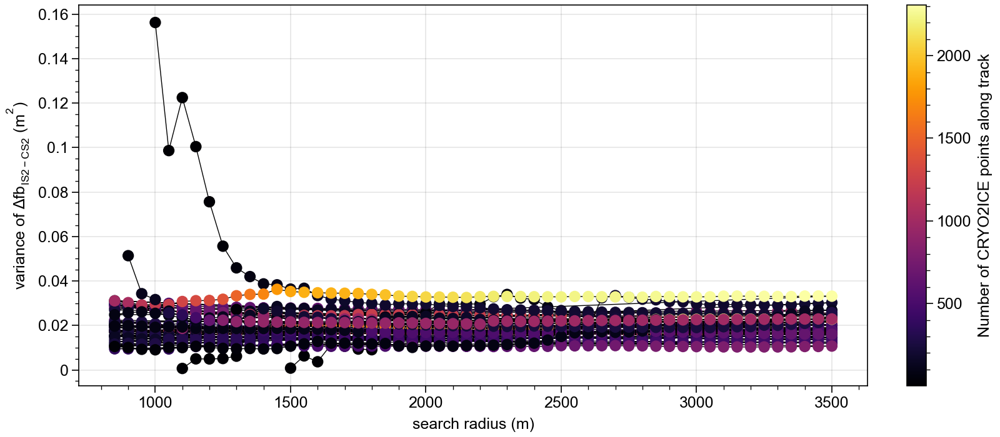

In [6]:
fig,ax = plt.subplots(figsize=(8,3.5), constrained_layout=True)
plt.plot(frame['distance_total'], frame['variance_total'],ls='-', lw=0.5, c='k',zorder=-1)
im = plt.scatter(frame['distance_total'], frame['variance_total'], c=frame['N_total'], vmin=np.round(np.min(frame['N_total'])), vmax=np.round(np.max(frame['N_total'])), cmap='inferno', zorder=2)

plt.colorbar(im,label='Number of CRYO2ICE points along track')
plt.ylabel(r'variance of $\Delta{fb}_{IS2-CS2}$ (m$^2$)')
plt.xlabel('search radius (m)')

# Along-track examples 

In [75]:
################################### MANUAL SELECTION

### November
#fp1 = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_original_MSS\CRYO2ICE_w99_smooth\November\CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test.csv'
#df_jan = pd.read_csv(fp1, index_col=None, header=0)
#filename_icetype = 'ice_type_nh_polstere-100_multi_202011101200.nc'
#fname_AMSR2 = r'E:\DTU\CRYO2ICE\AMSR2\November\AMSR_U2_L3_SeaIce12km_B04_20201110.he5'
#fp1_lead = r'E:\DTU\CRYO2ICE\Data\CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001.nc'
#name_along_track = 'E:\demo_CRYO2ICE_roughness_including_leads_nov_r3500_original_MSS_v2_final.png'
#name_along_track_lowess = 'E:\demo_CRYO2ICE_roughness_including_leads_nov_r3500_original_MSS_v2_final_lowess_filter.png'
#name_along_track_lowess_filter = 'E:\demo_CRYO2ICE_roughness_including_leads_nov_r3500_original_MSS_v2_final_lowess_snow_depth.png'
#name_map = 'E:\demo_CRYO2ICE_roughness_location_nov2020_original_MSS.png'
#n1, n2 = 500, 1350
#xlabel_set = ''
#label_a, label_b = '(a)', '(b)'
#label_month = 'November'
#legend_check = True


## January
#fp1 = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_original_MSS\CRYO2ICE_w99_smooth\January\CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T133202_20210130T134203_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test.csv'
#df_jan = pd.read_csv(fp1, index_col=None, header=0)
#filename_icetype = 'ice_type_nh_polstere-100_multi_202101301200.nc'
#fname_AMSR2 = r'E:\DTU\CRYO2ICE\AMSR2\January\AMSR_U2_L3_SeaIce12km_B04_20210130.he5'
#fp1_lead = r'E:\DTU\CRYO2ICE\Data\CS_OFFL_SIR_SAR_2__20210130T133202_20210130T134203_D001.nc'
#name_along_track = 'E:\demo_CRYO2ICE_roughness_including_leads_jan_r3500_original_MSS_v2_final.png'
#name_along_track_lowess = 'E:\demo_CRYO2ICE_roughness_including_leads_jan_r3500_original_MSS_v2_final_lowess_filter.png'
#name_along_track_lowess_filter = 'E:\demo_CRYO2ICE_roughness_including_leads_jan_r3500_original_MSS_v2_final_lowess_snow_depth.png'
#name_map = 'E:\demo_CRYO2ICE_roughness_location_jan2021_original_MSS.png'
#n1, n2 = 500, 1000
#xlabel_set = ''
#label_a, label_b = '(c)', '(d)'
#label_month = 'January'
#legend_check = False

## March 
fp1 = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_original_MSS\CRYO2ICE_w99_smooth\March\CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T093327_20210317T094059_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test.csv'
filename_icetype = 'ice_type_nh_polstere-100_multi_202103171200.nc'
fname_AMSR2 = r'E:\DTU\CRYO2ICE\AMSR2\March\AMSR_U2_L3_SeaIce12km_B04_20210317.he5'
fp1_lead = r'E:\DTU\CRYO2ICE\Data\CS_OFFL_SIR_SAR_2__20210317T093327_20210317T094059_D001.nc'
name_along_track = 'E:\demo_CRYO2ICE_roughness_including_leads_mar_r3500_original_MSS_v2_final.png'
name_along_track_lowess = 'E:\demo_CRYO2ICE_roughness_including_leads_mar_r3500_original_MSS_v2_final_lowess_filter.png'
name_along_track_lowess_filter = 'E:\demo_CRYO2ICE_roughness_including_leads_mar_r3500_original_MSS_v2_final_lowess_snow_depth.png'
name_map = 'E:\demo_CRYO2ICE_roughness_location_mar2021_original_MSS.png'
df_jan = pd.read_csv(fp1, index_col=None, header=0)
n1, n2 = 500, 1350
xlabel_set = 'along-track distance (km)'
label_a, label_b = '(e)', '(f)'
label_month = 'March'
legend_check = False

#######
df_jan = df_jan.drop(columns=['Unnamed: 0', 'level_0'])
df_jan.loc[df_jan['AMSR2_snow_depth']<-1000, 'AMSR2_snow_depth'] = np.nan

################################### AUTOMATIC

### compute along-track using CRYO2ICE as baseline
basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
txt1 = basename_without_ext.split('_')[9]
ID_CS2=np.int(txt1.split('T')[1])

from datetime import datetime
# miles/s to m/s (multipy with 1609)
speed_CS2_m_pr_s = 4.35*1609
speed_CS2_m_pr_s

df_test = df_jan.reset_index()
diff_t_total = []
for i in df_test['time']:
    diff_t = datetime.strptime(df_test['time'][0],"%Y-%m-%d %H:%M:%S.%f")-datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
    diff_t_total = np.append(diff_t_total, diff_t.total_seconds())
along_track_dist =  np.abs(diff_t_total)*speed_CS2_m_pr_s

df_jan = df_test
df_jan['along_track_dist_in_metres'] = along_track_dist
df_jan['along_track_dist_in_km'] = along_track_dist/1e3

from statsmodels.nonparametric.smoothers_lowess import lowess as  sm_lowess
frac_comb = 1/50
x,y = df_jan['along_track_dist_in_metres'], df_jan['fb']
sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
df_jan['lowess_along_track_dist_metres']=sm_x
df_jan['lowess_along_track_dist_km']=sm_x/1000
df_jan['lowess_fb']=np.nan
df_jan['lowess_fb'][df_jan['fb'].notnull()]=sm_y
x,y = df_jan['along_track_dist_in_metres'], df_jan['LARM_rfb']
sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
df_jan['lowess_LARM_rfb']=np.nan
df_jan['lowess_LARM_rfb'][df_jan['LARM_rfb'].notnull()]=sm_y
x,y = df_jan['along_track_dist_in_metres'], df_jan['CCI_rfb']
sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
df_jan['lowess_CCI_rfb']=np.nan
df_jan['lowess_CCI_rfb'][df_jan['CCI_rfb'].notnull()]=sm_y


ds=0.3
ns = (1+0.51*ds)**1.5
df_jan['snow_depth_original_MSS'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['fb'])*(1/ns)
df_jan['snow_depth_original_MSS_CCI'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['CCI_rfb'])*(1/ns)
df_jan['snow_depth_original_MSS_LARM'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['LARM_rfb'])*(1/ns)

df_jan['lowess_snow_depth_original_MSS'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_fb'])*(1/ns)
df_jan['lowess_snow_depth_original_MSS_CCI'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_CCI_rfb'])*(1/ns)
df_jan['lowess_snow_depth_original_MSS_LARM'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_LARM_rfb'])*(1/ns)

df_jan_short = df_jan[n1:n2]



### download L2 data for lead observations and compute along-track distance
ds = netCDF4.Dataset(fp1_lead, 'r')
CS2_lead = ds.variables['height_sea_ice_lead_20_ku'][:]
lat_lead = ds.variables['lat_poca_20_ku'][:]
lon_lead = ds.variables['lon_poca_20_ku'][:]

tname = "time_20_ku"
nctime = ds.variables[tname][:] # get values
t_unit = ds.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"
t_cal = ds.variables[tname].calendar
tvalue = num2date(nctime,units = t_unit,calendar = t_cal)
#str_time = [i.strftime("%Y-%m-%d %H:%M:%S") for i in tvalue] # to display dates as string
str_time = [str(i) for i in tvalue]

df_CS2_lead_jan = pd.DataFrame({'lead_CS2':CS2_lead, 'lat':lat_lead, 'lon':lon_lead, 'time':str_time})

from datetime import datetime
# miles/s to m/s (multipy with 1609)
speed_CS2_m_pr_s = 4.35*1609
speed_CS2_m_pr_s

df_test = df_CS2_lead_jan.reset_index()
diff_t_total = []
for i in df_CS2_lead_jan['time']:
    diff_t = datetime.strptime(df_jan['time'][0],"%Y-%m-%d %H:%M:%S.%f")-datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
    diff_t_total = np.append(diff_t_total, diff_t.total_seconds())
along_track_dist =  np.abs(diff_t_total)*speed_CS2_m_pr_s

df_CS2_lead_jan = df_test
df_CS2_lead_jan['along_track_dist_in_metres'] = along_track_dist
df_CS2_lead_jan['along_track_dist_in_km'] = along_track_dist/1e3

df_CS2_lead_jan = df_CS2_lead_jan[(df_CS2_lead_jan['lat']>df_jan_short['lat'].min()) & (df_CS2_lead_jan['lat']<df_jan_short['lat'].max()) & (df_CS2_lead_jan['lon']>df_jan_short['lon'].min()) & (df_CS2_lead_jan['lon']<df_jan_short['lon'].max())]
df_CS2_lead_jan_check = df_CS2_lead_jan[(df_CS2_lead_jan['along_track_dist_in_metres']>=df_jan_short['along_track_dist_in_metres'].min()) & (df_CS2_lead_jan['along_track_dist_in_metres']<=df_jan_short['along_track_dist_in_metres'].max())]


## Compute 25 km segments
j=25e3 # in metres
idx_multiplic = int(np.floor(np.max(df_jan['along_track_dist_in_metres'])/j))
new_idx = np.arange(0+j/2, idx_multiplic*j, j)

lat_new, lon_new, C2I_new, C2I_LARM_new, C2I_CCI_new, AMSR2_new, SMLGv1_new, SMLGv2_new = np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx))
for i in np.arange(0, len(new_idx)):
    bol=df_jan['along_track_dist_in_metres']-new_idx[i]
    idx = np.where(abs(bol)<=j/2)
    if len(idx) >=1:
        lat_new[i] = np.nanmean(df_jan['lat'].iloc[idx])
        lon_new[i] = np.nanmean(df_jan['lon'].iloc[idx])
        C2I_new[i] = np.nanmean(df_jan['snow_depth_original_MSS_smoothed'].iloc[idx])
        C2I_LARM_new[i] = np.nanmean(df_jan['snow_depth_original_MSS_LARM_smoothed'].iloc[idx])
        C2I_CCI_new[i] = np.nanmean(df_jan['snow_depth_original_MSS_CCI_smoothed'].iloc[idx])
        AMSR2_new[i] = np.nanmean(df_jan['AMSR2_snow_depth'].iloc[idx])/100
        SMLGv1_new[i] = np.nanmean(df_jan['SMLG_snow_depth'].iloc[idx])
        SMLGv2_new[i] = np.nanmean(df_jan['SMLG_snow_depth_v2'].iloc[idx])
    else:
        lat_new[i] = np.nan
        lon_new[i] = np.nan
        C2I_new[i] = np.nan
        C2I_LARM_new[i] = np.nan
        C2I_CCI_new[i] = np.nan
        AMSR2_new[i] = np.nan
        SMLGv1_new[i] = np.nan
        SMLGv2_new[i] = np.nan

df_new = pd.DataFrame({'lat':lat_new, 'lon':lon_new,'along_track_dist_in_metres':new_idx, 'C2I_snow_depth':C2I_new, 'C2I_LARM_snow_depth':C2I_LARM_new,
         'C2I_CCI_snow_depth':C2I_CCI_new, 'AMSR2_snow_depth':AMSR2_new, 'SMLG_snow_depth':SMLGv1_new, 
         'SMLG_snow_depth':SMLGv2_new})
df_new_short = df_new[df_new['along_track_dist_in_metres']<np.max(df_jan_short['along_track_dist_in_metres'])]
df_new_short = df_new_short[df_new_short['along_track_dist_in_metres']>np.min(df_jan_short['along_track_dist_in_metres'])]



C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/2711842726.py:61: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ID_CS2=np.int(txt1.split('T')[1])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/2711842726.py:186: RuntimeWarning: Mean of empty slice
  AMSR2_new[i] = np.nanmean(df_jan['AMSR2_snow_depth'].iloc[idx])/100
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/2711842726.py:181: RuntimeWarning: Mean of empty slice
  lat_new[i] = np.nanmean(df_jan['lat'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/2711842726.py:182: Runt

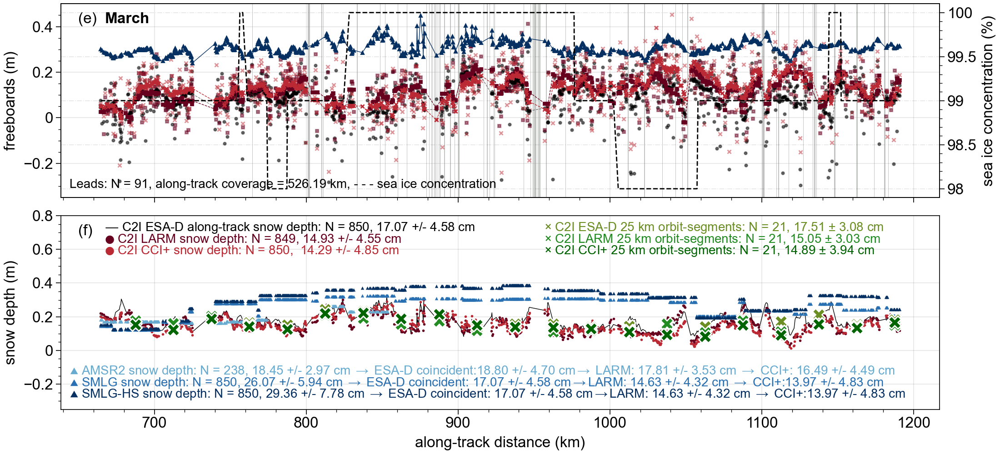

In [76]:
import proplot as pplot
from matplotlib.colors import LinearSegmentedColormap,rgb2hex
fig, axs = plt.subplots(2, figsize=(11,5), constrained_layout=True)
#axs[0].plot(df_IS2_new['lat'], df_IS2_new['fb'], c='grey', ls='', marker='.', markersize=0.8)

#cmap_qual = plt.get_cmap('538')
cmap_check = plt.cm.get_cmap('BuRd_r')
cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))),
            rgb2hex(cmap_check((5/8))), rgb2hex(cmap_check(6/8)), rgb2hex(cmap_check(7/8)), rgb2hex(cmap_check(8/8))]
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))

ax2 = axs[0].twinx()
axs[0].plot(df_jan_short['along_track_dist_in_km'], df_jan_short['fb'] ,'o', c='k', markersize=2, ls='', lw=0.5, alpha=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['LARM_rfb'], 's',c=cmap_qual(0), markersize=2, ls='', lw=0.5, alpha=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['CCI_rfb'], 'x',c=cmap_qual(1), markersize=3, ls='', lw=0.5, alpha=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['IS2_w_mean_fb_MSS'], '^',c=cmap_qual(7), markersize=2, ls='-', lw=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'], df_jan_short['CS2_smooth'] ,'o', c='k', markersize=2, ls='--', lw=0.5, alpha=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['LARM_rfb_smooth'], 's',c=cmap_qual(0), markersize=2, ls='--', lw=0.5)
axs[0].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['CCI_rfb_smooth'], 'x',c=cmap_qual(1), markersize=3, ls='--', lw=0.5)


axs[0].vlines(df_CS2_lead_jan_check[df_CS2_lead_jan_check['lead_CS2']>0]['along_track_dist_in_km'], -0.5, 1,ls='-', color='grey', linewidth=0.2, label='_nolegend_')
ax2.plot(df_jan_short['along_track_dist_in_km'],df_jan_short['AMSR2_SIC'], c='k', ls='--', lw=1)
ax2.set_ylabel('sea ice concentration (%)', color='k', fontsize=12)
ax2.grid(ls='-.')

axs[1].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['snow_depth_original_MSS_smoothed'] , c='k',ls='-', linewidth=0.5, label='_nolegend_')
axs[1].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['snow_depth_original_MSS_LARM_smoothed'] , 'o', c=cmap_qual(0), markersize=1, label='_nolegend_')
axs[1].plot(df_jan_short['along_track_dist_in_km'],df_jan_short['snow_depth_original_MSS_CCI_smoothed'] , 'o', c=cmap_qual(1), markersize=1, label='_nolegend_')
axs[1].plot(df_jan_short['along_track_dist_in_km'],(df_jan_short['AMSR2_snow_depth'])/100 ,'^', c=cmap_qual(4),markersize=1, label='_nolegend_')
axs[1].plot(df_jan_short['along_track_dist_in_km'],(df_jan_short['SMLG_snow_depth']) ,'^', c=cmap_qual(5),markersize=1, label='_nolegend_')
axs[1].plot(df_jan_short['along_track_dist_in_km'],(df_jan_short['SMLG_snow_depth_v2']) ,'^', c=cmap_qual(6),markersize=1, label='_nolegend_')


df_jan_short_restrict = df_jan_short[(df_jan_short['ppk']<9) & (df_jan_short['ssd']>6.29)]
axs[0].set_ylim(-0.35, 0.5)
axs[1].set_ylim(-0.35, 0.8)


df_jan_AMSR2_points = df_jan_short[df_jan_short['AMSR2_snow_depth'].notna()]
df_jan_SMLG_points = df_jan_short[df_jan_short['SMLG_snow_depth'].notna()]
df_jan_LARM_points = df_jan_SMLG_points[df_jan_SMLG_points['LARM_rfb'].notna()]
df_jan_CCI_points = df_jan_LARM_points[df_jan_LARM_points['LARM_rfb'].notna()]


txt_CRYO2ICE =u"$\u23e4$ "+r'C2I ESA-D along-track snow depth: N = {}, {:.2f} +/- {:.2f} cm'.format(len(df_jan_short['snow_depth_original_MSS_smoothed']), np.nanmean(df_jan_short['snow_depth_original_MSS_smoothed'])*100, np.nanstd(df_jan_short['snow_depth_original_MSS_smoothed'])*100)
txt_CRYO2ICE_LARM =u"$\u26ab$ "+r'C2I LARM snow depth: N = {}, {:.2f} +/- {:.2f} cm'.format(len(df_jan_short[df_jan_short['snow_depth_original_MSS_LARM_smoothed'].notna()]), np.nanmean(df_jan_short['snow_depth_original_MSS_LARM_smoothed'])*100, np.nanstd(df_jan_short['snow_depth_original_MSS_LARM_smoothed'])*100)
txt_CRYO2ICE_CCI =u"$\u26ab$ "+r'C2I CCI+ snow depth: N = {},  {:.2f} +/- {:.2f} cm'.format(len(df_jan_short[df_jan_short['snow_depth_original_MSS_CCI_smoothed'].notna()]), np.nanmean(df_jan_short['snow_depth_original_MSS_CCI_smoothed'])*100, np.nanstd(df_jan_short['snow_depth_original_MSS_CCI_smoothed'])*100)
txt_AMSR2 = r'$\blacktriangle$ AMSR2 snow depth: N = {}, {:.2f} +/- {:.2f} cm $\rightarrow$ ESA-D coincident:{:.2f} +/- {:.2f} cm'.format(len(df_jan_AMSR2_points['AMSR2_snow_depth']), np.nanmean(df_jan_AMSR2_points['AMSR2_snow_depth']), np.nanstd(df_jan_AMSR2_points['AMSR2_snow_depth']), np.nanmean(df_jan_AMSR2_points['snow_depth_original_MSS_smoothed'])*100, np.nanstd(df_jan_AMSR2_points['snow_depth_original_MSS_smoothed'])*100)
txt_SMLG = r'$\blacktriangle$ SMLG snow depth: N = {}, {:.2f} +/- {:.2f} cm $\rightarrow$ ESA-D coincident: {:.2f} +/- {:.2f} cm'.format(len(df_jan_SMLG_points['SMLG_snow_depth']), np.nanmean(df_jan_SMLG_points['SMLG_snow_depth']*100), np.nanstd(df_jan_SMLG_points['SMLG_snow_depth']*100), np.nanmean(df_jan_SMLG_points['snow_depth_original_MSS_smoothed'])*100, np.nanstd(df_jan_SMLG_points['snow_depth_original_MSS_smoothed'])*100)
txt_AMSR2_LARM_CCI = r'$\rightarrow$ LARM: {:.2f} +/- {:.2f} cm $\rightarrow$ CCI+: {:.2f} +/- {:.2f} cm'.format(np.nanmean(df_jan_AMSR2_points['snow_depth_original_MSS_LARM_smoothed'])*100, np.nanstd(df_jan_AMSR2_points['snow_depth_original_MSS_LARM_smoothed'])*100, np.nanmean(df_jan_AMSR2_points['snow_depth_original_MSS_CCI_smoothed'])*100, np.nanstd(df_jan_AMSR2_points['snow_depth_original_MSS_CCI_smoothed'])*100)
txt_SMLG_LARM_CCI = r'$\rightarrow$LARM: {:.2f} +/- {:.2f} cm $\rightarrow$ CCI+:{:.2f} +/- {:.2f} cm'.format( np.nanmean(df_jan_LARM_points['snow_depth_original_MSS_LARM_smoothed']*100), np.nanstd(df_jan_LARM_points['snow_depth_original_MSS_LARM_smoothed']*100), np.nanmean(df_jan_CCI_points['snow_depth_original_MSS_CCI_smoothed']*100), np.nanstd(df_jan_CCI_points['snow_depth_original_MSS_CCI_smoothed']*100))

txt_SMLG_v2 = r'$\blacktriangle$ SMLG-HS snow depth: N = {}, {:.2f} +/- {:.2f} cm $\rightarrow$ ESA-D coincident: {:.2f} +/- {:.2f} cm'.format(len(df_jan_SMLG_points['SMLG_snow_depth']), np.nanmean(df_jan_SMLG_points['SMLG_snow_depth_v2']*100), np.nanstd(df_jan_SMLG_points['SMLG_snow_depth_v2']*100), np.nanmean(df_jan_SMLG_points['snow_depth_original_MSS_smoothed'])*100, np.nanstd(df_jan_SMLG_points['snow_depth_original_MSS_smoothed'])*100)
txt_SMLG_LARM_CCI_v2 = r'$\rightarrow$ LARM: {:.2f}+/- {:.2f} cm $\rightarrow$ CCI+ coincident: {:.2f} +/- {:.2f} cm'.format( np.nanmean(df_jan_LARM_points['snow_depth_original_MSS_LARM_smoothed']*100), np.nanstd(df_jan_LARM_points['snow_depth_original_MSS_LARM_smoothed']*100), np.nanmean(df_jan_CCI_points['snow_depth_original_MSS_CCI_smoothed']*100), np.nanstd(df_jan_CCI_points['snow_depth_original_MSS_CCI_smoothed']*100))



font_size_snow = 10
axs[1].text(0.05, 0.92, txt_CRYO2ICE, transform = axs[1].transAxes, fontsize=font_size_snow, color='k')
axs[1].text(0.05, 0.86, txt_CRYO2ICE_LARM, transform = axs[1].transAxes, fontsize=font_size_snow, color=cmap_qual(0))
axs[1].text(0.05, 0.80, txt_CRYO2ICE_CCI, transform = axs[1].transAxes, fontsize=font_size_snow, color=cmap_qual(1))

axs[1].text(0.01, 0.18, txt_AMSR2+txt_AMSR2_LARM_CCI, transform = axs[1].transAxes, fontsize=font_size_snow, color=cmap_qual(4))
axs[1].text(0.01, 0.12, txt_SMLG+txt_SMLG_LARM_CCI, transform = axs[1].transAxes, fontsize=font_size_snow, color=cmap_qual(5))
axs[1].text(0.01, 0.06, txt_SMLG_v2+txt_SMLG_LARM_CCI, transform = axs[1].transAxes, fontsize=font_size_snow, color=cmap_qual(6))


axs[0].set_ylabel('freeboards (m)', fontsize=12)
axs[1].set_ylabel('snow depth (m)', fontsize=12)
axs[1].set_xlabel(xlabel_set,  fontsize=12)

axs[0].text(0.02, 0.9, label_a, transform = axs[0].transAxes, fontsize=12)
axs[1].text(0.02, 0.9, label_b, transform = axs[1].transAxes, fontsize=12)

along_track_dist = np.abs(np.max(df_jan_short['along_track_dist_in_km'])-np.min(df_jan_short['along_track_dist_in_km']))
axs[0].text(0.05, 0.9, label_month, transform = axs[0].transAxes, fontsize=12,weight='bold')
axs[0].text(0.01, 0.05, 'Leads: N = {}, along-track coverage = {:.2f} km'.format(len(df_CS2_lead_jan_check[df_CS2_lead_jan_check['lead_CS2']>0]),along_track_dist)+ ", - - - sea ice concentration", transform = axs[0].transAxes, fontsize=font_size_snow)

axs[1].plot(df_new_short['along_track_dist_in_metres']/1e3, df_new_short['C2I_snow_depth'], 'X', c='olivedrab', markeredgecolor='w',markersize=10, label='CRYO2ICE 25 km')
axs[1].plot(df_new_short['along_track_dist_in_metres']/1e3, df_new_short['C2I_LARM_snow_depth'], 'X', c='forestgreen', markeredgecolor='w',markersize=10, label='CRYO2ICE LARM 25 km')
axs[1].plot(df_new_short['along_track_dist_in_metres']/1e3, df_new_short['C2I_CCI_snow_depth'], 'X', c='darkgreen', markeredgecolor='w',markersize=10, label='CRYO2ICE CCI 25 km')

axs[0].tick_params(labelsize=12)
axs[1].tick_params(labelsize=12)
ax2.tick_params(labelsize=12)
#ax3.tick_params(labelsize=10)

txt_CRYO2ICE =r"$\times$ "+r'C2I ESA-D 25 km orbit-segments: N = {}, {:.2f} $\pm$ {:.2f} cm'.format(len(df_new_short['C2I_snow_depth']), np.nanmean(df_new_short['C2I_snow_depth'])*100, np.nanstd(df_new_short['C2I_snow_depth'])*100)
txt_CRYO2ICE_LARM =r"$\times$ "+r'C2I LARM 25 km orbit-segments: N = {}, {:.2f} $\pm$ {:.2f} cm'.format(len(df_new_short['C2I_LARM_snow_depth']), np.nanmean(df_new_short['C2I_LARM_snow_depth'])*100, np.nanstd(df_new_short['C2I_LARM_snow_depth'])*100)
txt_CRYO2ICE_CCI =r"$\times$ "+r'C2I CCI+ 25 km orbit-segments: N = {}, {:.2f} $\pm$ {:.2f} cm'.format(len(df_new_short['C2I_CCI_snow_depth']), np.nanmean(df_new_short['C2I_CCI_snow_depth'])*100, np.nanstd(df_new_short['C2I_CCI_snow_depth'])*100)

axs[1].text(0.55, 0.92, txt_CRYO2ICE, c='olivedrab', transform=axs[1].transAxes,fontsize=10)
axs[1].text(0.55, 0.86, txt_CRYO2ICE_LARM, c='forestgreen', transform=axs[1].transAxes,fontsize=10)
axs[1].text(0.55, 0.80, txt_CRYO2ICE_CCI, c='darkgreen', transform=axs[1].transAxes,fontsize=10)

if legend_check is True:
    legend=axs[0].legend(['CS2 ESA-D freeboard', 'CS2 LARM freeboard', 'CS2 CCI+ freeboard','IS2 weighted freeboard', 'CS2 ESA-D smoothed', 'CS2 LARM smoothed', 'CS2 CCI+ smoothed'], loc='lower right', scatterpoints=3,fontsize=10, ncol=2)
    legend.legendHandles[0]._legmarker.set_markersize(5)
    legend.legendHandles[1]._legmarker.set_markersize(5)
    legend.legendHandles[2]._legmarker.set_markersize(5)
    legend.legendHandles[3]._legmarker.set_markersize(5)
    legend.legendHandles[4]._legmarker.set_markersize(5)
    legend.legendHandles[5]._legmarker.set_markersize(5)
    legend.legendHandles[6]._legmarker.set_markersize(5)


axs[0].grid(axis='y',ls='-')
axs[1].grid(ls='-')

plt.setp(axs[0].get_xticklabels(), visible=False)
plt.savefig(name_along_track, transparent=True)     

In [ ]:
fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20201110.he5'
file = h5py.File(fname, 'r')
file.keys()
lon = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lon'])
lat = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lat'])
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
sea_ice_concentration= np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_ICECON_DAY'])
file.close()

In [ ]:
missing_snow_depth  = np.where(snow_depth != 110, np.nan, snow_depth)
land_snow_depth  = np.where(snow_depth != 120, np.nan, snow_depth)
OW_snow_depth  = np.where(snow_depth != 130, np.nan, snow_depth)
MYI_snow_depth  = np.where(snow_depth != 140, np.nan, snow_depth)
variability_snow_depth  = np.where(snow_depth != 150, np.nan, snow_depth)
melt_snow_depth  = np.where(snow_depth != 160, np.nan, snow_depth)
snow_depth_only  = np.where(snow_depth > 100, np.nan, snow_depth)

sea_ice_concentration_only = np.where(sea_ice_concentration > 100, np.nan, sea_ice_concentration)

In [ ]:
def plot_panArctic8(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    
    lat_new = np.where(sit == np.nan, np.nan, lat)
    lon_new = np.where(sit == np.nan, np.nan, lon)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=75,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    m.drawmapboundary(fill_color='white')
    #cbar = m.etopo()
    x=m.scatter(lon_new, lat_new, latlon=True, c=cmap_set, s=50, zorder=1, marker='.')
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def plot_panArctic9(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=75,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    m.drawmapboundary(fill_color='white')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=5,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

from matplotlib.lines import Line2D
fig, ax = plt.subplots(ncols=2, figsize=(8,5), constrained_layout=True)
title = ''
im = plot_panArctic6(lon, lat, snow_depth, 0, 50, 'summer', 'radar freeboard (m)','max', ax[0],fig)

plt.colorbar(im, ax=ax[0],orientation = 'horizontal', label='snow depth (cm)', extend='max')



fig.patch.set_facecolor('white')
#ax = plt.gca()
#m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
x1 = -180
x2 = 180
y1 = 0
y2 = 90
cmap1 = plt.get_cmap('greys', 4)


m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=75,lon_0=0, resolution='i',ax=ax[0], round=True)
m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
m.drawcoastlines(linewidth=0.5)
m.fillcontinents(color='lightgray')
m.drawmapboundary(fill_color='black')
m.contour(lon, lat, snow_depth,[100],latlon=True, colors='k', linewidths=0.5, zorder=1)



#plt.savefig('E:\CRYO2ICE_AMSR2_jan_comparison.png', transparent=True)

# Compute monthly comparison with LARM, SMLG and AMSR2 snow depths

In [54]:
def CRYO2ICE_AMSR2_NN(df3_short,df_AMSR2):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    ## Only data within 825 m of CryoSat-2 footprint (find approximate area of coincident data)
    query_lats = df3_short[['lat']].to_numpy()
    query_lons = df3_short[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_AMSR2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    
    data_check = df3_short
    NN_SIC, NN_SD= [], []
    for i in indices:
        NN_SIC = np.append(NN_SIC, df_AMSR2['sea_ice_concentration'][int(i)])
        NN_SD = np.append(NN_SD, df_AMSR2['snow_depth'][int(i)])

    data_check['AMSR2_SIC'] = NN_SIC
    data_check['AMSR2_snow_depth'] = NN_SD
    
    return data_check

def proj_polarstereo_to_latlon(X, Y):
    import pyproj
    # Output coordinates are in WGS 84 longitude and latitude
    projOut= pyproj.Proj(init='epsg:4326')

    # Input coordinates are in meters on the Polar Stereographic 
    # projection given in the netCDF file
    #projIn = pyproj.Proj('+proj=stere +lat_0=90 +lat_ts=70 +lon_0=-45 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs ',preserve_units=True)
    projIn = pyproj.Proj(init='epsg:3408')
    
    lon, lat = pyproj.transform(projIn, projOut, X, Y)
    
    return lon, lat

def CRYO2ICE_SMLG_NN(df3_short,df_AMSR2):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    ## Only data within 825 m of CryoSat-2 footprint (find approximate area of coincident data)
    query_lats = df3_short[['lat']].to_numpy()
    query_lons = df3_short[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_AMSR2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    
    data_check = df3_short
    NN_SD= []
    for i in indices:
        NN_SD = np.append(NN_SD, df_AMSR2['snow_depth'][int(i)])

    data_check['SMLG_snow_depth'] = NN_SD
    
    return data_check

def CRYO2ICE_SMLG_NN_v2(df3_short,df_AMSR2):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    ## Only data within 825 m of CryoSat-2 footprint (find approximate area of coincident data)
    query_lats = df3_short[['lat']].to_numpy()
    query_lons = df3_short[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_AMSR2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    
    data_check = df3_short
    NN_SD= []
    for i in indices:
        NN_SD = np.append(NN_SD, df_AMSR2['snow_depth'][int(i)])

    data_check['SMLG_snow_depth_v2'] = NN_SD
    
    return data_check

def CRYO2ICE_ERA5_NN(df3_short,df_AMSR2):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    ## Only data within 825 m of CryoSat-2 footprint (find approximate area of coincident data)
    query_lats = df3_short[['lat']].to_numpy()
    query_lons = df3_short[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_AMSR2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    
    data_check = df3_short
    NN_t2m, NN_msl= [], []
    for i in indices:
        NN_t2m = np.append(NN_t2m, df_AMSR2['t2m'][int(i)])
        NN_msl = np.append(NN_msl, df_AMSR2['msl'][int(i)])

    data_check['ERA5_t2m'] = NN_t2m
    data_check['ERA5_msl'] = NN_msl
    
    return data_check

def numpy_nan_mean(a):
    
    return np.nan if np.all(a!=a) else np.nanmean(a)

def CRYO2ICE_smooth_CS2_data_other_fb(df_CS2, var, name):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['lat']].to_numpy()
    query_lons = df_CS2[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_CS2[['lat', 'lon']].values),  metric='haversine')

    dist_in_metres = 3500
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres

    w_mean_fb_IS2 = np.empty(len(query_lats))
    k = 0
    for i in is_within:
        data_fb_mean_IS2 = df_CS2[var].iloc[i]
        w_mean_fb_IS2[k] = numpy_nan_mean(data_fb_mean_IS2)


        k = k+1
    
    df_CS2_new = pd.DataFrame({name:w_mean_fb_IS2})
    
    return df_CS2_new

In [58]:
print('Loading datetime format for SnowModel-LG V1...')
import datetime # Python standard library datetime module
from netCDF4 import Dataset,num2date # http://unidata.github.io/netcdf4-python/
fp1 = r'E:\DTU\CRYO2ICE\Data\SM_snod_ERA5_01Aug1980-31Jul2021_v01.nc'
file_in = Dataset(fp1,"r",format="NETCDF4")
tname = "time"
nctime = file_in.variables[tname][:] # get values
t_unit = file_in.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"
t_cal = file_in.variables[tname].calendar
tvalue = num2date(nctime,units = t_unit,calendar = t_cal)
str_time = [i.strftime("%Y-%m-%d %H:%M") for i in tvalue] # to display dates as string

print('Loading datetime format for SnowModel-LG V2...')
import datetime # Python standard library datetime module
from netCDF4 import Dataset,num2date # http://unidata.github.io/netcdf4-python/
fp1 = r'E:\DTU\CRYO2ICE\Data\SM_snod_MERRA2_ease_01Aug1980-31Jul2021_v02.nc'
file_in = Dataset(fp1,"r",format="NETCDF4")
tname = "time"
nctime = file_in.variables[tname][:] # get values
t_unit = file_in.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"
t_cal = file_in.variables[tname].calendar
tvalue = num2date(nctime,units = t_unit,calendar = t_cal)
str_time_v2 = [i.strftime("%Y-%m-%d %H:%M") for i in tvalue] # to display dates as string


Loading datetime format for SnowModel-LG V1...
Loading datetime format for SnowModel-LG V2...


'\nprint(\'Import ERA5 data...\')\nfrom netCDF4 import num2date\nimport datetime \nncfile = netCDF4.Dataset(\'E:/DTU/CRYO2ICE/adaptor.mars.internal-1682078174.7083752-31888-14-8447dad6-9f2b-4035-9c58-d758fbd9ba63.nc\', \'r\') \ntime_ERA5 = ncfile.variables[\'time\'][:]  #1D\nlongitude_ERA5 = ncfile.variables[\'longitude\'][:] \nlatitude_ERA5 = ncfile.variables[\'latitude\'][:]\nsnowfall_ERA5 = ncfile.variables[\'t2m\'][:,:,:]#3D (time x lat x lon) # air temperature\nsnowdepth_ERA5 = ncfile.variables[\'msl\'][:,:,:] # mean sea level pressure\ntname=\'time\'\nnctime = ncfile.variables[tname][:] # get values\nt_unit = ncfile.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"\nt_cal = ncfile.variables[tname].calendar\ntvalue = num2date(nctime,units = t_unit,calendar = t_cal)\n#str_time = [i.strftime("%Y-%m-%d %H:%M:%S") for i in tvalue] # to display dates as string\nstr_time_ERA5 = [str(i) for i in tvalue]\n'

In [60]:
files_check_CS2_L2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_DTU21MSS/*D001_original_MSS_smooth.h5
month_folder = 'All'
mallet_flag = False

def NN_search_W99(df_CS2_new, df_IS2, variable):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2_new[['lat']].to_numpy()
    query_lons = df_CS2_new[['lon']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    distances, indices = tree.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    
    mss_interp = [], [], [],[]
    for i in indices:
        mss_interp = np.append(mss_interp, df_IS2[variable][int(i)])

    return mss_interp


if mallet_flag is True:
    if month_folder == 'October':
        time_month = 0
    elif month_folder == 'November':
        time_month = 1
    elif month_folder == 'December':
        time_month = 2
    elif month_folder == 'January':
        time_month = 3
    elif month_folder == 'February':
        time_month = 4
    elif month_folder == 'March':
        time_month = 5
    elif month_folder == 'April':
        time_month = 6
    else: 
        time_month = np.nan
else: 
    time_month = np.nan

print('Datetime loaded. Analysis beginning...')

list_total = np.arange(0, len(files_check_CS2_L2))
for k in list_total:
    fp1 = files_check_CS2_L2[k]
    basename_without_ext = os.path.splitext(os.path.basename(files_check_CS2_L2[k]))[0]
    print('File '+str(k)+'/'+str(len(list_total))+ ': ' + basename_without_ext)
    txt1 = basename_without_ext.split('_')
    fn = txt1[1]+'_'+txt1[2]+'_'+txt1[3]+'_'+txt1[4]+'_'+txt1[5]+'__'+txt1[7]+'_'+txt1[8]+'_'+txt1[9]+'.nc'
    
    txt1 = basename_without_ext.split('_')[7]
    date_CS2=int(txt1.split('T')[0])
    fp_AMSR2 = r'E:\DTU\CRYO2ICE\AMSR2'+'/'
    fname_AMSR2 = fp_AMSR2 + '/' + str('AMSR_U2_L3_SeaIce12km_B04_')+str(date_CS2)+'.he5'
    fp2 = r'E:\DTU\CRYO2ICE\Data\SM_snod_ERA5_01Aug1980-31Jul2021_v01.nc'
    fp3 = r'E:\DTU\CRYO2ICE\Data\SM_snod_MERRA2_ease_01Aug1980-31Jul2021_v02.nc'

    YY = str(date_CS2)[0:4]
    MM = str(date_CS2)[4:6]
    DD = str(date_CS2)[6:8]
    str_comp = YY+'-'+MM+'-'+DD+' 00:00'
    str_comp2 = YY+'-'+MM+'-'+DD
    fp_LARM = r'E:\DTU\CRYO2ICE\LARM\UiT_LARM_Cryo2Ice_L2_' + YY +'_'+ MM + '.txt' 
    fp_CCI = r'E:\DTU\CRYO2ICE\CCI'+'/'+'ESACCI-SEAICE-L2P-SITHICK-SIRAL_CRYOSAT2-NH-'+str(date_CS2)+'-v3p0-rc1.nc'

    # Load CRYO2ICE data 
    df_jan = pd.read_hdf(fp1, index_col=None, header=0)
    
    # Extract W99
    fp = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_data\CS2\L2'+'/'+fn
    file_in = Dataset(fp,"r",format="NETCDF4")

    W99_01 = file_in.variables['snow_depth_01'][:]
    lat_01 = file_in.variables['lat_01'][:]
    lon_01 = file_in.variables['lon_01'][:]
    lat_20 = file_in.variables['lat_poca_20_ku'][:]
    lon_20 = file_in.variables['lon_poca_20_ku'][:]

    df_1hz = pd.DataFrame({'lat':lat_01, 'lon':lon_01, 'W99':W99_01})
    df_20hz = pd.DataFrame({'lat':lat_20, 'lon':lon_20})
    W99_20 = NN_search_W99(df_20hz, df_1hz, 'W99')

    df_W99 = pd.DataFrame({'lat':lat_20, 'lon':lon_20, 'W99':W99_20})

    df_jan=pd.merge(df_jan, df_W99, on=['lat', 'lon'], how="left")
    
    if df_jan.empty == False:
        basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
        txt1 = basename_without_ext.split('_')[7]
        ID_CS2=int(txt1.split('T')[1])

        #### LARM data
        df_LARM = pd.read_csv(fp_LARM, delimiter=',', header=0)
        df_LARM_restrict=df_LARM[(df_LARM[' HHMMSS']==ID_CS2) & (df_LARM[' Sea_Ice_Class']==1)]
        df_LARM_new = pd.DataFrame({'lon':df_LARM_restrict[' Longitude'], 'lat':df_LARM_restrict[' Latitude'], 'LARM_rfb':df_LARM_restrict[' Radar_Freeboard'], 'LARM_roughness':df_LARM_restrict[' Sea_Ice_Roughness_Lognormal']})

        df_jan['lat']=round(df_jan['lat'],5)
        df_jan['lon']=round(df_jan['lon'],5)
        df_LARM_new['lat']=round(df_LARM_new['lat'],5)
        df_LARM_new['lon']=round(df_LARM_new['lon'],5)
        df_jan=pd.merge(df_jan, df_LARM_new, on=["lon", "lat"], how="left")
        df_CS2_smooth = CRYO2ICE_smooth_CS2_data_other_fb(df_jan, 'LARM_rfb', 'LARM_rfb_smooth')
        df_jan['LARM_rfb_smooth']=df_CS2_smooth['LARM_rfb_smooth']
        
        ### CCI data
        from datetime import timedelta
        file_in = Dataset(fp_CCI,"r",format="NETCDF4")
        tname = "time"
        nctime = file_in.variables[tname][:] # get values
        t_unit = file_in.variables[tname].units # get unit  "days since 1950-01-01T00:00:00Z"
        t_cal = 'standard'
        tvalue = num2date(nctime,units = t_unit,calendar = t_cal)
        #str_time_CS2 = [i.strftime("%Y-%m-%d %H:%M:%S.%f") for i in tvalue] # to display dates as string
        str_time_CS2= [str(i) for i in tvalue]
        t_value2 = tvalue+ timedelta(seconds = 37) # Add 37 deviation between TAI and UTC/GPS time 
        str_time_CS2_v2= [str(i) for i in t_value2]
        
        df_CCI = pd.DataFrame({'lat':file_in.variables['lat'][:],'lon':file_in.variables['lon'][:], 'CCI_rfb':file_in.variables['radar_freeboard'][:], 'time_CCI_UTC':str_time_CS2,'time':str_time_CS2_v2})
        df_jan['lat']=round(df_jan['lat'],5)
        df_jan['lon']=round(df_jan['lon'],5)
        df_CCI['lat']=round(df_CCI['lat'],5)
        df_CCI['lon']=round(df_CCI['lon'],5)
        df_jan=pd.merge(df_jan, df_CCI, on=['lat', 'lon', 'time'], how="left")
        df_CS2_smooth = CRYO2ICE_smooth_CS2_data_other_fb(df_jan, 'CCI_rfb', 'CCI_rfb_smooth')
        df_jan['CCI_rfb_smooth']=df_CS2_smooth['CCI_rfb_smooth']
        
        ### prepare and include AMSR2 data
        file = h5py.File(fname_AMSR2, 'r')
        file.keys()
        lon = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lon'])
        lat = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lat'])
        snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
        sea_ice_concentration= np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_ICECON_DAY'])
        file.close()

        missing_snow_depth  = np.where(snow_depth != 110, np.nan, snow_depth)
        land_snow_depth  = np.where(snow_depth != 120, np.nan, snow_depth)
        OW_snow_depth  = np.where(snow_depth != 130, np.nan, snow_depth)
        MYI_snow_depth  = np.where(snow_depth != 140, np.nan, snow_depth)
        variability_snow_depth  = np.where(snow_depth != 150, np.nan, snow_depth)
        melt_snow_depth  = np.where(snow_depth != 160, np.nan, snow_depth)
        snow_depth_only  = np.where((snow_depth > 100) & (snow_depth!=140), np.nan, snow_depth)
        snow_depth_only  = np.where(snow_depth_only==140, -9999, snow_depth_only)
        sea_ice_concentration_only = np.where(sea_ice_concentration > 100, np.nan, sea_ice_concentration)

        df_AMSR2 = pd.DataFrame({'lat':lat.flatten(), 'lon':lon.flatten(), 'snow_depth':snow_depth_only.flatten(), 'sea_ice_concentration':sea_ice_concentration_only.flatten()})
        df_jan = CRYO2ICE_AMSR2_NN(df_jan,df_AMSR2) # update df with AMSR2 data

        ### include SMLG data
        ds = netCDF4.Dataset(fp2, 'r')
        snow_SMLG = ds.variables['snod'][str_time.index(str_comp)][:][:]
        X_coord_SMLG = ds.variables['x'][:]
        Y_coord_SMLG = ds.variables['y'][:]

        x, y = np.meshgrid(X_coord_SMLG, Y_coord_SMLG)
        lon_SMLG, lat_SMLG = proj_polarstereo_to_latlon(x, y)

        df_SMLG= pd.DataFrame({'lat':lat_SMLG.flatten(), 'lon':lon_SMLG.flatten(), 'snow_depth':snow_SMLG.flatten()})
        df_jan = CRYO2ICE_SMLG_NN(df_jan,df_SMLG) # update df with SMLG data
        
        ### include SMLG v3 data
        ds = netCDF4.Dataset(fp3, 'r')
        snow_SMLG = ds.variables['snod'][str_time_v2.index(str_comp)][:][:]
        X_coord_SMLG = ds.variables['x'][:]
        Y_coord_SMLG = ds.variables['y'][:]

        x, y = np.meshgrid(X_coord_SMLG, Y_coord_SMLG)
        lon_SMLG, lat_SMLG = proj_polarstereo_to_latlon(x, y)

        df_SMLG= pd.DataFrame({'lat':lat_SMLG.flatten(), 'lon':lon_SMLG.flatten(), 'snow_depth':snow_SMLG.flatten()})
        df_jan = CRYO2ICE_SMLG_NN_v2(df_jan,df_SMLG) # update df with SMLG data
        
        # ERA5 snowfall
        '''
        df_time = pd.DataFrame({'time':str_time_ERA5})
        df_time['datetime']=pd.to_datetime(df_time["time"])
        df_time['datetime_day']=df_time['datetime'].dt.date
        str_time_ERA52 = [str(i) for i in df_time['datetime_day']]
        idx = str_time_ERA52.index(str_comp2)

        mean_snowfall_ERA5 = np.nanmean(snowfall_ERA5[idx:idx+24][:][:], axis=0)
        mean_snowdepth_ERA5 = np.nanmean(snowdepth_ERA5[idx:idx+24][:][:], axis=0)
        longitude_ERA5_mesh, latitude_ERA5_mesh = np.meshgrid(longitude_ERA5, latitude_ERA5)

        df_ERA5_comb = pd.DataFrame({'lat':latitude_ERA5_mesh.flatten(), 'lon':longitude_ERA5_mesh.flatten(), 't2m':mean_snowfall_ERA5.flatten(), 'msl':mean_snowdepth_ERA5.flatten()})
        df_ERA5_comb['time']=str_comp2
        df_ERA5_comb['datetime'] =pd.to_datetime(df_ERA5_comb["time"])
        df_ERA5_comb['datetime_day']=df_ERA5_comb['datetime'].dt.date

        df_jan = CRYO2ICE_ERA5_NN(df_jan,df_ERA5_comb) # update df with ERA5 data
        '''
        
        #### Compute final parameters
        C=0.714 # Reference CS2 baseline-D MSS to WGS84 instead of Topex/Poseidon ellipsoid
        ds = (6.50*time_month+274.51)/1000
        if np.isnan(time_month):
            ds = 0.30 # Old value from literature, 300 kg/m3 
        
        # compute along-track kilometers
        from datetime import datetime
        # miles/s to m/s (multipy with 1609)
        speed_CS2_m_pr_s = 4.35*1609
        speed_CS2_m_pr_s

        df_test = df_jan.reset_index()
        diff_t_total = []
        for i in df_test['time']:
            diff_t = datetime.strptime(df_test['time'][0],"%Y-%m-%d %H:%M:%S.%f")-datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
            diff_t_total = np.append(diff_t_total, diff_t.total_seconds())
        along_track_dist =  np.abs(diff_t_total)*speed_CS2_m_pr_s

        df_jan = df_test
        df_jan['along_track_dist_in_metres'] = along_track_dist
        df_jan['along_track_dist_in_km'] = along_track_dist/1e3
        
        
        from statsmodels.nonparametric.smoothers_lowess import lowess as  sm_lowess
        frac_comb = 1/50
        x,y = df_jan['along_track_dist_in_metres'], df_jan['fb']
        sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
        df_jan['lowess_along_track_dist_metres']=sm_x
        df_jan['lowess_along_track_dist_km']=sm_x/1000
        df_jan['lowess_fb']=np.nan
        df_jan['lowess_fb'][df_jan['fb'].notnull()]=sm_y
        x,y = df_jan['along_track_dist_in_metres'], df_jan['LARM_rfb']
        sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
        df_jan['lowess_LARM_rfb']=np.nan
        df_jan['lowess_LARM_rfb'][df_jan['LARM_rfb'].notnull()]=sm_y
        x,y = df_jan['along_track_dist_in_metres'], df_jan['CCI_rfb']
        sm_x, sm_y = sm_lowess(y, x,  frac=frac_comb).T
        df_jan['lowess_CCI_rfb']=np.nan
        df_jan['lowess_CCI_rfb'][df_jan['CCI_rfb'].notnull()]=sm_y


        ns = (1+0.51*ds)**1.5
        df_jan['snow_depth_original_MSS'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['fb'])*(1/ns)
        df_jan['snow_depth_original_MSS_CCI'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['CCI_rfb'])*(1/ns)
        df_jan['snow_depth_original_MSS_LARM'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['LARM_rfb'])*(1/ns)
        
        df_jan['snow_depth_original_MSS_smoothed'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['CS2_smooth'])*(1/ns)
        df_jan['snow_depth_original_MSS_CCI_smoothed'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['CCI_rfb_smooth'])*(1/ns)
        df_jan['snow_depth_original_MSS_LARM_smoothed'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['LARM_rfb_smooth'])*(1/ns)

        #df_jan['lowess_snow_depth_original_MSS'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_fb'])*(1/ns)
        #df_jan['lowess_snow_depth_original_MSS_CCI'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_CCI_rfb'])*(1/ns)
        #df_jan['lowess_snow_depth_original_MSS_LARM'] = (df_jan['IS2_w_mean_fb_MSS']-df_jan['lowess_LARM_rfb'])*(1/ns)

        path = r'E:\DTU\CRYO2ICE\Data\CRYO2ICE_original_MSS'
        basename_without_ext = os.path.splitext(os.path.basename(fp1))[0]
        basename_without_ext

        df_jan.to_csv(path + '/' +'CRYO2ICE_' +basename_without_ext + '_LARM_AMSR2_SMLG_W99_smooth_test.csv')
        print('Analysis finished. Data available in CRYO2ICE_original_MSS-folder.')
    else: 
        print('CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  ')

print('Analysis finalized. All data processed whenever possible.')

Datetime loaded. Analysis beginning...
File 0/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 1/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 2/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 3/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 4/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 5/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 6/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201108T222250_20201108T222813_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 7/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201109T014249_20201109T014743_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 8/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201110T041026_20201110T041815_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 9/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201110T054959_20201110T055949_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 10/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201110T090903_20201110T091432_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 11/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201110T104807_20201110T105500_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 12/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201111T163106_20201111T163742_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 13/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201114T054622_20201114T055548_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 14/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201114T072608_20201114T073322_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 15/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201114T090517_20201114T091039_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 16/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201115T095355_20201115T100043_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 17/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201115T131051_20201115T132026_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 18/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201115T144751_20201115T145530_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 19/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201116T221610_20201116T221813_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 20/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201118T054028_20201118T054205_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 21/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201118T072218_20201118T072944_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 22/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201119T081049_20201119T081632_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 23/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201119T130655_20201119T131651_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 24/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201119T144407_20201119T145141_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 25/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201119T162311_20201119T163002_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 26/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201120T203023_20201120T203621_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 27/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201122T021825_20201122T022642_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 28/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201123T080658_20201123T081239_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 29/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201123T094613_20201123T095254_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 30/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201123T130259_20201123T131302_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 31/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201123T144036_20201123T144800_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 32/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201126T003707_20201126T004136_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 33/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201126T021436_20201126T022344_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 34/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201126T035501_20201126T040248_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 35/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201127T125903_20201127T130859_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 36/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201127T143638_20201127T144415_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 37/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201129T225136_20201129T225750_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 38/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201130T003314_20201130T003801_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 39/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201130T021046_20201130T022000_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 40/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201202T120510_20201202T120904_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 41/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201202T134204_20201202T134942_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 42/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201202T152134_20201202T152803_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 43/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 44/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 45/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 46/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 47/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201204T020656_20201204T021616_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 48/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201205T011333_20201205T012328_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 49/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201205T025658_20201205T030446_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 50/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201205T075535_20201205T080103_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 51/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201205T093439_20201205T094132_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 52/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201206T084417_20201206T084937_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 53/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201206T120116_20201206T121034_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 54/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201206T133809_20201206T134551_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 55/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201206T151737_20201206T152413_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 56/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201206T165559_20201206T170313_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 57/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201207T192433_20201207T193035_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 58/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201207T210622_20201207T210748_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 59/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201207T224437_20201207T225012_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 60/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201208T002527_20201208T003031_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 61/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201208T020258_20201208T021233_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 62/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201209T010938_20201209T011949_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 63/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201209T025307_20201209T030055_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 64/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201209T043255_20201209T044319_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 65/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201209T075149_20201209T075711_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 66/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201209T093048_20201209T093742_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 67/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201210T101858_20201210T102419_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 68/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201210T115722_20201210T120700_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 69/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201210T133423_20201210T134201_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 70/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201211T174111_20201211T174754_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 71/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201211T192043_20201211T192643_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 72/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201212T233115_20201212T233527_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 73/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201213T024915_20201213T025703_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 74/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201213T042915_20201213T043923_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 75/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201213T060850_20201213T061617_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 76/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201214T083636_20201214T083944_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 77/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201214T101504_20201214T102025_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 78/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201214T115327_20201214T120328_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 79/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201214T133040_20201214T133815_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 80/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201215T173726_20201215T174404_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 81/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201215T192251_20201215T192402_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 82/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201215T210038_20201215T210325_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 83/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201216T232729_20201216T233148_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 84/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201217T010445_20201217T011327_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 85/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201217T024524_20201217T025312_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 86/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201218T065330_20201218T065912_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 87/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201218T083245_20201218T083506_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 88/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201218T101110_20201218T101631_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 89/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201218T114931_20201218T115935_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 90/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201219T123622_20201219T124405_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 91/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201219T141556_20201219T142215_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 92/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201219T160115_20201219T160251_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 93/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201219T173340_20201219T174013_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 94/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201219T205636_20201219T205938_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 95/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201220T182422_20201220T182841_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 96/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201220T200653_20201220T200853_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 97/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201220T214201_20201220T214813_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 98/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201220T232339_20201220T232810_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 99/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201221T010057_20201221T011019_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 100/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201221T024134_20201221T024921_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 101/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201223T123230_20201223T124009_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 102/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201223T141203_20201223T141825_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 103/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201224T213808_20201224T214424_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 104/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201226T064548_20201226T065129_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 105/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201227T122836_20201227T123615_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 106/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20201227T140806_20201227T141435_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 107/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210102T222137_20210102T222544_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 108/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210102T235610_20210103T000624_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 109/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210103T013940_20210103T014728_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 110/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210104T090532_20210104T091053_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 111/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210104T104355_20210104T105243_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 112/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210105T131004_20210105T131629_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 113/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210105T144527_20210105T145529_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 114/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210105T162743_20210105T163428_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 115/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210105T180714_20210105T181305_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 116/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210106T203620_20210106T204228_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 117/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210106T221750_20210106T222202_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 118/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210106T235509_20210107T000246_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 119/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210107T013549_20210107T014337_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 120/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210107T045524_20210107T050255_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 121/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T040454_20210108T041151_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 122/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T054355_20210108T054938_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 123/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T072310_20210108T072638_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 124/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T090137_20210108T090659_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 125/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T104000_20210108T104938_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 126/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210110T221403_20210110T221823_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 127/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210110T235113_20210111T000014_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 128/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210113T094603_20210113T095434_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 129/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210113T112256_20210113T113039_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 130/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210113T130230_20210113T130849_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 131/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210114T171056_20210114T171514_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 132/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210114T184852_20210114T185336_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 133/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210114T202829_20210114T203448_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 134/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210114T221013_20210114T221446_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 135/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210114T234716_20210114T235653_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 136/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210116T035857_20210116T040434_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 137/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210117T062505_20210117T063152_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 138/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210117T111903_20210117T112642_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 139/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210117T125836_20210117T130459_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 140/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210117T161811_20210117T162257_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 141/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210118T152541_20210118T153231_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 142/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210118T170707_20210118T171124_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 143/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210118T184502_20210118T184819_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 144/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210120T021039_20210120T022443_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 145/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210121T093817_20210121T094712_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 146/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210122T170301_20210122T170707_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 147/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210123T224632_20210123T225638_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 148/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210124T003005_20210124T003754_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 149/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210124T020943_20210124T021812_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 150/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210124T052844_20210124T053410_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 151/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210125T075559_20210125T080123_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 152/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210125T093422_20210125T094333_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 153/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210125T111116_20210125T111859_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 154/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210126T120023_20210126T120756_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 155/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210126T151751_20210126T152452_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 156/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210126T170343_20210126T170452_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 157/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210126T184048_20210126T184406_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 158/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T192831_20210127T193253_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 159/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T210810_20210127T211218_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 160/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T224237_20210127T225258_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 161/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210128T002614_20210128T003402_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 162/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210128T020605_20210128T021643_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 163/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210128T034547_20210128T035243_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 164/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210129T043418_20210129T043723_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 165/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210129T075205_20210129T075725_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 166/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210129T093028_20210129T093955_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 167/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T115637_20210130T120608_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 168/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T133202_20210130T134203_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 169/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T151418_20210130T152102_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 170/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T165843_20210130T170101_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 171/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210130T183747_20210130T184019_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 172/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210202T011028_20210202T011911_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 173/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210202T025127_20210202T025820_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 174/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210202T043028_20210202T043610_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 175/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210202T060943_20210202T061256_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 176/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210203T083629_20210203T084150_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 177/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210203T115251_20210203T115734_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 178/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210203T151042_20210203T151712_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 179/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210203T165422_20210203T165709_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 180/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210204T160118_20210204T160541_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 181/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210204T174255_20210204T174548_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 182/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210204T191858_20210204T192511_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 183/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210204T210037_20210204T210457_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 184/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210204T223444_20210204T224701_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 185/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210205T232807_20210205T233604_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 186/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210206T010628_20210206T011534_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 187/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210206T024738_20210206T025452_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 188/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210206T042637_20210206T043218_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 189/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210207T083236_20210207T084107_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 190/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210207T100929_20210207T101711_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 191/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210207T114904_20210207T115835_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 192/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210208T155729_20210208T160150_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 193/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210208T173525_20210208T173828_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 194/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210209T214508_20210209T215034_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 195/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210209T232417_20210209T233210_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 196/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210210T010227_20210210T011158_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 197/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210210T042245_20210210T042826_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 198/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210210T060200_20210210T060849_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 199/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210211T051136_20210211T051822_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 200/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210211T082842_20210211T083725_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 201/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210211T100535_20210211T101313_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 202/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210211T114508_20210211T115133_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 203/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210212T123032_20210212T124005_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 204/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210212T155340_20210212T155759_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 205/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210212T173408_20210212T173812_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 206/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210213T214109_20210213T214651_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 207/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210213T232028_20210213T232817_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 208/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210214T005721_20210214T011126_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 209/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210214T023958_20210214T024708_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 210/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210215T064625_20210215T065237_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 211/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210215T082448_20210215T083344_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 212/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210215T100141_20210215T100920_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 213/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210216T140832_20210216T141514_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 214/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210216T154930_20210216T155329_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 215/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210217T195456_20210217T200234_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 216/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210217T213304_20210217T214310_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 217/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210217T231637_20210217T232424_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 218/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210219T014537_20210219T015320_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 219/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210219T045959_20210219T050139_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 220/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210219T064230_20210219T064753_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 221/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210219T082222_20210219T083005_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 222/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210223T032049_20210223T032633_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 223/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210224T072652_20210224T073158_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 224/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210224T090345_20210224T091236_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 225/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210224T104309_20210224T105248_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 226/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210225T162936_20210225T163410_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 227/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210225T180923_20210225T181531_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 228/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210225T195055_20210225T195508_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 229/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210225T212512_20210225T213551_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 230/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210226T235658_20210227T000543_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 231/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210227T045614_20210227T045824_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 232/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210302T221437_20210302T222234_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 233/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210302T235257_20210303T000205_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 234/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T040158_20210304T040916_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 235/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T054043_20210304T054314_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 236/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T071906_20210304T072737_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 237/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T085559_20210304T090340_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 238/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T103534_20210304T104154_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 239/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210305T094522_20210305T095220_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 240/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210305T112237_20210305T113048_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 241/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210305T130212_20210305T130939_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 242/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210305T144400_20210305T144821_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 243/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210305T162453_20210305T162831_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 244/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210306T184942_20210306T185637_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 245/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210306T203139_20210306T203705_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 246/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210306T221048_20210306T221841_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 247/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210306T234747_20210306T235830_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 248/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210307T030916_20210307T031456_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 249/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210308T035807_20210308T040504_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 250/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210308T053649_20210308T054409_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 251/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210308T071512_20210308T072427_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 252/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210308T085206_20210308T085943_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 253/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210308T103138_20210308T103803_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 254/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210309T094058_20210309T094831_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 255/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210309T111605_20210309T112636_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 256/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210309T125821_20210309T130536_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 257/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210309T144010_20210309T144429_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 258/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210309T161805_20210309T162443_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 259/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210310T184533_20210310T185251_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 260/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210310T202521_20210310T203323_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 261/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210310T220658_20210310T221448_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 262/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210311T012629_20210311T013420_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 263/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210311T225430_20210311T230312_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 264/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210312T003555_20210312T004341_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 265/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210312T035417_20210312T040057_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 266/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210312T053255_20210312T053908_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 267/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210312T071119_20210312T072045_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 268/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210312T084812_20210312T085551_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 269/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210313T075845_20210313T080636_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 270/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210313T093713_20210313T094442_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 271/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210313T125457_20210313T130145_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 272/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210314T152345_20210314T152854_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 273/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210314T170530_20210314T170948_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 274/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210314T184125_20210314T184906_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 275/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210314T201925_20210314T202942_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 276/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210314T220307_20210314T221055_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 277/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210315T211052_20210315T212036_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 278/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210315T225057_20210315T225932_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 279/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T003208_20210316T003921_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 280/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T021111_20210316T021825_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 281/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T035027_20210316T035714_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 282/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T061716_20210317T062222_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 283/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T075430_20210317T080248_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 284/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T093327_20210317T094059_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 285/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T110833_20210317T111855_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 286/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210320T020721_20210320T021305_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 287/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210321T061323_20210321T061831_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 288/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210321T075928_20210321T080215_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 289/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210321T092940_20210321T093513_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 290/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210322T133808_20210322T134232_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 291/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210322T151607_20210322T152103_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 292/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210322T183727_20210322T184141_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 293/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210322T201135_20210322T202225_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 294/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210323T210456_20210323T211300_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 295/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210323T224339_20210323T225216_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 296/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210324T020330_20210324T020913_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 297/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210325T025218_20210325T025738_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 298/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210325T043149_20210325T043817_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 299/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210325T060931_20210325T061458_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 300/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210325T092554_20210325T093214_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 301/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T083500_20210326T084149_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 302/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T101348_20210326T102047_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 303/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T115233_20210326T115946_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 304/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T133421_20210326T133842_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 305/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T151217_20210326T151707_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 306/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T165159_20210326T165813_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 307/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210326T183339_20210326T183802_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 308/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210327T160403_20210327T160742_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 309/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210327T192203_20210327T192722_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 310/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210327T210109_20210327T210906_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 311/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210327T223940_20210327T224839_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 312/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210328T002040_20210328T002719_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 313/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T024830_20210329T025534_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 314/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T042715_20210329T043318_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 315/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T060538_20210329T061431_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 316/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T092206_20210329T092825_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 317/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210330T083452_20210330T083853_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 318/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210330T100908_20210330T101657_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 319/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210330T133032_20210330T133450_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 320/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210402T024440_20210402T025138_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 321/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210402T042321_20210402T042927_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 322/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210402T060144_20210402T061103_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 323/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210402T073838_20210402T074615_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 324/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210403T064926_20210403T065957_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 325/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210403T082730_20210403T083504_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 326/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210403T100237_20210403T101307_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 327/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210403T132643_20210403T133059_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 328/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210403T150842_20210403T151116_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 329/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210404T141404_20210404T141917_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 330/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210404T155635_20210404T160011_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 331/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210404T173201_20210404T173925_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 332/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210404T190950_20210404T191957_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 333/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210404T205331_20210404T210121_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 334/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210405T214101_20210405T214947_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 335/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210405T232229_20210405T232940_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 336/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210406T024050_20210406T024728_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 337/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210406T041928_20210406T042544_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 338/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210406T055751_20210406T060652_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 339/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210407T032917_20210407T033612_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 340/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210407T050740_20210407T051251_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 341/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210407T064516_20210407T065310_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 342/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210407T082346_20210407T083117_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 343/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210407T114121_20210407T114816_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 344/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210408T123211_20210408T123647_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 345/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210408T141018_20210408T141523_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 346/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210408T155202_20210408T155621_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 347/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210408T190606_20210408T191617_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 348/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210408T204940_20210408T205729_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 349/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210409T195656_20210409T200711_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 350/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210409T213757_20210409T214607_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 351/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210410T023659_20210410T024347_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 352/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T032526_20210411T033225_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 353/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T050348_20210411T050855_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 354/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T064100_20210411T064923_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 355/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T082111_20210411T082734_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 356/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210412T122826_20210412T123256_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 357/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210412T140629_20210412T141129_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 358/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210412T154800_20210412T155220_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 359/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210412T172748_20210412T173156_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 360/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210412T190211_20210412T191238_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 361/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210413T181618_20210413T182125_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 362/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210413T195516_20210413T200328_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 363/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210413T213403_20210413T214229_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 364/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210414T023310_20210414T023708_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 365/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210415T045957_20210415T050507_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 366/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210415T063650_20210415T064544_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 367/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210416T090420_20210416T091111_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 368/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210416T104256_20210416T105011_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 369/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210416T122442_20210416T122906_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 370/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210416T140240_20210416T140735_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 371/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210417T181229_20210417T181740_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 372/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210419T032056_20210419T032453_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 373/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210420T103907_20210420T104621_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 374/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210421T180837_20210421T181357_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 375/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210421T212612_20210421T213516_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 376/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210423T012900_20210423T013205_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 377/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210423T045212_20210423T050047_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 378/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210424T085541_20210424T090331_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 379/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210425T144711_20210425T145031_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 380/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210425T162240_20210425T162945_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 381/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210425T180445_20210425T181014_D001_original_MSS_smooth
CRYO2ICE data is empty. Next CRYO2ICE track will be computed.  
File 382/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210428T053559_20210428T054554_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 383/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210428T071406_20210428T072138_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 384/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210428T084918_20210428T085942_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 385/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210429T130551_20210429T130711_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 386/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210429T144308_20210429T144646_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 387/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210429T175634_20210429T180632_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
File 388/389: CRYO2ICE_CS_OFFL_SIR_SAR_2__20210429T194005_20210429T194755_D001_original_MSS_smooth


C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\Anaconda3\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_22600/2788919487.py:35: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, la

Analysis finished. Data available in CRYO2ICE_original_MSS-folder.
Analysis finalized. All data processed whenever possible.


# Comparison monthly 

In [80]:
def plot_panArctic5(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    #m.drawmapboundary(fill_color='dimgray')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def plot_panArctic5_extra(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    #m.drawmapboundary(fill_color='dimgray')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def plot_panArctic5_black(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    m.drawmapboundary(fill_color='black')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

In [82]:
from scipy import signal 
def load_CRYO2ICE_month(files_check_CS2_data):
    
    def smooth(y, box_pts):
        box = np.ones(box_pts)/box_pts
        y_smooth = np.convolve(y, box, mode='same')
        return y_smooth


    li = []
    k = 0
    for filename in files_check_CS2_data:
        df = pd.read_csv(filename, index_col=None, header=0)
        df['ID']=k

        li.append(df)
        k = k+1
        li.append(df)

    frame2 = pd.concat(li, axis=0, ignore_index=True)
    
    return frame2

In [83]:
# E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/*_v2_LARM_AMSR2_SMLG_ERA5_final_v2_W99.csv
files_check_CS2_data = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/November/*_W99_smooth_test.csv
CRYO2ICE_nov = load_CRYO2ICE_month(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/December/*_W99_smooth_test.csv
CRYO2ICE_dec = load_CRYO2ICE_month(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/January/*_W99_smooth_test.csv
CRYO2ICE_jan = load_CRYO2ICE_month(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/February/*_W99_smooth_test.csv
CRYO2ICE_feb = load_CRYO2ICE_month(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/March/*_W99_smooth_test.csv
CRYO2ICE_mar = load_CRYO2ICE_month(files_check_CS2_data)

files_check_CS2_data = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/CRYO2ICE_w99_smooth/April/*_W99_smooth_test.csv
CRYO2ICE_apr = load_CRYO2ICE_month(files_check_CS2_data)
CRYO2ICE_apr

CRYO2ICE_nov['month']='November'
CRYO2ICE_dec['month']='December'
CRYO2ICE_jan['month']='January'
CRYO2ICE_feb['month']='February'
CRYO2ICE_mar['month']='March'
CRYO2ICE_apr['month']='April'

frames = [CRYO2ICE_nov, CRYO2ICE_dec, CRYO2ICE_jan, CRYO2ICE_feb, CRYO2ICE_mar, CRYO2ICE_apr]

CRYO2ICE_comb_all = pd.concat(frames)
CRYO2ICE_comb_all['AMSR2_snow_depth_unit_m']=CRYO2ICE_comb_all['AMSR2_snow_depth']/100



Text(0.05, 0.5, 'avg. dist. = 2391.79 $\\pm$ 356.51 m\nmin. dist. = 1269.37 $\\pm$ 829.58 m\nmax. dist. = 3496.38 $\\pm$ 41.16 m\n\nBeam used:\nGT1R = 21.3%\nGT1L = 18.3%\nGT2R = 21.8%\nGT2L = 20.1%\nGT3R = 9.9%\nGT3L = 8.5%')

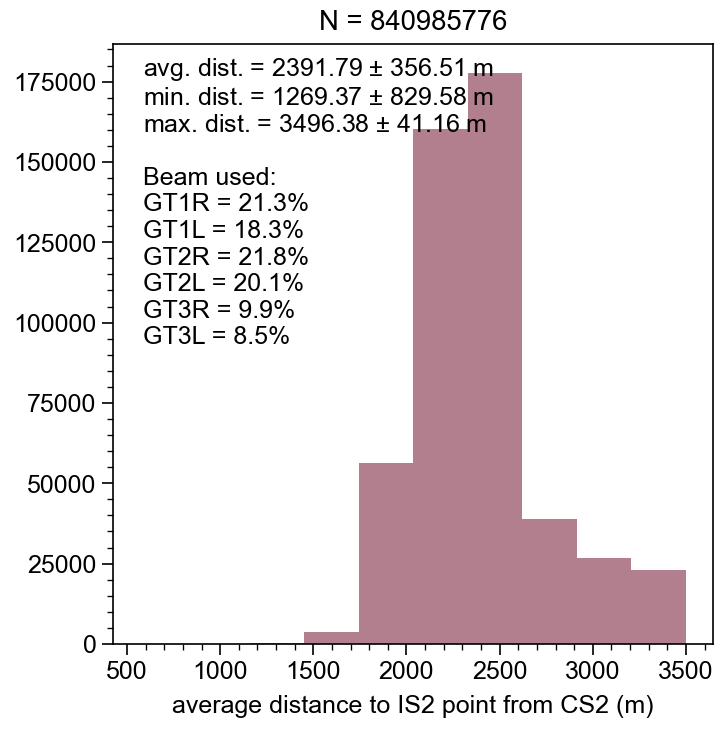

In [87]:
import proplot as pplt 
fig, ax = pplt.subplots(nrows=1, ncols=1, sharey=False, refwidth=3)

sum_GT1R = sum(CRYO2ICE_comb_all['GT1R_count'])
sum_GT1L = sum(CRYO2ICE_comb_all['GT1L_count'])
sum_GT2R = sum(CRYO2ICE_comb_all['GT2R_count'])
sum_GT2L = sum(CRYO2ICE_comb_all['GT2L_count'])
sum_GT3R = sum(CRYO2ICE_comb_all['GT3R_count'])
sum_GT3L = sum(CRYO2ICE_comb_all['GT3L_count'])
sum_total = sum_GT1R + sum_GT2L + sum_GT3L + sum_GT1L + sum_GT2R + sum_GT3R

text_avg = 'avg. dist. = {:.2f} $\pm$ {:.2f} m'.format(np.nanmean(CRYO2ICE_comb_all['IS2_dist_avg']), np.nanstd(CRYO2ICE_comb_all['IS2_dist_avg']))
text_min = 'min. dist. = {:.2f} $\pm$ {:.2f} m'.format(np.nanmean(CRYO2ICE_comb_all['IS2_dist_min']), np.nanstd(CRYO2ICE_comb_all['IS2_dist_min']))
text_max = 'max. dist. = {:.2f} $\pm$ {:.2f} m'.format(np.nanmean(CRYO2ICE_comb_all['IS2_dist_max']), np.nanstd(CRYO2ICE_comb_all['IS2_dist_max']))

text_GT1R = 'GT1R = {:.1%}'.format(sum_GT1R/sum_total)
text_GT1L = 'GT1L = {:.1%}'.format(sum_GT1L/sum_total)
text_GT2R = 'GT2R = {:.1%}'.format(sum_GT2R/sum_total)
text_GT2L = 'GT2L = {:.1%}'.format(sum_GT2L/sum_total)
text_GT3R = 'GT3R = {:.1%}'.format(sum_GT3R/sum_total)
text_GT3L = 'GT3L = {:.1%}'.format(sum_GT3L/sum_total)

text_all = text_avg+'\n'+text_min+'\n'+text_max+'\n\nBeam used:\n'+text_GT1R+'\n'+text_GT1L+'\n'+text_GT2R+'\n'+text_GT2L+'\n'+text_GT3R+'\n'+text_GT3L
ax[0].hist(CRYO2ICE_comb_all['IS2_dist_avg'], c=cmap_qual(0), alpha=0.5)
ax[0].format(xlabel='average distance to IS2 point from CS2 (m)', title='N = '+str(int(sum_total)))
ax[0].text(0.05, 0.5, text_all, transform=ax[0].transAxes)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

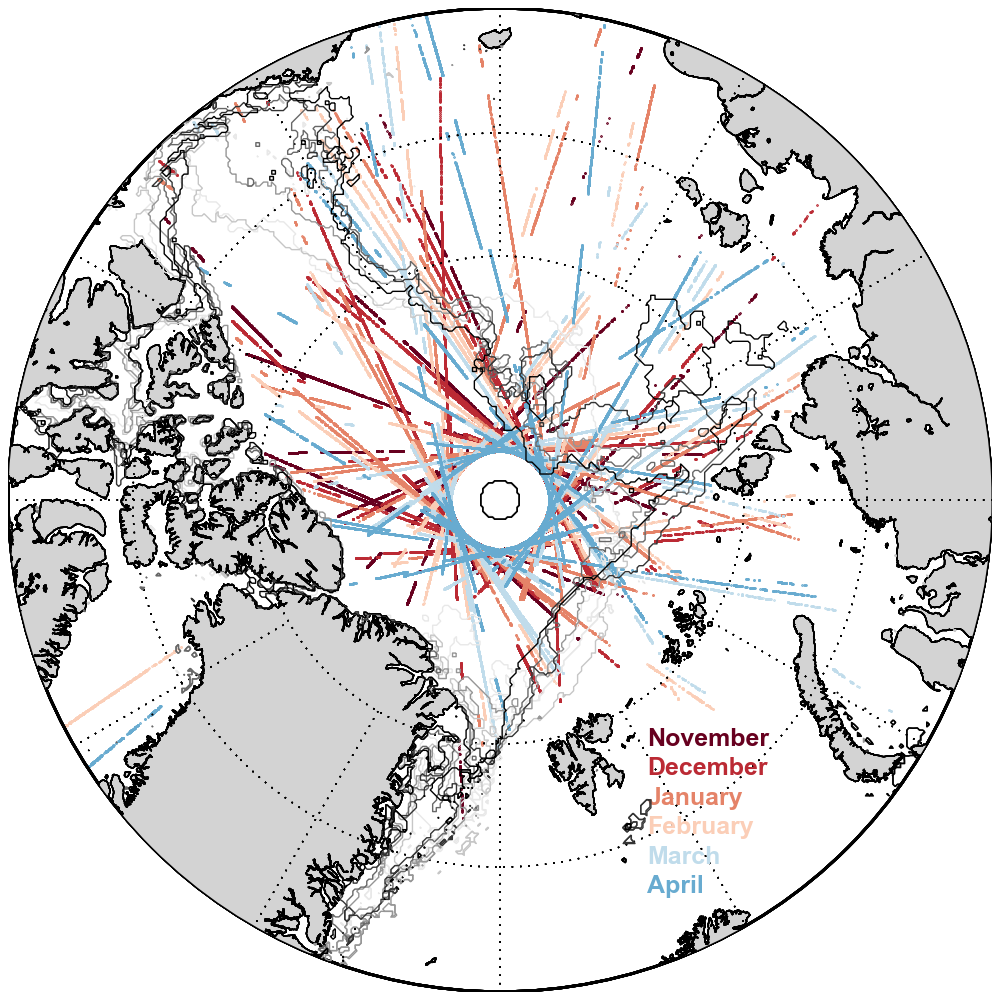

In [14]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(figsize=(5,5), constrained_layout=True)
title = ''

#cmap_qual = plt.get_cmap('colorblind10') 

im = plot_panArctic5_extra(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), cmap_qual(0), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5_extra(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), cmap_qual(1), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5_extra(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), cmap_qual(2), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5_extra(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), cmap_qual(3), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5_extra(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), cmap_qual(4), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5_extra(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), cmap_qual(5), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)

ax.text(0.65, 0.25, 'November', color=cmap_qual(0), transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.22, 'December', color=cmap_qual(1), transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.19, 'January', color=cmap_qual(2), transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.16, 'February', color=cmap_qual(3), transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.13, 'March', color=cmap_qual(4), transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.10, 'April', color=cmap_qual(5), transform= ax.transAxes,weight="bold")

#plt.savefig('E:\demo_CRYO2ICE_coverage_months_combined.png', transparent=True)

### contour lines

cmap_qual2 =  plt.cm.get_cmap('greys', 7)  
#cmap_qual2 = [rgb2hex(cmap(1/7)), rgb2hex(cmap(2/7)), rgb2hex(cmap(3/7)), rgb2hex(cmap(4/7)), 
#              rgb2hex(cmap(5/7)), rgb2hex(cmap(6/7)), rgb2hex(cmap(7/7))]

x1 = -180
x2 = 180
y1 = 0
y2 = 90
cmap1 = plt.get_cmap('greys', 4)
m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
m.drawcoastlines(linewidth=0.5)
m.fillcontinents(color='lightgray')
#m.fillcontinents(color='darkgray')
#m.drawmapboundary(fill_color='dimgray')
#cbar = m.etopo()
fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20201115.he5'
file = h5py.File(fname, 'r')
file.keys()
lon = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lon'])
lat = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/lat'])
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(1)), linewidths=0.5, zorder=4)

fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20201215.he5'
file = h5py.File(fname, 'r')
file.keys()
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(2)), linewidths=0.5, zorder=4)

fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20210116.he5'
file = h5py.File(fname, 'r')
file.keys()
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(3)), linewidths=0.5, zorder=4)

fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20210215.he5'
file = h5py.File(fname, 'r')
file.keys()
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(4)), linewidths=0.5, zorder=4)

fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20210315.he5'
file = h5py.File(fname, 'r')
file.keys()
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(5)), linewidths=0.5, zorder=4)

fname = 'E:/DTU/CRYO2ICE/AMSR2/AMSR_U2_L3_SeaIce12km_B04_20210415.he5'
file = h5py.File(fname, 'r')
file.keys()
snow_depth = np.array(file['HDFEOS/GRIDS/NpPolarGrid12km/Data Fields/SI_12km_NH_SNOWDEPTH_5DAY'])
m.contour(lon, lat, snow_depth,[130,140],latlon=True, colors=rgb2hex(cmap_qual2(6)), linewidths=0.5, zorder=4)

# ASSIST - make data comparable

In [77]:
path_ASSIST = r'E:\DTU\CRYO2ICE\ASSIST'
filename_ASSIST = 'observations-108.csv'
df_ASSIST_v1 = pd.read_csv(path_ASSIST+ '/'+filename_ASSIST)
df_ASSIST_v1['snow_depth (m)']=np.nanmean([df_ASSIST_v1['PSH'],df_ASSIST_v1['SSH'],df_ASSIST_v1['TSH']], axis=0)/100

filename_ASSIST = 'observations-109.csv'
df_ASSIST_v2 = pd.read_csv(path_ASSIST+ '/'+filename_ASSIST)
df_ASSIST_v2['snow_depth (m)']=np.nanmean([df_ASSIST_v2['PSH'],df_ASSIST_v2['SSH'],df_ASSIST_v2['TSH']], axis=0)/100

filename_ASSIST = 'observations-110.csv'
df_ASSIST_v3 = pd.read_csv(path_ASSIST+ '/'+filename_ASSIST)
df_ASSIST_v3['snow_depth (m)']=np.nanmean([df_ASSIST_v3['PSH'],df_ASSIST_v3['SSH'],df_ASSIST_v3['TSH']], axis=0)/100

frames = [df_ASSIST_v1, df_ASSIST_v2, df_ASSIST_v3]

df_ASSIST = pd.concat(frames)
df_ASSIST = df_ASSIST.sort_values(by='Date')
df_ASSIST = df_ASSIST[['Date', 'LAT', 'LON', 'PSH', 'SSH', 'TSH']]
df_ASSIST['snow_depth (m)']=np.nanmean([df_ASSIST['PSH'],df_ASSIST['SSH'],df_ASSIST['TSH']], axis=0)/100
df_ASSIST_notna = df_ASSIST[df_ASSIST['snow_depth (m)'].notna()]

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/435748225.py:4: RuntimeWarning: Mean of empty slice
  df_ASSIST_v1['snow_depth (m)']=np.nanmean([df_ASSIST_v1['PSH'],df_ASSIST_v1['SSH'],df_ASSIST_v1['TSH']], axis=0)/100
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/435748225.py:8: RuntimeWarning: Mean of empty slice
  df_ASSIST_v2['snow_depth (m)']=np.nanmean([df_ASSIST_v2['PSH'],df_ASSIST_v2['SSH'],df_ASSIST_v2['TSH']], axis=0)/100
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/435748225.py:12: RuntimeWarning: Mean of empty slice
  df_ASSIST_v3['snow_depth (m)']=np.nanmean([df_ASSIST_v3['PSH'],df_ASSIST_v3['SSH'],df_ASSIST_v3['TSH']], axis=0)/100
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/435748225.py:19: RuntimeWarning: Mean of empty slice
  df_ASSIST['snow_depth (m)']=np.nanmean([df_ASSIST['PSH'],df_ASSIST['SSH'],df_ASSIST['TSH']], axis=0)/100


In [78]:
def plot_panArctic8(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    #m.drawmapboundary(fill_color='dimgray')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=10,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1,edgecolors ='k',linewidth=0.3)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4196670729.py:20: ProplotWarning: Ignoring unused keyword arg(s): {'cmap': 'viridis', 'vmin': 0, 'vmax': 0.4}
  x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4196670729.py:20: ProplotWarning: Ignoring unused keyword arg(s): {'cmap': 'viridis', 'vmin': 0, 'vmax': 0.4}
  x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4196670729.py:20: ProplotWarning: Ignoring unused keyword arg(s): {'cmap': 'viridis', 'vmin': 0, 'vmax': 0.4}
  x=m.scatter(lon, lat, latlon=True, c=sit, s=0.05,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4196670729.py:20: ProplotWarning: Ignoring unused keyword arg(s): {'cmap': 'viridis', 'vmin': 0, 'vmax': 0.4}
  x=m.scatter(lon, lat, latlon=True, c=sit

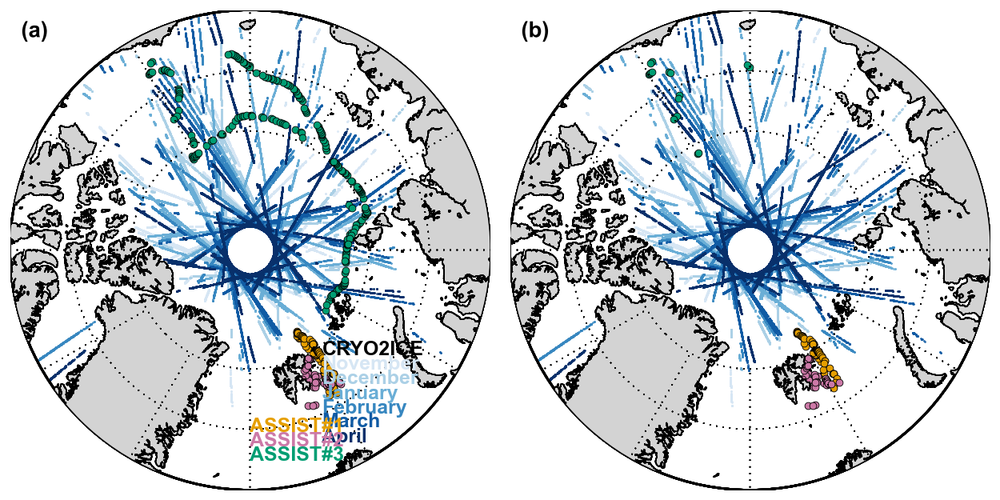

In [90]:
import proplot as pplt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import linregress
pplt.rc.update(grid=False)
fig, ax = pplt.subplots([[1, 2]],refwidth=3, refheight=3,share=False)

from matplotlib.lines import Line2D


cmap = plt.cm.get_cmap('Blues')
cmap_qual2 = [cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]

cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))
colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(3)[0:3],cmap_qual(4)[0:3],cmap_qual(5)[0:3]]

cmap_qual_green = LinearSegmentedColormap.from_list('list', ['green', 'gray'], N = 2)

###
title=''
#cmap_qual = plt.get_cmap('colorblind10') 
im = plot_panArctic5(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), cmap_qual2[0], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic5(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), cmap_qual2[1], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic5(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), cmap_qual2[2], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic5(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), cmap_qual2[3], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic5(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), cmap_qual2[4], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic5(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), cmap_qual2[5], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)

im = plot_panArctic8(np.array(df_ASSIST_v1['LON']), np.array(df_ASSIST_v1['LAT']), cmap_qual(0), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic8(np.array(df_ASSIST_v2['LON']), np.array(df_ASSIST_v2['LAT']), cmap_qual(6), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)
im = plot_panArctic8(np.array(df_ASSIST_v3['LON']), np.array(df_ASSIST_v3['LAT']), cmap_qual(2), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[0],fig)



ax[0].text(0.65, 0.28, r'CRYO2ICE', color='k', transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.25, 'November', color=cmap_qual2[0], transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.22, 'December', color=cmap_qual2[1], transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.19, 'January', color=cmap_qual2[2], transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.16, 'February', color=cmap_qual2[3], transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.13, 'March', color=cmap_qual2[4], transform= ax[0].transAxes,weight="bold")
ax[0].text(0.65, 0.10, 'April', color=cmap_qual2[5], transform= ax[0].transAxes,weight="bold")

ax[0].text(0.50, 0.12, 'ASSIST#1', color=cmap_qual(0), transform= ax[0].transAxes,weight="bold")
ax[0].text(0.50, 0.09, 'ASSIST#2', color=cmap_qual(6), transform= ax[0].transAxes,weight="bold")
ax[0].text(0.50, 0.06, 'ASSIST#3', color=cmap_qual(2), transform= ax[0].transAxes,weight="bold")



im = plot_panArctic5(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), cmap_qual2[0], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic5(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), cmap_qual2[1], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic5(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), cmap_qual2[2], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic5(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), cmap_qual2[3], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic5(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), cmap_qual2[4], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic5(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), cmap_qual2[5], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)

im = plot_panArctic8(np.array(df_ASSIST_v1[df_ASSIST_v1['snow_depth (m)'].notna()]['LON']), np.array(df_ASSIST_v1[df_ASSIST_v1['snow_depth (m)'].notna()]['LAT']), cmap_qual(0), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic8(np.array(df_ASSIST_v2[df_ASSIST_v2['snow_depth (m)'].notna()]['LON']), np.array(df_ASSIST_v2[df_ASSIST_v2['snow_depth (m)'].notna()]['LAT']), cmap_qual(6), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)
im = plot_panArctic8(np.array(df_ASSIST_v3[df_ASSIST_v3['snow_depth (m)'].notna()]['LON']), np.array(df_ASSIST_v3[df_ASSIST_v3['snow_depth (m)'].notna()]['LAT']), cmap_qual(2), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax[1],fig)




ax.format(
    abc='(a)', abcloc='ul')
plt.savefig('E:\demo_CRYO2ICE_coverage_months_combined_ASSIST_coverage.png', transparent=True)

# AWI - compute daily comparable data

In [ ]:
path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S108'
filename_AWI = '2020S108_300234066081170_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0,0,0,0 # metres
#'''
'''
folder_AWI = '2020S107'
filename_AWI = '2020S107_300234066081140_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = np.nan, np.nan, np.nan, np.nan # metres
'''
'''
folder_AWI = '2020S106'
filename_AWI = '2020S106_300234066083120_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0,0,0,0 # metres
'''
'''
folder_AWI = '2020S105'
filename_AWI = '2020S105_300234066080130_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0.03,np.nan,0.02,0.04 # metres
'''
'''
folder_AWI = '2020S98'
filename_AWI = '2020S98_300234066087160_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0, 0, 0, 0 # metres
'''
df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])
if init_sd_1 == np.nan:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_1 (m)']=np.nan
else:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_1 (m)']= init_sd_1+df_AWI_buoy['distance_to_initial_snow_ice_interface_1 (m)']

if init_sd_2 == np.nan:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_2 (m)']= np.nan
else:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_2 (m)']=init_sd_2+df_AWI_buoy['distance_to_initial_snow_ice_interface_2 (m)']

if init_sd_3 == np.nan:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_3 (m)']= np.nan
else:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_3 (m)']=init_sd_3+df_AWI_buoy['distance_to_initial_snow_ice_interface_3 (m)']

if init_sd_3 == np.nan:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_4 (m)']=np.nan
else:
    df_AWI_buoy['distance_to_initial_snow_ice_interface_4 (m)']=init_sd_4+df_AWI_buoy['distance_to_initial_snow_ice_interface_4 (m)']

df_daily = df_AWI_buoy.groupby(by=pd.Grouper(freq='D', key='datetime')).agg(np.nanmean)
snow_depth = np.array([df_daily['distance_to_initial_snow_ice_interface_1 (m)'],df_daily['distance_to_initial_snow_ice_interface_2 (m)'],df_daily['distance_to_initial_snow_ice_interface_3 (m)'],df_daily['distance_to_initial_snow_ice_interface_4 (m)']])
df_daily['daily_snow_depth (m)'] = np.nanmean(snow_depth, axis=0)
df_daily['daily_snow_depth (m)']=df_daily['daily_snow_depth (m)'].rolling(5).mean()
df_daily[df_daily['daily_snow_depth (m)']<0] = np.nan

df_daily.to_csv(path_AWI+'/' + folder_AWI +'_daily.csv')


# SIMBA buoy : compute daily comparable data

In [161]:
# Define filepath
path_SIMBA = r'E:\DTU\CRYO2ICE\SIMBA_buoy'

filename_SIMBA = 'Snow_depth_MOSAiC_2020-2021.xlsx'

df_PRIC0906_original = pd.read_excel(path_SIMBA+'/'+filename_SIMBA, sheet_name='PRIC0906')
df_FMI0607_original = pd.read_excel(path_SIMBA+'/'+filename_SIMBA, sheet_name='FMI0607')

# Preview
df_PRIC0906 = df_PRIC0906_original[['GPSDateTime', 'GPSLat', 'GPSLng']]
df_PRIC0906["datetime"] = pd.to_datetime(df_PRIC0906["GPSDateTime"])
df_daily_PRIC0906_GPS = df_PRIC0906.groupby(by=pd.Grouper(freq='D', key='datetime')).agg(np.nanmean)
df_daily_PRIC0906_GPS['datetime']=df_daily_PRIC0906_GPS.index
df_daily_PRIC0906_GPS.index.names = ['index']

df_PRIC0906 = df_PRIC0906_original[['snow depth/cm', 'ProcessingDateTime']]
df_PRIC0906["datetime"] = pd.to_datetime(df_PRIC0906["ProcessingDateTime"],format="%Y/%m/%d").dt.normalize()
df_daily_PRIC0906 = df_PRIC0906.groupby(by=pd.Grouper(freq='D', key='datetime')).agg(np.nanmean)
df_daily_PRIC0906['datetime']=df_daily_PRIC0906.index
df_daily_PRIC0906.index.names = ['index']
df_daily_PRIC0906=pd.merge(df_daily_PRIC0906,df_daily_PRIC0906_GPS,on=["datetime"], how="left")

df_daily_PRIC0906.to_csv(path_SIMBA+'/' + 'PRIC0906' +'_daily.csv')

df_FMI0607 = df_FMI0607_original[['GPSDateTime', 'GPSLat', 'GPSLng']]
df_FMI0607["datetime"] = pd.to_datetime(df_FMI0607["GPSDateTime"])
df_daily_FMI0607 = df_FMI0607.groupby(by=pd.Grouper(freq='D', key='datetime')).agg(np.nanmean)
#df_daily_FMI0607[df_daily_FMI0607['snow depth/cm']<0] = np.nan

df_FMI0607  = df_FMI0607_original[['snow depth/cm', 'SendTime']]
df_FMI0607["datetime"] = pd.to_datetime(df_FMI0607["SendTime"],format="%Y/%m/%d").dt.normalize()
df_FMI0607 = df_FMI0607.dropna()
df_daily_FMI0607['datetime']=df_daily_FMI0607.index
df_daily_FMI0607.index.names = ['index']
df_daily_FMI0607=pd.merge(df_FMI0607, df_daily_FMI0607, on=["datetime"], how="left")

df_daily_FMI0607.to_csv(path_SIMBA+'/' + 'FMI0607' +'_daily.csv')

df_comb = pd.merge(df_daily_PRIC0906, df_daily_FMI0607, on=['datetime'], how='left')
df_comb['GPSLat']=(df_comb['GPSLat_x']+df_comb['GPSLat_y'])/2
df_comb['GPSLng']=(df_comb['GPSLng_x']+df_comb['GPSLng_y'])/2
df_comb['snow depth/cm']=(df_comb['snow depth/cm_x']+df_comb['snow depth/cm_y'])/2
df_comb = df_comb.dropna()
df_comb.to_csv(path_SIMBA+'/'+'COMB_daily.csv')

# AWI - make data comparable

In [91]:
path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
filename_AWI = '2020S108_daily.csv'
df_AWI_buoy_4 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_4['ID']='2020S108'

filename_AWI = '2020S107_daily.csv'
df_AWI_buoy_3 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_3['ID']='2020S107'

filename_AWI = '2020S106_daily.csv'
df_AWI_buoy_2 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_2['ID']='2020S106'

filename_AWI = '2020S105_daily.csv'
df_AWI_buoy_1 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_1['ID']='2020S105'

filename_AWI = '2020S98_daily.csv'
df_AWI_buoy_5 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_5['ID']='2020S98'

frames = [df_AWI_buoy_4, df_AWI_buoy_3, df_AWI_buoy_2, df_AWI_buoy_1,df_AWI_buoy_5]

df_AWI_buoy_comb = pd.concat(frames)

In [94]:
def plot_panArctic6(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    #m.drawmapboundary(fill_color='dimgray')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=5,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1,edgecolors ='k',linewidth=0.3)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def plot_panArctic7(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig, marker_type='*', marker_size=75):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[1,1,1,1],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=1, fontsize=10, dashes=[1,5],labels=[1,1,1,1])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    #m.drawmapboundary(fill_color='dimgray')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=marker_size,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1, marker=marker_type, edgecolors ='white')
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x

def CRYO2ICE_AWI_snow_depth_buoy_NN(df_CS2, df_IS2,ref_distance=50):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['latitude (deg)']].to_numpy()
    query_lons = df_CS2[['longitude (deg)']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    dist_in_metres = ref_distance*1000
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    #distances, indices = bt.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres

    #data['satellite_lat'] = df_IS2['lat'][indices[0][:]]
    #data['satellite_lon'] = df_IS2['lon'][indices[0][:]]
    #data['min_distance'] = distances*6371*1000
    #data['IS2_id'] = df_IS2['GTL'][indices[0][:]]

    data = []
    for j in is_within:
        #print(j)
        for i in j:
            data=np.append(data,i)

    df_IS2_new = df_IS2.iloc[data]
    
    return df_IS2_new

def CRYO2ICE_SIMBA_snow_depth_buoy_NN(df_CS2, df_IS2,ref_distance=50):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['GPSLat']].to_numpy()
    query_lons = df_CS2[['GPSLng']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    dist_in_metres = ref_distance*1000
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    #distances, indices = bt.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres

    #data['satellite_lat'] = df_IS2['lat'][indices[0][:]]
    #data['satellite_lon'] = df_IS2['lon'][indices[0][:]]
    #data['min_distance'] = distances*6371*1000
    #data['IS2_id'] = df_IS2['GTL'][indices[0][:]]

    data = []
    for j in is_within:
        #print(j)
        for i in j:
            data=np.append(data,i)

    df_IS2_new = df_IS2.iloc[data]
    
    return df_IS2_new

def CRYO2ICE_ASSIST_NN(df_CS2, df_IS2,ref_distance=50):
    from sklearn.neighbors import BallTree
    import numpy as np
    import pandas as pd

    query_lats = df_CS2[['LAT']].to_numpy()
    query_lons = df_CS2[['LON']].to_numpy()

    tree = BallTree(np.deg2rad(df_IS2[['lat', 'lon']].values), leaf_size =15, metric='haversine')

    dist_in_metres = ref_distance*1000
    earth_radius_in_metres = 6371*1000
    radius = dist_in_metres/earth_radius_in_metres

    #distances, indices = bt.query(np.deg2rad(np.c_[query_lats, query_lons]), k=1)
    is_within, distances = tree.query_radius(np.deg2rad(np.c_[query_lats, query_lons]), r=radius, count_only=False, return_distance=True) 
    distances_in_metres = distances*earth_radius_in_metres

    #data['satellite_lat'] = df_IS2['lat'][indices[0][:]]
    #data['satellite_lon'] = df_IS2['lon'][indices[0][:]]
    #data['min_distance'] = distances*6371*1000
    #data['IS2_id'] = df_IS2['GTL'][indices[0][:]]

    data = []
    for j in is_within:
        #print(j)
        for i in j:
            data=np.append(data,i)

    df_IS2_new = df_IS2.iloc[data]
    
    return df_IS2_new



In [92]:
from datetime import datetime

# prep CRYO2ICE data in datetime formart
print('Prep CRYO2ICE in datetime format...')
t_total_CRYO2ICE = []
for i in CRYO2ICE_comb_all['time']:
    t = datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
    t_total_CRYO2ICE = np.append(t_total_CRYO2ICE, t)
print('CRYO2ICE formatted to datetime...')

Prep CRYO2ICE in datetime format...
CRYO2ICE formatted to datetime...


In [98]:
from datetime import datetime
# INPUT PARAMTERS
ref_distance = 50 # kilometers
temporal_latency = 2 # days
version='final'
selected_buoy = df_AWI_buoy_5
type_comp = 'W99_smooth_'
# AUTOMATIC
ID_buoy_save = selected_buoy['ID'][0]

# prep AWI buoy in datetime format
print('Prep AWI in datetime format... for buoy ID: '+str(ID_buoy_save))
t_total_AWI = []
for i in selected_buoy['datetime']:
    t = datetime.strptime(i,"%Y-%m-%d")
    t_total_AWI = np.append(t_total_AWI, t)
print('AWI formatted to datetime...')

selected_buoy['snow_depth_CRYO2ICE']=np.nan
selected_buoy['snow_depth_CRYO2ICE_LARM']=np.nan
selected_buoy['snow_depth_CRYO2ICE_CCI']=np.nan
selected_buoy['SMLG_snow_depth']=np.nan
selected_buoy['SMLG_snow_depth_v2']=np.nan
selected_buoy['AMSR2_snow_depth_v2']=np.nan
selected_buoy['W99_snow_depth']=np.nan
              
for i in np.arange(0,len(selected_buoy)):
    print('Processing following: '+str(i) +'/'+str((len(selected_buoy)-1))+' observations...')
    # for one buoy point, compute temporal latency
    delta_t = (t_total_AWI[i]-t_total_CRYO2ICE[:])

    # identify CRYO2ICE points within +/- 2 day days
    idx_bool, vec_idx = 0, []
    for j in delta_t:
        bool_test = np.abs(j).days<temporal_latency
        if bool_test is True:
            vec_idx=np.append(vec_idx, int(idx_bool))
        idx_bool = idx_bool+1 #update idx 
    
    # retrieve the identified CRYo2ICE data 
    if len(vec_idx)<=5:
        selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
        selected_buoy['SMLG_snow_depth'][i]=np.nan
        selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
        selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
        selected_buoy['W99_snow_depth'][i]=np.nan
    else:
        df_CRYO2ICE_new = CRYO2ICE_comb_all.iloc[vec_idx]
        df_CRYO2ICE_AWI_new = CRYO2ICE_AWI_snow_depth_buoy_NN(selected_buoy.iloc[[i]], df_CRYO2ICE_new, ref_distance)
        if len(df_CRYO2ICE_AWI_new)<=5:
            selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
            selected_buoy['SMLG_snow_depth'][i]=np.nan
            selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
            selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
            selected_buoy['W99_snow_depth'][i]=np.nan
        else:
            df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)
            selected_buoy['snow_depth_CRYO2ICE'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_smoothed']
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_LARM_smoothed']
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_CCI_smoothed']
            selected_buoy['SMLG_snow_depth'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth']
            selected_buoy['SMLG_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth_v2']
            selected_buoy['AMSR2_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['AMSR2_snow_depth_unit_m']
            selected_buoy['W99_snow_depth'][i]=df_CRYO2ICE_AWI_new_comp['W99']
        

selected_buoy.to_csv(path_AWI+'/' +ID_buoy_save+'_daily_CRYO2ICE_coincident_'+type_comp+version+'.csv')

Prep AWI in datetime format... for buoy ID: 2020S98
AWI formatted to datetime...
Processing following: 0/287 observations...
Processing following: 1/287 observations...
Processing following: 2/287 observations...
Processing following: 3/287 observations...
Processing following: 4/287 observations...
Processing following: 5/287 observations...
Processing following: 6/287 observations...
Processing following: 7/287 observations...
Processing following: 8/287 observations...
Processing following: 9/287 observations...
Processing following: 10/287 observations...
Processing following: 11/287 observations...
Processing following: 12/287 observations...
Processing following: 13/287 observations...
Processing following: 14/287 observations...
Processing following: 15/287 observations...
Processing following: 16/287 observations...
Processing following: 17/287 observations...
Processing following: 18/287 observations...
Processing following: 19/287 observations...
Processing following: 20/287 

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 64/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 65/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 66/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 67/287 observations...
Processing following: 68/287 observations...
Processing following: 69/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 70/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 71/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 72/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 73/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 74/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 75/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 76/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 77/287 observations...
Processing following: 78/287 observations...
Processing following: 79/287 observations...
Processing following: 80/287 observations...
Processing following: 81/287 observations...
Processing following: 82/287 observations...
Processing following: 83/287 observations...
Processing following: 84/287 observations...
Processing following: 85/287 observations...
Processing following: 86/287 observations...
Processing following: 87/287 observations...
Processing following: 88/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 89/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 90/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 91/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 92/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 93/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 94/287 observations...
Processing following: 95/287 observations...
Processing following: 96/287 observations...
Processing following: 97/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 98/287 observations...
Processing following: 99/287 observations...
Processing following: 100/287 observations...
Processing following: 101/287 observations...
Processing following: 102/287 observations...
Processing following: 103/287 observations...
Processing following: 104/287 observations...
Processing following: 105/287 observations...
Processing following: 106/287 observations...
Processing following: 107/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 108/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 109/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 110/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 111/287 observations...
Processing following: 112/287 observations...
Processing following: 113/287 observations...
Processing following: 114/287 observations...
Processing following: 115/287 observations...
Processing following: 116/287 observations...
Processing following: 117/287 observations...
Processing following: 118/287 observations...
Processing following: 119/287 observations...
Processing following: 120/287 observations...
Processing following: 121/287 observations...
Processing following: 122/287 observations...
Processing following: 123/287 observations...
Processing following: 124/287 observations...
Processing following: 125/287 observations...
Processing following: 126/287 observations...
Processing following: 127/287 observations...
Processing following: 128/287 observations...
Processing following: 129/287 observations...
Processing following: 130/287 observations...
Processing following: 131/287 observations...
Processing following: 132/287 obse

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 142/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 143/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 144/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 145/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 146/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 147/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 148/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 149/287 observations...
Processing following: 150/287 observations...
Processing following: 151/287 observations...
Processing following: 152/287 observations...
Processing following: 153/287 observations...
Processing following: 154/287 observations...
Processing following: 155/287 observations...
Processing following: 156/287 observations...
Processing following: 157/287 observations...
Processing following: 158/287 observations...
Processing following: 159/287 observations...
Processing following: 160/287 observations...
Processing following: 161/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 162/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 163/287 observations...
Processing following: 164/287 observations...
Processing following: 165/287 observations...
Processing following: 166/287 observations...
Processing following: 167/287 observations...
Processing following: 168/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 169/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 170/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 171/287 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/486281074.py:61: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 172/287 observations...
Processing following: 173/287 observations...
Processing following: 174/287 observations...
Processing following: 175/287 observations...
Processing following: 176/287 observations...
Processing following: 177/287 observations...
Processing following: 178/287 observations...
Processing following: 179/287 observations...
Processing following: 180/287 observations...
Processing following: 181/287 observations...
Processing following: 182/287 observations...
Processing following: 183/287 observations...
Processing following: 184/287 observations...
Processing following: 185/287 observations...
Processing following: 186/287 observations...
Processing following: 187/287 observations...
Processing following: 188/287 observations...
Processing following: 189/287 observations...
Processing following: 190/287 observations...
Processing following: 191/287 observations...
Processing following: 192/287 observations...
Processing following: 193/287 obse

# ASSIST - data comparable

In [ ]:
# INPUT PARAMTERS
ref_distance = 100 # kilometers
temporal_latency = 15 # days
version='v6'
selected_buoy = df_ASSIST_notna
# AUTOMATIC

# prep AWI buoy in datetime format
print('Prep in datetime format... for ASSIST. ')
t_total_ASSIST = []
for i in selected_buoy['Date']:
    t = datetime.strptime(i,"      %Y-%m-%d %H:%M:%S %Z")
    t_total_ASSIST = np.append(t_total_ASSIST, t)
print('ASSIST formatted to datetime...')

selected_buoy['snow_depth_CRYO2ICE']=np.nan
selected_buoy['snow_depth_CRYO2ICE_LARM']=np.nan
selected_buoy['snow_depth_CRYO2ICE_CCI']=np.nan
selected_buoy['SMLG_snow_depth']=np.nan
selected_buoy['SMLG_snow_depth_v2']=np.nan
selected_buoy['AMSR2_snow_depth_v2']=np.nan
              
for i in np.arange(0,len(selected_buoy)):
    print('Processing following: '+str(i) +'/'+str((len(selected_buoy)-1))+' observations...')
    # for one buoy point, compute temporal latency
    delta_t = (t_total_ASSIST[i]-t_total_CRYO2ICE[:])

    # identify CRYO2ICE points within +/- 2 day days
    idx_bool, vec_idx = 0, []
    for j in delta_t:
        bool_test = np.abs(j).days<temporal_latency
        if bool_test is True:
            vec_idx=np.append(vec_idx, int(idx_bool))
        idx_bool = idx_bool+1 #update idx 
    
    # retrieve the identified CRYo2ICE data 
    if len(vec_idx)<=5:
        selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
        selected_buoy['SMLG_snow_depth'][i]=np.nan
        selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
        selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
    else:
        df_CRYO2ICE_new = CRYO2ICE_comb_all.iloc[vec_idx]
        df_CRYO2ICE_AWI_new = CRYO2ICE_ASSIST_NN(selected_buoy.iloc[[i]], df_CRYO2ICE_new, ref_distance)
        if len(df_CRYO2ICE_AWI_new)<=5:
            selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
            selected_buoy['SMLG_snow_depth'][i]=np.nan
            selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
            selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
        else:
            df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)
            selected_buoy['snow_depth_CRYO2ICE'][i]=df_CRYO2ICE_AWI_new_comp['lowess_snow_depth_original_MSS']
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=df_CRYO2ICE_AWI_new_comp['lowess_snow_depth_original_MSS_LARM']
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=df_CRYO2ICE_AWI_new_comp['lowess_snow_depth_original_MSS_CCI']
            selected_buoy['SMLG_snow_depth'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth']
            selected_buoy['SMLG_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth_v2']
            selected_buoy['AMSR2_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['AMSR2_snow_depth_unit_m']
        

selected_buoy.to_csv(path_ASSIST+'/ASSIST_daily_CRYO2ICE_coincident_'+version+'.csv')

# SIMBA data comparable

In [99]:
path_SIMBA = r'E:\DTU\CRYO2ICE\SIMBA_buoy'
filename_SIMBA = 'FMI0607_daily.csv'
df_FMI0607 = pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_FMI0607['ID']='FMI0607'

filename_SIMBA = 'PRIC0906_daily.csv'
df_PRIC0906 = pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_PRIC0906['ID']='PRIC0906'

filename_SIMBA = 'COMB_daily.csv'
df_COMB = pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_COMB['ID']='COMBINED_daily.csv'


frames = [df_FMI0607, df_PRIC0906,df_COMB]

df_SIMBA_buoy_comb = pd.concat(frames)

In [104]:
from datetime import datetime
# INPUT PARAMTERS
ref_distance = 50 # kilometers
temporal_latency = 2 # days
version='final'
#selected_buoy = df_FMI0607
#selected_buoy = df_PRIC0906
selected_buoy = df_COMB
type_comp = 'W99_smooth_'
# AUTOMATIC
ID_buoy_save = selected_buoy['ID'][0]

# prep AWI buoy in datetime format
print('Prep AWI in datetime format... for buoy ID: '+str(ID_buoy_save))
t_total_AWI = []
for i in selected_buoy['datetime']:
    t = datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
    #t = datetime.strptime(i,"%Y-%m-%d") # use when df_PRIC0906 only 
    t_total_AWI = np.append(t_total_AWI, t) 
print('AWI formatted to datetime...')

selected_buoy['snow_depth_CRYO2ICE']=np.nan
selected_buoy['snow_depth_CRYO2ICE_LARM']=np.nan
selected_buoy['snow_depth_CRYO2ICE_CCI']=np.nan
selected_buoy['SMLG_snow_depth']=np.nan
selected_buoy['SMLG_snow_depth_v2']=np.nan
selected_buoy['AMSR2_snow_depth_v2']=np.nan
selected_buoy['W99_snow_depth']=np.nan
              
for i in np.arange(0,len(selected_buoy)):
    print('Processing following: '+str(i) +'/'+str((len(selected_buoy)-1))+' observations...')
    # for one buoy point, compute temporal latency
    delta_t = (t_total_AWI[i]-t_total_CRYO2ICE[:])

    # identify CRYO2ICE points within +/- 2 day days
    idx_bool, vec_idx = 0, []
    for j in delta_t:
        bool_test = np.abs(j).days<temporal_latency
        if bool_test is True:
            vec_idx=np.append(vec_idx, int(idx_bool))
        idx_bool = idx_bool+1 #update idx 
    
    # retrieve the identified CRYo2ICE data 
    if len(vec_idx)<=5:
        selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
        selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
        selected_buoy['SMLG_snow_depth'][i]=np.nan
        selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
        selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
        selected_buoy['W99_snow_depth'][i]= np.nan
    else:
        df_CRYO2ICE_new = CRYO2ICE_comb_all.iloc[vec_idx]
        df_CRYO2ICE_AWI_new = CRYO2ICE_SIMBA_snow_depth_buoy_NN(selected_buoy.iloc[[i]], df_CRYO2ICE_new, ref_distance)
        if len(df_CRYO2ICE_AWI_new)<=5:
            selected_buoy['snow_depth_CRYO2ICE'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=np.nan
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=np.nan
            selected_buoy['SMLG_snow_depth'][i]=np.nan
            selected_buoy['SMLG_snow_depth_v2'][i]=np.nan
            selected_buoy['AMSR2_snow_depth_v2'][i]=np.nan
            selected_buoy['W99_snow_depth'][i]=  np.nan
        else:
            df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)
            selected_buoy['snow_depth_CRYO2ICE'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_smoothed']
            selected_buoy['snow_depth_CRYO2ICE_LARM'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_LARM_smoothed']
            selected_buoy['snow_depth_CRYO2ICE_CCI'][i]=df_CRYO2ICE_AWI_new_comp['snow_depth_original_MSS_CCI_smoothed']
            selected_buoy['SMLG_snow_depth'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth']
            selected_buoy['SMLG_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['SMLG_snow_depth_v2']
            selected_buoy['AMSR2_snow_depth_v2'][i]=df_CRYO2ICE_AWI_new_comp['AMSR2_snow_depth_unit_m']
            selected_buoy['W99_snow_depth'][i]=df_CRYO2ICE_AWI_new_comp['W99']
        

selected_buoy.to_csv(path_SIMBA+'/' +ID_buoy_save+'_daily_CRYO2ICE_coincident_'+type_comp+version+'.csv')

Prep AWI in datetime format... for buoy ID: COMBINED_daily.csv
AWI formatted to datetime...
Processing following: 0/249 observations...
Processing following: 1/249 observations...
Processing following: 2/249 observations...
Processing following: 3/249 observations...
Processing following: 4/249 observations...
Processing following: 5/249 observations...
Processing following: 6/249 observations...
Processing following: 7/249 observations...
Processing following: 8/249 observations...
Processing following: 9/249 observations...
Processing following: 10/249 observations...
Processing following: 11/249 observations...
Processing following: 12/249 observations...
Processing following: 13/249 observations...
Processing following: 14/249 observations...
Processing following: 15/249 observations...
Processing following: 16/249 observations...
Processing following: 17/249 observations...
Processing following: 18/249 observations...
Processing following: 19/249 observations...
Processing followi

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 62/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 63/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 64/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 65/249 observations...
Processing following: 66/249 observations...
Processing following: 67/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 68/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 69/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 70/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 71/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 72/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 73/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 74/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 75/249 observations...
Processing following: 76/249 observations...
Processing following: 77/249 observations...
Processing following: 78/249 observations...
Processing following: 79/249 observations...
Processing following: 80/249 observations...
Processing following: 81/249 observations...
Processing following: 82/249 observations...
Processing following: 83/249 observations...
Processing following: 84/249 observations...
Processing following: 85/249 observations...
Processing following: 86/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 87/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 88/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 89/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 90/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 91/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 92/249 observations...
Processing following: 93/249 observations...
Processing following: 94/249 observations...
Processing following: 95/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 96/249 observations...
Processing following: 97/249 observations...
Processing following: 98/249 observations...
Processing following: 99/249 observations...
Processing following: 100/249 observations...
Processing following: 101/249 observations...
Processing following: 102/249 observations...
Processing following: 103/249 observations...
Processing following: 104/249 observations...
Processing following: 105/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 106/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 107/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 108/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 109/249 observations...
Processing following: 110/249 observations...
Processing following: 111/249 observations...
Processing following: 112/249 observations...
Processing following: 113/249 observations...
Processing following: 114/249 observations...
Processing following: 115/249 observations...
Processing following: 116/249 observations...
Processing following: 117/249 observations...
Processing following: 118/249 observations...
Processing following: 119/249 observations...
Processing following: 120/249 observations...
Processing following: 121/249 observations...
Processing following: 122/249 observations...
Processing following: 123/249 observations...
Processing following: 124/249 observations...
Processing following: 125/249 observations...
Processing following: 126/249 observations...
Processing following: 127/249 observations...
Processing following: 128/249 observations...
Processing following: 129/249 observations...
Processing following: 130/249 obse

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 140/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 141/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 142/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 143/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 144/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 145/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 146/249 observations...
Processing following: 147/249 observations...
Processing following: 148/249 observations...
Processing following: 149/249 observations...
Processing following: 150/249 observations...
Processing following: 151/249 observations...
Processing following: 152/249 observations...
Processing following: 153/249 observations...
Processing following: 154/249 observations...
Processing following: 155/249 observations...
Processing following: 156/249 observations...
Processing following: 157/249 observations...
Processing following: 158/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 159/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 160/249 observations...
Processing following: 161/249 observations...
Processing following: 162/249 observations...
Processing following: 163/249 observations...
Processing following: 164/249 observations...
Processing following: 165/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 166/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 167/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 168/249 observations...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1666613334.py:64: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_CRYO2ICE_AWI_new_comp = df_CRYO2ICE_AWI_new.median(skipna=True)


Processing following: 169/249 observations...
Processing following: 170/249 observations...
Processing following: 171/249 observations...
Processing following: 172/249 observations...
Processing following: 173/249 observations...
Processing following: 174/249 observations...
Processing following: 175/249 observations...
Processing following: 176/249 observations...
Processing following: 177/249 observations...
Processing following: 178/249 observations...
Processing following: 179/249 observations...
Processing following: 180/249 observations...
Processing following: 181/249 observations...
Processing following: 182/249 observations...
Processing following: 183/249 observations...
Processing following: 184/249 observations...
Processing following: 185/249 observations...
Processing following: 186/249 observations...
Processing following: 187/249 observations...
Processing following: 188/249 observations...
Processing following: 189/249 observations...
Processing following: 190/249 obse

In [105]:
path_SIMBA = r'E:\DTU\CRYO2ICE\SIMBA_buoy'
filename_SIMBA = 'COMBINED_daily.csv_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_SIMBA_buoy_3 = pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_SIMBA_buoy_3['ID']='COMB'
df_SIMBA_buoy_3['sensor']='buoy'
df_SIMBA_buoy_3['snow depth/cm'] = df_SIMBA_buoy_3['snow depth/cm']/100

print('Statistics for: '+ str(df_SIMBA_buoy_3['ID'][0]))
coincident_data = df_SIMBA_buoy_3[(df_SIMBA_buoy_3['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_3['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_3['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])

from sklearn.metrics import mean_squared_error
a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE']
fit = linregress(b,a)
print('C2I - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_LARM']
fit = linregress(b,a)
print('C2I LARM - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_CCI']
fit = linregress(b,a)
print('C2I CCI - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth']
fit = linregress(b,a)
print('SMLG - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth_v2']
fit = linregress(b,a)
print('SMLG v2 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['W99_snow_depth']
fit = linregress(b,a)
print('W99 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))




Statistics for: COMB
C2I - Slope: 0.11248313769367906, intercept: 0.14948900412667418
RMSE: 0.05017068857884052
C2I LARM - Slope: 0.14080822787955555, intercept: 0.14205108730804128
RMSE: 0.056792445478331795
C2I CCI - Slope: 0.11674282424006266, intercept: 0.15257217354310215
RMSE: 0.06627736548251661
SMLG - Slope: 0.05899276671979253, intercept: 0.15188127662642759
RMSE: 0.13226742345464285
SMLG v2 - Slope: 0.1559998089419629, intercept: 0.1357716052863899
RMSE: 0.0632154081510166
W99 - Slope: 0.11270367594395646, intercept: 0.13660055344396885
RMSE: 0.12275511982986471


In [115]:
#coincident_data.corr()
#coincident_data.mean()
#coincident_data.std()
#np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE'])
#np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_LARM'])
#np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_CCI'])
#np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth'])
#np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth_v2'])
#np.mean(coincident_data['snow depth/cm']-coincident_data['W99_snow_depth'])

-0.014505777387801316

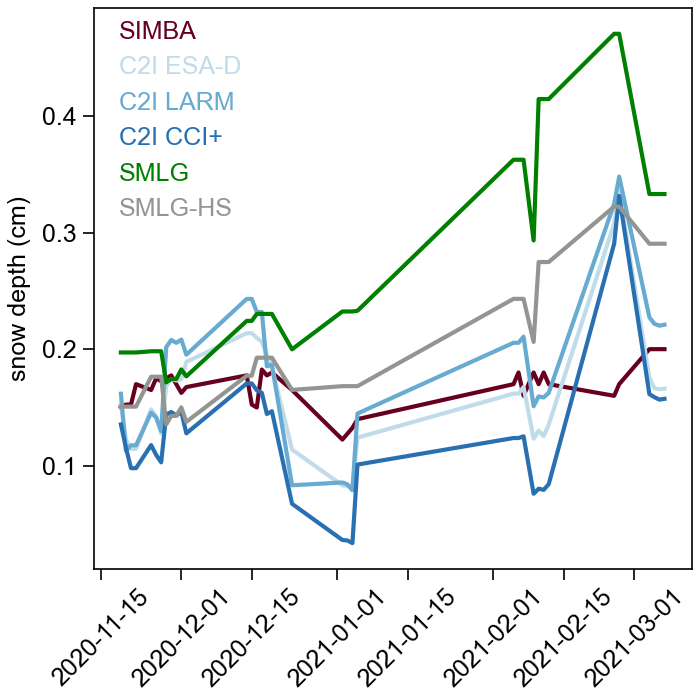

In [109]:
fig = plt.figure(1, figsize=(3.5,3.5), constrained_layout=True)
ax = fig.add_subplot(111)


t_total_AWI=[]
for i in coincident_data['datetime']:
    t = datetime.strptime(i,"%Y-%m-%d %H:%M:%S.%f")
    t_total_AWI = np.append(t_total_AWI, t)
ax.plot(t_total_AWI,coincident_data['snow depth/cm'], label='SIMBA', c=cmap_qual(0))
ax.plot(t_total_AWI,coincident_data['snow_depth_CRYO2ICE'], label='C2I ESA-D', c=cmap_qual(4))
ax.plot(t_total_AWI,coincident_data['snow_depth_CRYO2ICE_LARM'], label='C2I LARM', c=cmap_qual(5))
ax.plot(t_total_AWI,coincident_data['snow_depth_CRYO2ICE_CCI'], label='C2I CCI+', c=cmap_qual(6))
ax.plot(t_total_AWI,coincident_data['SMLG_snow_depth'], label='SMLG', c=cmap_qual_green(0))
ax.plot(t_total_AWI,coincident_data['SMLG_snow_depth_v2'], label='SMLG-HS', c=cmap_qual(8))

ax.set_ylabel('snow depth (cm)')
for label in ax.get_xticklabels():
    label.set_rotation(45)
    
ax.legend(handlelength=0, labelcolor='linecolor', frameon=False)
plt.minorticks_off()

# Plot AWI data for comparison

In [116]:
path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
filename_AWI = '2020S108_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_AWI_buoy_4 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_4['ID']='2020S108'
df_AWI_buoy_4['sensor']='buoy'

filename_AWI = '2020S106_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_AWI_buoy_2 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_2['ID']='2020S106'
df_AWI_buoy_2['sensor']='buoy'

filename_AWI = '2020S105_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_AWI_buoy_1 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_1['ID']='2020S105'
df_AWI_buoy_1['sensor']='buoy'

filename_AWI = '2020S98_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_AWI_buoy_5 = pd.read_csv(path_AWI+'/'+filename_AWI)
df_AWI_buoy_5['ID']='2020S98'
df_AWI_buoy_5['sensor']='buoy'

frames = [df_AWI_buoy_4, df_AWI_buoy_2, df_AWI_buoy_1,df_AWI_buoy_5]

df_AWI_buoy_comb = pd.concat(frames)

In [117]:
path_SIMBA = r'E:\DTU\CRYO2ICE\SIMBA_buoy'
filename_SIMBA = 'FMI0607_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_SIMBA_buoy_1 = pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_SIMBA_buoy_1['ID']='FMI0607'
df_SIMBA_buoy_1['sensor']='buoy'
df_SIMBA_buoy_1['snow depth/cm'] = df_SIMBA_buoy_1['snow depth/cm']/100

filename_SIMBA = 'PRIC0906_daily_CRYO2ICE_coincident_W99_smooth_final.csv'
df_SIMBA_buoy_2= pd.read_csv(path_SIMBA+'/'+filename_SIMBA)
df_SIMBA_buoy_2['ID']='PRIC0906'
df_SIMBA_buoy_2['sensor']='buoy'
df_SIMBA_buoy_2['snow depth/cm'] = df_SIMBA_buoy_2['snow depth/cm']/100


frames = [df_SIMBA_buoy_1, df_SIMBA_buoy_2]

df_SIMBA_buoy_comb = pd.concat(frames)

In [ ]:
from matplotlib.lines import Line2D
from matplotlib.colors import LinearSegmentedColormap,rgb2hex
fig, ax = plt.subplots(figsize=(5,5), constrained_layout=True)
title = ''

cmap = plt.cm.get_cmap('Blues')
cmap_qual2 = [cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]
'''
cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))
'''

cmap_check = plt.cm.get_cmap('BuRd_r')
cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))), rgb2hex(cmap_check((3/8))),
            rgb2hex(cmap_check((5/8))), rgb2hex(cmap_check(6/8)), rgb2hex(cmap_check(7/8)), rgb2hex(cmap_check(8/8))]
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))

colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(3)[0:3],cmap_qual(4)[0:3],cmap_qual(5)[0:3]]

cmap_qual_green = LinearSegmentedColormap.from_list('list', ['green', 'gray'], N = 2)


#cmap_qual = plt.get_cmap('colorblind10') 
im = plot_panArctic5(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), cmap_qual2[0], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), cmap_qual2[1], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), cmap_qual2[2], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), cmap_qual2[3], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), cmap_qual2[4], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), cmap_qual2[5], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)

#im = plot_panArctic6(np.array(df_ASSIST_notna['LON']), np.array(df_ASSIST_notna['LAT']), 'red', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)



ax.text(0.65, 0.28, r'CRYO2ICE', color='k', transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.25, 'November', color=cmap_qual2[0], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.22, 'December', color=cmap_qual2[1], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.19, 'January', color=cmap_qual2[2], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.16, 'February', color=cmap_qual2[3], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.13, 'March', color=cmap_qual2[4], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.10, 'April', color=cmap_qual2[5], transform= ax.transAxes,weight="bold")



plt.savefig('E:\demo_CRYO2ICE_coverage_months_combined_CRYO2ICE_tracks_alone.png', transparent=True)

In [ ]:
from matplotlib.lines import Line2D
from matplotlib.colors import LinearSegmentedColormap,rgb2hex
fig, ax = plt.subplots(figsize=(5,5), constrained_layout=True)
title = ''

cmap = plt.cm.get_cmap('Blues')
cmap_qual2 = [cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]
'''
cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))
'''

cmap_check = plt.cm.get_cmap('BuRd_r')
cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))), rgb2hex(cmap_check((3/8))),
            rgb2hex(cmap_check((5/8))), rgb2hex(cmap_check(6/8)), rgb2hex(cmap_check(7/8)), rgb2hex(cmap_check(8/8))]
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))

colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(3)[0:3],cmap_qual(4)[0:3],cmap_qual(5)[0:3]]

cmap_qual_green = LinearSegmentedColormap.from_list('list', ['green', 'gray'], N = 2)


#cmap_qual = plt.get_cmap('colorblind10') 
im = plot_panArctic5(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), cmap_qual2[0], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), cmap_qual2[1], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), cmap_qual2[2], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), cmap_qual2[3], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), cmap_qual2[4], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic5(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), cmap_qual2[5], 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)

im = plot_panArctic6(np.array(df_AWI_buoy_4['longitude (deg)']), np.array(df_AWI_buoy_4['latitude (deg)']), cmap_qual(0), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic6(np.array(df_AWI_buoy_2['longitude (deg)']), np.array(df_AWI_buoy_2['latitude (deg)']), cmap_qual(1), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic6(np.array(df_AWI_buoy_1['longitude (deg)']), np.array(df_AWI_buoy_1['latitude (deg)']), cmap_qual(2), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic6(np.array(df_AWI_buoy_5['longitude (deg)']), np.array(df_AWI_buoy_5['latitude (deg)']), cmap_qual(3), 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)


im = plot_panArctic7(np.array(df_AWI_buoy_4['longitude (deg)'][0]), np.array(df_AWI_buoy_4['latitude (deg)'][0]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig,)
im = plot_panArctic7(np.array(df_AWI_buoy_2['longitude (deg)'][0]), np.array(df_AWI_buoy_2['latitude (deg)'][0]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic7(np.array(df_AWI_buoy_1['longitude (deg)'][0]), np.array(df_AWI_buoy_1['latitude (deg)'][0]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)
im = plot_panArctic7(np.array(df_AWI_buoy_5['longitude (deg)'][0]), np.array(df_AWI_buoy_5['latitude (deg)'][0]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)

im = plot_panArctic7(np.array(df_AWI_buoy_4['longitude (deg)'][len(df_AWI_buoy_4)-1]), np.array(df_AWI_buoy_4['latitude (deg)'][len(df_AWI_buoy_4)-1]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig,marker_type='s', marker_size=25)
im = plot_panArctic7(np.array(df_AWI_buoy_2['longitude (deg)'][len(df_AWI_buoy_2)-1]), np.array(df_AWI_buoy_2['latitude (deg)'][len(df_AWI_buoy_2)-1]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig,marker_type='s', marker_size=25)
im = plot_panArctic7(np.array(df_AWI_buoy_1['longitude (deg)'][len(df_AWI_buoy_1)-1]), np.array(df_AWI_buoy_1['latitude (deg)'][len(df_AWI_buoy_1)-1]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig,marker_type='s', marker_size=25)
im = plot_panArctic7(np.array(df_AWI_buoy_5['longitude (deg)'][len(df_AWI_buoy_5)-1]), np.array(df_AWI_buoy_5['latitude (deg)'][len(df_AWI_buoy_5)-1]), 'k', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig,marker_type='s', marker_size=25)

#im = plot_panArctic6(np.array(df_ASSIST_notna['LON']), np.array(df_ASSIST_notna['LAT']), 'red', 0, 0.4, 'viridis', 'radar freeboard (m)','max', ax,fig)



ax.text(0.65, 0.28, r'CRYO2ICE', color='k', transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.25, 'November', color=cmap_qual2[0], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.22, 'December', color=cmap_qual2[1], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.19, 'January', color=cmap_qual2[2], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.16, 'February', color=cmap_qual2[3], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.13, 'March', color=cmap_qual2[4], transform= ax.transAxes,weight="bold")
ax.text(0.65, 0.10, 'April', color=cmap_qual2[5], transform= ax.transAxes,weight="bold")

ax.text(0.50, 0.15, r'Buoy', color='k', transform= ax.transAxes,weight="bold")
ax.text(0.50, 0.12, '2020S108', color=cmap_qual(0), transform= ax.transAxes,weight="bold")
ax.text(0.50, 0.09, '2020S106', color=cmap_qual(1), transform= ax.transAxes,weight="bold")
ax.text(0.50, 0.06, '2020S105', color=cmap_qual(2), transform= ax.transAxes,weight="bold")
ax.text(0.50, 0.03, '2020S98', color=cmap_qual(3), transform= ax.transAxes,weight="bold")


#plt.savefig('E:\demo_CRYO2ICE_coverage_months_combined.png', transparent=True)

C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4191939737.py:143: ProplotWarning: Passing labels without handles is unsupported in proplot. Please explicitly pass the handles to legend() or pass labels to plotting commands with e.g. plot(data_1d, label='label') or plot(data_2d, labels=['label1', 'label2', ...]). After passing labels to plotting commands you can call legend() without any arguments or with the handles as a sole positional argument.
  leg = axs[1].legend(labels=[text_corr1, text_corr2, text_corr3, text_corr4, text_corr5], loc='upper right',ncols=1,markerscale=0, frame=False,prop={'size': 10})
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/4191939737.py:233: ProplotWarning: Passing labels without handles is unsupported in proplot. Please explicitly pass the handles to legend() or pass labels to plotting commands with e.g. plot(data_1d, label='label') or plot(data_2d, labels=['label1', 'label2', ...]). After passing labels to plotting commands you can call legend() wi

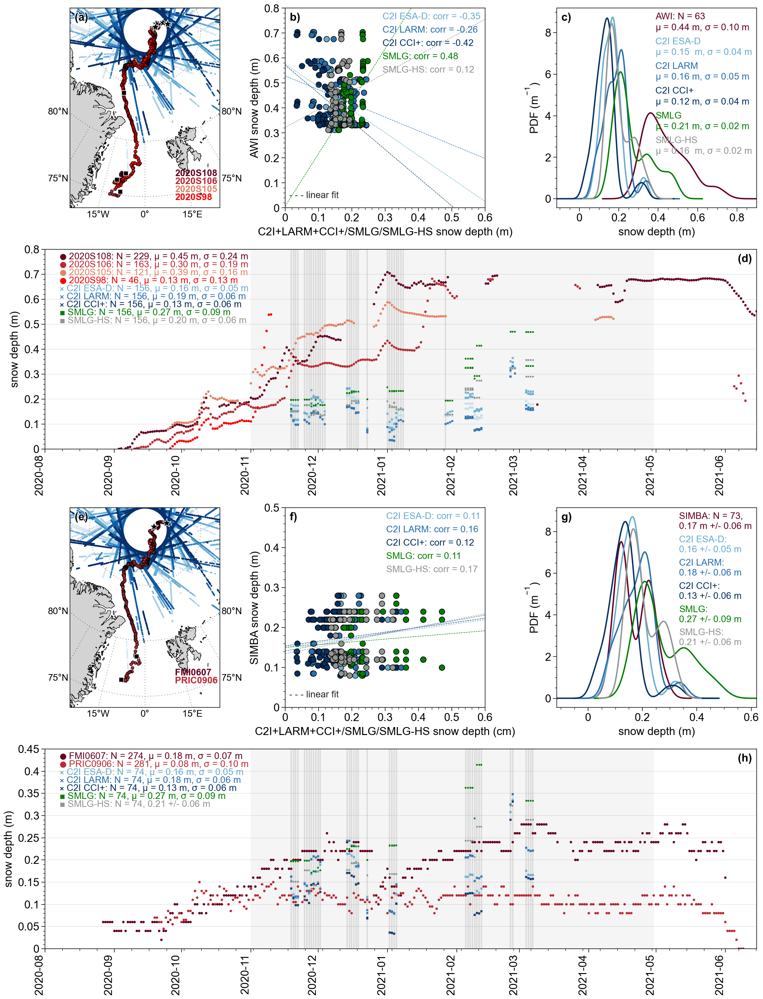

In [118]:
import proplot as pplt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap,rgb2hex
from scipy.stats import linregress
pplt.rc.update(grid=False)
fig, axs = pplt.subplots([[1,2,3],[1,2,3],[4,4,4],[4,4,4],[5,6,7],[5,6,7],[8,8,8],[8,8,8]],refwidth=3, refheight=3,share=False)

sns.set_style(style="ticks")
cmap = plt.cm.get_cmap('Blues')
cmap_qual2 = [cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]

cmap_qual_green = LinearSegmentedColormap.from_list('list', ['green', 'gray', 'red'], N = 3)

'''cmap_qual = ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', 'darkorange']
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))'''

cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))), rgb2hex(cmap_check((3/8))),
            rgb2hex(cmap_check((5/8))), rgb2hex(cmap_check(6/8)), rgb2hex(cmap_check(7/8)), rgb2hex(cmap_check(8/8)), cmap_qual_green(1)]

    
#cmap_qual = [rgb2hex(cmap_check((0/8))),rgb2hex(cmap_check((1/8))),rgb2hex(cmap_check((2/8))), rgb2hex(cmap_check((3/8))),
#             cmap(1/6), cmap(2/6), cmap(3/6), cmap(4/6), cmap(5/6), cmap(6/6)]
cmap_qual = LinearSegmentedColormap.from_list('list', cmap_qual, N = len(cmap_qual))

colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(3)[0:3],cmap_qual(4)[0:3],cmap_qual(5)[0:3]]

#### A) plot
#m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
x1 = -15
x2 = 15
y1 = 60
y2 = 90


############################## AWI BUOYS ########################################################

title=''
m = Basemap(width=1500000,height=2000000,resolution='h',projection='laea',lat_1=60.,lat_0=83,lon_0=0, ax=axs[0])
#m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='l',ax=ax)
m.drawmeridians(np.arange(0,360,15),labels=[0,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawparallels(np.arange(-90,90,5),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[1,1,0,0])
m.drawcoastlines(linewidth=0.5)
m.fillcontinents(color='lightgray')

x=m.scatter(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), latlon=True, c=cmap_qual2[0], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), latlon=True, c=cmap_qual2[1], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), latlon=True, c=cmap_qual2[2], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), latlon=True, c=cmap_qual2[3], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), latlon=True, c=cmap_qual2[4], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), latlon=True, c=cmap_qual2[5], s=0.5, marker = "o")

x=m.scatter(np.array(df_AWI_buoy_4['longitude (deg)']), np.array(df_AWI_buoy_4['latitude (deg)']), latlon=True, c=cmap_qual(0), s=10, marker = "o", label='2020S108',edgecolors='k',linewidth =.5)
x=m.scatter(np.array(df_AWI_buoy_2['longitude (deg)']), np.array(df_AWI_buoy_2['latitude (deg)']), latlon=True, c=cmap_qual(1), s=10, marker = "o", label='2020S106',edgecolors='k',linewidth =.5)
x=m.scatter(np.array(df_AWI_buoy_1['longitude (deg)']), np.array(df_AWI_buoy_1['latitude (deg)']), latlon=True, c=cmap_qual(2), s=10, marker = "o", label='2020S105',edgecolors='k',linewidth =.5)
x=m.scatter(np.array(df_AWI_buoy_5['longitude (deg)']), np.array(df_AWI_buoy_5['latitude (deg)']), latlon=True, c=cmap_qual_green(2), s=10, marker = "o", label='2020S98',edgecolors='k',linewidth =.5)

x=m.scatter(np.array(df_AWI_buoy_4['longitude (deg)'][0]), np.array(df_AWI_buoy_4['latitude (deg)'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_2['longitude (deg)'][0]), np.array(df_AWI_buoy_2['latitude (deg)'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_1['longitude (deg)'][0]), np.array(df_AWI_buoy_1['latitude (deg)'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_5['longitude (deg)'][0]), np.array(df_AWI_buoy_5['latitude (deg)'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')


x=m.scatter(np.array(df_AWI_buoy_4['longitude (deg)'][len(df_AWI_buoy_4)-1]), np.array(df_AWI_buoy_4['latitude (deg)'][len(df_AWI_buoy_4)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_2['longitude (deg)'][len(df_AWI_buoy_2)-1]), np.array(df_AWI_buoy_2['latitude (deg)'][len(df_AWI_buoy_2)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_1['longitude (deg)'][len(df_AWI_buoy_1)-1]), np.array(df_AWI_buoy_1['latitude (deg)'][len(df_AWI_buoy_1)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')
x=m.scatter(np.array(df_AWI_buoy_5['longitude (deg)'][len(df_AWI_buoy_5)-1]), np.array(df_AWI_buoy_5['latitude (deg)'][len(df_AWI_buoy_5)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')

#axs[0].text(0.60, 0.16, r'Buoy', color='k', transform= axs[0].transAxes,weight="bold")

axs[0].text(0.70, 0.16, '2020S108', color=cmap_qual(0), transform= axs[0].transAxes,weight="bold",fontsize=10)
axs[0].text(0.70, 0.12, '2020S106', color=cmap_qual(1), transform= axs[0].transAxes,weight="bold",fontsize=10)
axs[0].text(0.70, 0.08, '2020S105', color=cmap_qual(2), transform= axs[0].transAxes,weight="bold",fontsize=10)
axs[0].text(0.70, 0.04, '2020S98', color=cmap_qual_green(2), transform= axs[0].transAxes,weight="bold",fontsize=10)
axs[0].format(
    abc='(a)', abcloc='ul')

### B) plot
df_AWI_buoy_comb_notna = df_AWI_buoy_comb[df_AWI_buoy_comb['snow_depth_CRYO2ICE'].notna()]
df_AWI_buoy_comb_notna_extra = df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['daily_snow_depth (m)'].notna()]


axs[1].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'],c=cmap_qual(5),edgecolors='k')
axs[1].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'],c=cmap_qual(6),edgecolors='k')
axs[1].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'],c=cmap_qual(7),edgecolors='k')
axs[1].scatter(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'],c=cmap_qual_green(0),edgecolors='k')
axs[1].scatter(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'],c=cmap_qual(8),edgecolors='k')

axs[1].format(
    abc='a)', abcloc='ul',xlabel='C2I+LARM+CCI+/SMLG/SMLG-HS snow depth (m)', ylabel='AWI snow depth (m)', 
    xgrid=False, ygrid=False, xlim=[0,0.6], ylim=[0,0.8])

from sklearn.metrics import mean_squared_error

rms_C2I = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE'], squared=False)
rms_LARM = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_LARM'], squared=False)
rms_CCI = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'], squared=False)
rms_SMLG = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth'], squared=False)
rms_SMLG_v2 = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth_v2'], squared=False)

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[1].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(5), linewidth=0.5)

text_corr1 = 'C2I ESA-D: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'])[0,1],rms_C2I, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_LARM']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[1].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(6), linewidth=0.5)

text_corr2 = 'C2I LARM: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'])[0,1],rms_LARM, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[1].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(7), linewidth=0.5)


text_corr3 = 'C2I CCI+: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'])[0,1], rms_CCI, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[1].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual_green(0), linewidth=0.5)


text_corr4 = 'SMLG: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'])[0,1], rms_SMLG, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['daily_snow_depth (m)']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth_v2']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[1].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(8), linewidth=0.5)


text_corr5 = 'SMLG-HS: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'], df_AWI_buoy_comb_notna_extra['daily_snow_depth (m)'])[0,1], rms_SMLG_v2, fit[0], fit[1])

leg = axs[1].legend(labels=[text_corr1, text_corr2, text_corr3, text_corr4, text_corr5], loc='upper right',ncols=1,markerscale=0, frame=False,prop={'size': 10})
for h, t in zip(leg.legendHandles, leg.get_texts()):
    t.set_color(h.get_facecolor()[0])

axs[1].text(0.02, 0.05, "- - - linear fit", transform = axs[1].transAxes, fontsize=10)




### C) plot


a#xs[2].hist(df_AWI_buoy_comb_notna['daily_snow_depth (m)'],density=True, bins=10, color='k',hatch='/', edgecolor='k',fill=True)
#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'], color=colours[0],density=True, bins=10, edgecolor=colours[0],fill=False,hatch='/',)
df_AWI_buoy_comb_notna['daily_snow_depth (m)'].plot.kde(ax=axs[2], color=cmap_qual(0))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].plot.kde(ax=axs[2], color=cmap_qual(5))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].plot.kde(ax=axs[2], color=cmap_qual(6))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].plot.kde(ax=axs[2], color=cmap_qual(7))
df_AWI_buoy_comb_notna['SMLG_snow_depth'].plot.kde(ax=axs[2], color=cmap_qual_green(0))
df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].plot.kde(ax=axs[2], color=cmap_qual(8))

#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'], color=colours[1],density=True, bins=10,  edgecolor=colours[1],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'], color=colours[2],density=True, bins=10,  edgecolor=colours[2],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['SMLG_snow_depth'], color=colours[3],density=True, bins=10,  edgecolor=colours[3],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'],color=colours[4], density=True, bins=10, edgecolor=colours[4],fill=False,hatch='/')
axs[2].format(
    abc='a)', abcloc='ul',xlabel='snow depth (m)', ylabel='PDF (m$^{-1}$)', 
    xgrid=False, ygrid=False)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['daily_snow_depth (m)'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
#axs[2].text(1.02, 0.92, 'AWI buoys\nN = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[2].transAxes, color='k', fontsize=8)
text1 = 'AWI: N = {}\n$\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
#axs[2].text(1.02, 0.82, 'CRYO2ICE: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[0], fontsize=8)
text2 = 'C2I ESA-D\n$\mu$ = {:.2f}  m, $\sigma$ = {:.2f} m'.format(mu2, std2)
text2a = u"$\u2A2F$ "+r'C2I ESA-D: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
#axs[2].text(1.02, 0.72, 'CRYO2ICE LARM: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[1], fontsize=8)
text3 = 'C2I LARM\n$\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(mu2,  std2, )
text3a = u"$\u2A2F$ "+r'C2I LARM: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
#axs[2].text(1.02, 0.62, 'CRYO2ICE CCI: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[2], fontsize=8)
text4 = 'C2I CCI+\n$\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(mu2, std2, )
text4a = u"$\u2A2F$ "+r'C2I CCI+: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
#axs[2].text(1.02, 0.52, 'SMLG: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[3], fontsize=8)
text5 = 'SMLG\n$\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(mu2, std2)
text5a = r'$\blacksquare$ SMLG: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
#axs[2].text(1.02, 0.42, 'SMLG v2: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[4], fontsize=8)
text6 = 'SMLG-HS\n$\mu$ = {:.2f}  m, $\sigma$ = {:.2f} m'.format(mu2, std2)
text6a = r'$\blacksquare$ SMLG-HS: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

#rc['legend.fontsize']=7.0
leg = axs[2].legend([text1, text2, text3, text4, text5, text6], loc='upper right',ncols=1, frame=False,prop={'size': 10}, handlelength=0, labelcolor='linecolor')
#for h, t in zip(leg.legendHandles, leg.get_texts()):
#    t.set_color(h.get_edgecolor())
#    h.set_linewidth(0)
    #h.hatches(False)
#    h.set_facecolor(None)
#    h.set_alpha(0)

###### D) plot
df_AWI_buoy_comb_test = df_AWI_buoy_comb
test = df_AWI_buoy_comb[['datetime', 'snow_depth_CRYO2ICE']]
test = test[test['snow_depth_CRYO2ICE'].notna()]
test['ID']='C2I ESA-D'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE": "daily_snow_depth (m)"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_AWI_buoy_comb[['datetime', 'snow_depth_CRYO2ICE_LARM']]
test = test[test['snow_depth_CRYO2ICE_LARM'].notna()]
test['ID']='C2I LARM'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE_LARM": "daily_snow_depth (m)"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_AWI_buoy_comb[['datetime', 'snow_depth_CRYO2ICE_CCI']]
test = test[test['snow_depth_CRYO2ICE_CCI'].notna()]
test['ID']='C2I CCI+'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE_CCI": "daily_snow_depth (m)"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_AWI_buoy_comb[['datetime', 'SMLG_snow_depth']]
test = test[test['SMLG_snow_depth'].notna()]
test['ID']='SMLG'
test['sensor']='model'
test = test.rename(columns={"SMLG_snow_depth": "daily_snow_depth (m)"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_AWI_buoy_comb[['datetime', 'SMLG_snow_depth_v2']]
test = test[test['SMLG_snow_depth_v2'].notna()]
test['ID']='SMLG-HS'
test['sensor']='model'
test = test.rename(columns={"SMLG_snow_depth_v2": "daily_snow_depth (m)"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])


#df_AWI_buoy_comb_test_sort= df_AWI_buoy_comb_test.sort_values(by='datetime')
#df_AWI_buoy_comb_test_sort.reset_index()

palette_custom ={'2020S108': cmap_qual(0),
          "2020S106": cmap_qual(1), 
          "2020S105": cmap_qual(2), 
          "2020S98": cmap_qual_green(2), 
          "C2I ESA-D":cmap_qual(4), 
          "C2I LARM":cmap_qual(5), 
          "C2I CCI+":cmap_qual(6), 
          "SMLG":cmap_qual_green(0), 
          "SMLG-HS":cmap_qual(8)}

palette_v2 = [cmap_qual(5), cmap_qual(6), cmap_qual(7), cmap_qual_green(0), cmap_qual(0), cmap_qual(1), cmap_qual(2), cmap_qual(3), cmap_qual(4)]

labels_text = []

df_AWI_buoy_comb_test['datetime']=pd.to_datetime(df_AWI_buoy_comb_test['datetime'])

plot_=sns.scatterplot(data=df_AWI_buoy_comb_test,x='datetime', y='daily_snow_depth (m)', hue='ID', style='sensor', palette = palette_custom, legend="full",linewidth=0, s=7,ax=axs[3])

for ind, label in enumerate(plot_.get_xticklabels()):
    #if ind % 50 == 0:  # every 10th label is kept
    label.set_visible(True)
    label.set_ha("right")
    label.set_rotation(45)
    #else:
    #    label.set_visible(False)

plot_.set(xlabel=None, ylabel = 'snow depth (m)')
axs[3].legend().set_visible(False)
axs[3].format(
    abc='(a)', abcloc='ur',xgrid=False , ygrid=True,ylim=[0, 0.8])



N = len(df_AWI_buoy_4[df_AWI_buoy_4['daily_snow_depth (m)'].notna()])
mu = np.nanmean(df_AWI_buoy_4[df_AWI_buoy_4['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
std = np.nanstd(df_AWI_buoy_4[df_AWI_buoy_4['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
#axs[3].text(0.02, 0.78, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color=cmap_qual(5))
text2_a = u"$\u26ab$ "+r'2020S108: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_2[df_AWI_buoy_2['daily_snow_depth (m)'].notna()])
mu = np.nanmean(df_AWI_buoy_2[df_AWI_buoy_2['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
std = np.nanstd(df_AWI_buoy_2[df_AWI_buoy_2['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
#axs[3].text(0.02, 0.70, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color=cmap_qual(6))
text2_b = u"$\u26ab$ "+r'2020S106: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_1[df_AWI_buoy_1['daily_snow_depth (m)'].notna()])
mu = np.nanmean(df_AWI_buoy_1[df_AWI_buoy_1['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
std = np.nanstd(df_AWI_buoy_1[df_AWI_buoy_1['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
#axs[3].text(0.02, 0.62, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color=cmap_qual(7))
text2_c =u"$\u26ab$ "+r'2020S105: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_5[df_AWI_buoy_5['daily_snow_depth (m)'].notna()])
mu = np.nanmean(df_AWI_buoy_5[df_AWI_buoy_5['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
std = np.nanstd(df_AWI_buoy_5[df_AWI_buoy_5['daily_snow_depth (m)'].notna()]['daily_snow_depth (m)'])
#axs[3].text(0.02, 0.54, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color='green')
text2_d = u"$\u26ab$ "+r'2020S98: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

#axs[3].legend(loc='upper left',ncols=1, frame=False,prop={'size': 7})
#labels=[text2_b, text2_a, text2_d, text2_c, text2a, text6a, text4a, text3a, text5a]

axs[3].text(0.02, 0.95, text2_a,transform= axs[3].transAxes, color=cmap_qual(0), fontsize=10)
axs[3].text(0.02, 0.91, text2_b,transform= axs[3].transAxes, color=cmap_qual(1), fontsize=10)
axs[3].text(0.02, 0.87, text2_c,transform= axs[3].transAxes, color=cmap_qual(2), fontsize=10)
axs[3].text(0.02, 0.83, text2_d,transform= axs[3].transAxes, color=cmap_qual_green(2), fontsize=10)
axs[3].text(0.02, 0.79, text2a,transform= axs[3].transAxes, color=cmap_qual(5), fontsize=10)
axs[3].text(0.02, 0.75, text3a,transform= axs[3].transAxes, color=cmap_qual(6), fontsize=10)
axs[3].text(0.02, 0.71, text4a,transform= axs[3].transAxes, color=cmap_qual(7), fontsize=10)
axs[3].text(0.02, 0.67, text5a,transform= axs[3].transAxes, color=cmap_qual_green(0), fontsize=10)
axs[3].text(0.02, 0.63, text6a,transform= axs[3].transAxes, color=cmap_qual(8), fontsize=10)

df_AWI_buoy_comb_test_notna = df_AWI_buoy_comb_test[df_AWI_buoy_comb_test['daily_snow_depth (m)'].notna()]
#axs[3].axvline(x=np.array(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['datetime']), color='grey')
[axs[3].axvline(x=i, color='gainsboro', zorder=-1) for i in df_AWI_buoy_comb_test_notna[df_AWI_buoy_comb_test_notna['SMLG_snow_depth'].notna()]['datetime']]
import datetime
axs[3].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[3].format(xlim=[datetime.date(2020,8,1), datetime.date(2021, 6,15)])             
               
#


#### SIMBA Buoys #### 

#df_SIMBA_buoy_1
#df_SIMBA_buoy_2
#df_SIMBA_buoy_comb 

title=''
m = Basemap(width=1500000,height=2000000,resolution='h',projection='laea',lat_1=60.,lat_0=83,lon_0=0, ax=axs[4])
#m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=70,lon_0=0, resolution='l',ax=ax)
m.drawmeridians(np.arange(0,360,15),labels=[0,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawparallels(np.arange(-90,90,5),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[1,1,0,0])
m.drawcoastlines(linewidth=0.5)
m.fillcontinents(color='lightgray')

x=m.scatter(np.array(CRYO2ICE_nov['lon']), np.array(CRYO2ICE_nov['lat']), latlon=True, c=cmap_qual2[0], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_dec['lon']), np.array(CRYO2ICE_dec['lat']), latlon=True, c=cmap_qual2[1], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_jan['lon']), np.array(CRYO2ICE_jan['lat']), latlon=True, c=cmap_qual2[2], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_feb['lon']), np.array(CRYO2ICE_feb['lat']), latlon=True, c=cmap_qual2[3], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_mar['lon']), np.array(CRYO2ICE_mar['lat']), latlon=True, c=cmap_qual2[4], s=0.5, marker = "o")
x=m.scatter(np.array(CRYO2ICE_apr['lon']), np.array(CRYO2ICE_apr['lat']), latlon=True, c=cmap_qual2[5], s=0.5, marker = "o")

x=m.scatter(np.array(df_SIMBA_buoy_1['GPSLng']), np.array(df_SIMBA_buoy_1['GPSLat']), latlon=True, c=cmap_qual(0), s=10, marker = "o", label='2020S108',edgecolors='k',linewidth =.5)
x=m.scatter(np.array(df_SIMBA_buoy_2['GPSLng']), np.array(df_SIMBA_buoy_2['GPSLat']), latlon=True, c=cmap_qual(1), s=10, marker = "o", label='2020S106',edgecolors='k',linewidth =.5)

x=m.scatter(np.array(df_SIMBA_buoy_1['GPSLng'][0]), np.array(df_SIMBA_buoy_1['GPSLat'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')
x=m.scatter(np.array(df_SIMBA_buoy_2['GPSLng'][0]), np.array(df_SIMBA_buoy_2['GPSLat'][0]), latlon=True, c='k', s=100, marker = "*", label='',edgecolors='white')


x=m.scatter(np.array(df_SIMBA_buoy_1['GPSLng'][len(df_SIMBA_buoy_1)-1]), np.array(df_SIMBA_buoy_1['GPSLat'][len(df_SIMBA_buoy_1)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')
x=m.scatter(np.array(df_SIMBA_buoy_2['GPSLng'][len(df_SIMBA_buoy_2)-1]), np.array(df_SIMBA_buoy_2['GPSLat'][len(df_SIMBA_buoy_2)-1]), latlon=True, c='k', s=25, marker = "s", label='',edgecolors='white')

#axs[0].text(0.60, 0.16, r'Buoy', color='k', transform= axs[0].transAxes,weight="bold")

axs[4].text(0.70, 0.16, df_SIMBA_buoy_1['ID'][0], color=cmap_qual(0), transform= axs[4].transAxes,weight="bold",fontsize=10)
axs[4].text(0.70, 0.12, df_SIMBA_buoy_2['ID'][0], color=cmap_qual(1), transform= axs[4].transAxes,weight="bold",fontsize=10)

axs[4].format(
    abc='(a)', abcloc='ul')

### B) plot
df_AWI_buoy_comb_notna = df_SIMBA_buoy_comb[df_SIMBA_buoy_comb['snow_depth_CRYO2ICE'].notna()]
df_AWI_buoy_comb_notna_extra = df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow depth/cm'].notna()]


axs[5].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'], df_AWI_buoy_comb_notna_extra['snow depth/cm'],c=cmap_qual(5),edgecolors='k')
axs[5].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'], df_AWI_buoy_comb_notna_extra['snow depth/cm'],c=cmap_qual(6),edgecolors='k')
axs[5].scatter(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'], df_AWI_buoy_comb_notna_extra['snow depth/cm'],c=cmap_qual(7),edgecolors='k')
axs[5].scatter(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'], df_AWI_buoy_comb_notna_extra['snow depth/cm'],c=cmap_qual_green(0),edgecolors='k')
axs[5].scatter(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'], df_AWI_buoy_comb_notna_extra['snow depth/cm'],c=cmap_qual(8),edgecolors='k')

axs[5].format(
    abc='a)', abcloc='ul',xlabel='C2I+LARM+CCI+/SMLG/SMLG-HS snow depth (cm)', ylabel='SIMBA snow depth (m)', 
    xgrid=False, ygrid=False, xlim=[0,0.6], ylim=[0,0.5])

from sklearn.metrics import mean_squared_error

rms_C2I = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE'], squared=False)
rms_LARM = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_LARM'], squared=False)
rms_CCI = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'], squared=False)
rms_SMLG = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth'], squared=False)
rms_SMLG_v2 = mean_squared_error(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm'], df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth_v2'], squared=False)

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[5].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(5), linewidth=0.5)

text_corr1 = 'C2I ESA-D: corr = {:.2f}\nRMSD = {:.2f}, slope = {:.2f}\nintercept = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1],rms_C2I, fit[0], fit[1])
text_corr1 = 'C2I ESA-D: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1],rms_C2I, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_LARM']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[5].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(6), linewidth=0.5)

text_corr2 = 'C2I LARM: corr = {:.2f}\nRMSD = {:.2f}, slope = {:.2f}\nintercept = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1],rms_LARM, fit[0], fit[1])
text_corr2 = 'C2I LARM: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1],rms_LARM, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[5].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(7), linewidth=0.5)


text_corr3 = 'C2I CCI+: corr = {:.2f}\nRMSD = {:.2f}, slope = {:.2f}\nintercept = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_CCI, fit[0], fit[1])
text_corr3 = 'C2I CCI+: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_CCI, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[5].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual_green(0), linewidth=0.5)


text_corr4 = 'SMLG: corr = {:.2f}\nRMSD = {:.2f}, slope = {:.2f}\nintercept = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_SMLG, fit[0], fit[1])
text_corr4 = 'SMLG: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_SMLG, fit[0], fit[1])

a = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow depth/cm']
b = df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['SMLG_snow_depth_v2']
fit = linregress(b,a)
x = np.arange(0, 1, 0.1)
axs[5].plot(x, fit[0]*x+fit[1], linestyle='--', color=cmap_qual(8), linewidth=0.5)


text_corr5 = 'SMLG-HS: corr = {:.2f}\nRMSD = {:.2f}, slope = {:.2f}\nintercept = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_SMLG_v2, fit[0], fit[1])
text_corr5 = 'SMLG-HS: corr = {:.2f}'.format(np.corrcoef(df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'], df_AWI_buoy_comb_notna_extra['snow depth/cm'])[0,1], rms_SMLG_v2, fit[0], fit[1])

leg = axs[5].legend(labels=[text_corr1, text_corr2, text_corr3, text_corr4, text_corr5], loc='upper right',ncols=1,markerscale=0, frame=False,prop={'size': 10})
for h, t in zip(leg.legendHandles, leg.get_texts()):
    t.set_color(h.get_facecolor()[0])

axs[5].text(0.02, 0.05, "- - - linear fit", transform = axs[5].transAxes, fontsize=10)




### C) plot


#axs[2].hist(df_AWI_buoy_comb_notna['daily_snow_depth (m)'],density=True, bins=10, color='k',hatch='/', edgecolor='k',fill=True)
#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'], color=colours[0],density=True, bins=10, edgecolor=colours[0],fill=False,hatch='/',)
df_AWI_buoy_comb_notna['snow depth/cm'].plot.kde(ax=axs[6], color=cmap_qual(0))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].plot.kde(ax=axs[6], color=cmap_qual(5))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].plot.kde(ax=axs[6], color=cmap_qual(6))
df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].plot.kde(ax=axs[6], color=cmap_qual(7))
df_AWI_buoy_comb_notna['SMLG_snow_depth'].plot.kde(ax=axs[6], color=cmap_qual_green(0))
df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].plot.kde(ax=axs[6], color=cmap_qual_green(1))

#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'], color=colours[1],density=True, bins=10,  edgecolor=colours[1],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'], color=colours[2],density=True, bins=10,  edgecolor=colours[2],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['SMLG_snow_depth'], color=colours[3],density=True, bins=10,  edgecolor=colours[3],fill=False,hatch='/',)
#axs[2].hist(df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'],color=colours[4], density=True, bins=10, edgecolor=colours[4],fill=False,hatch='/')
axs[6].format(
    abc='a)', abcloc='ul',xlabel='snow depth (m)', ylabel='PDF (m$^{-1}$)', 
    xgrid=False, ygrid=False)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow depth/cm'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow depth/cm'].notna()]['snow depth/cm'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow depth/cm'].notna()]['snow depth/cm'])
#axs[2].text(1.02, 0.92, 'AWI buoys\nN = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[2].transAxes, color='k', fontsize=8)
text1 = 'SIMBA: N = {},\n{:.2f} m +/- {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE'].notna()]['snow_depth_CRYO2ICE'])
#axs[2].text(1.02, 0.82, 'CRYO2ICE: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[0], fontsize=8)
text2 = 'C2I ESA-D:\n{:.2f} +/- {:.2f} m'.format(mu2, std2)
text2a = u"$\u2A2F$ "+r'C2I ESA-D: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)

N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_LARM'].notna()]['snow_depth_CRYO2ICE_LARM'])
#axs[2].text(1.02, 0.72, 'CRYO2ICE LARM: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[1], fontsize=8)
text3 = 'C2I LARM:\n{:.2f} +/- {:.2f} m'.format(mu2,  std2, )
text3a = u"$\u2A2F$ "+r'C2I LARM: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['snow_depth_CRYO2ICE_CCI'].notna()]['snow_depth_CRYO2ICE_CCI'])
#axs[2].text(1.02, 0.62, 'CRYO2ICE CCI: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[2], fontsize=8)
text4 = 'C2I CCI+:\n{:.2f} +/- {:.2f} m'.format(mu2, std2, )
text4a = u"$\u2A2F$ "+r'C2I CCI+: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth'].notna()]['SMLG_snow_depth'])
#axs[2].text(1.02, 0.52, 'SMLG: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[3], fontsize=8)
text5 = 'SMLG:\n{:.2f} +/- {:.2f} m'.format(mu2, std2)
text5a = r'$\blacksquare$ SMLG: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std)


N = len(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()])
mu = np.nanmean(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
std = np.nanstd(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
N2 = len(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()])
mu2 = np.nanmean(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
std2 = np.nanstd(df_AWI_buoy_comb_notna_extra[df_AWI_buoy_comb_notna_extra['SMLG_snow_depth_v2'].notna()]['SMLG_snow_depth_v2'])
#axs[2].text(1.02, 0.42, 'SMLG v2: N = {} ({})\n$\mu$ = {:.2f} ({:.2f}) m, $\sigma$ = {:.2f} ({:.2f}) m'.format(N, N2, mu, mu2, std, std2),transform= axs[2].transAxes, color=colours[4], fontsize=8)
text6 = 'SMLG-HS:\n{:.2f} +/- {:.2f} m'.format(mu2, std2)
text6a = r'$\blacksquare$ SMLG-HS: N = {}, {:.2f} +/- {:.2f} m'.format(N, mu, std)

#rc['legend.fontsize']=7.0
leg = axs[6].legend([text1, text2, text3, text4, text5, text6], loc='upper right',ncols=1, frame=False,prop={'size': 10}, handlelength=0, labelcolor='linecolor')
#for h, t in zip(leg.legendHandles, leg.get_texts()):
#    t.set_color(h.get_edgecolor())
#    h.set_linewidth(0)
    #h.hatches(False)
#    h.set_facecolor(None)
#    h.set_alpha(0)

###### D) plot
df_AWI_buoy_comb_test = df_SIMBA_buoy_comb
test = df_SIMBA_buoy_comb[['datetime', 'snow_depth_CRYO2ICE']]
test = test[test['snow_depth_CRYO2ICE'].notna()]
test['ID']='C2I ESA-D'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE": "snow depth/cm"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_SIMBA_buoy_comb[['datetime', 'snow_depth_CRYO2ICE_LARM']]
test = test[test['snow_depth_CRYO2ICE_LARM'].notna()]
test['ID']='C2I LARM'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE_LARM": "snow depth/cm"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_SIMBA_buoy_comb[['datetime', 'snow_depth_CRYO2ICE_CCI']]
test = test[test['snow_depth_CRYO2ICE_CCI'].notna()]
test['ID']='C2I CCI+'
test['sensor']='satellite'
test = test.rename(columns={"snow_depth_CRYO2ICE_CCI": "snow depth/cm"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_SIMBA_buoy_comb[['datetime', 'SMLG_snow_depth']]
test = test[test['SMLG_snow_depth'].notna()]
test['ID']='SMLG'
test['sensor']='model'
test = test.rename(columns={"SMLG_snow_depth": "snow depth/cm"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])

test = df_SIMBA_buoy_comb[['datetime', 'SMLG_snow_depth_v2']]
test = test[test['SMLG_snow_depth_v2'].notna()]
test['ID']='SMLG-HS'
test['sensor']='model'
test = test.rename(columns={"SMLG_snow_depth_v2": "snow depth/cm"})
df_AWI_buoy_comb_test = pd.concat([df_AWI_buoy_comb_test, test])


#df_AWI_buoy_comb_test_sort= df_AWI_buoy_comb_test.sort_values(by='datetime')
#df_AWI_buoy_comb_test_sort.reset_index()

palette_custom ={df_SIMBA_buoy_1['ID'][0]: cmap_qual(0),
          df_SIMBA_buoy_2['ID'][0]: cmap_qual(1),  
          "C2I ESA-D":cmap_qual(5), 
          "C2I LARM":cmap_qual(6), 
          "C2I CCI+":cmap_qual(7), 
          "SMLG":cmap_qual_green(0), 
          "SMLG-HS":cmap_qual_green(1)}

palette_v2 = [cmap_qual(5), cmap_qual(6), cmap_qual(7), cmap_qual_green(0), cmap_qual(0), cmap_qual(1), cmap_qual(2), cmap_qual(3), cmap_qual(4)]

labels_text = []

df_AWI_buoy_comb_test['datetime']=pd.to_datetime(df_AWI_buoy_comb_test['datetime'])

plot_=sns.scatterplot(data=df_AWI_buoy_comb_test,x='datetime', y='snow depth/cm', hue='ID', style='sensor', palette = palette_custom, legend="full",linewidth=0, s=7,ax=axs[7])

for ind, label in enumerate(plot_.get_xticklabels()):
    #if ind % 50 == 0:  # every 10th label is kept
    label.set_visible(True)
    label.set_ha("right")
    label.set_rotation(30)
    #else:
    #    label.set_visible(False)

plot_.set(xlabel=None, ylabel = 'snow depth (m)')
axs[7].legend().set_visible(False)
axs[7].format(
    abc='(a)', abcloc='ur',xgrid=False , ygrid=True,ylim=[0, 0.45])



N = len(df_SIMBA_buoy_1[df_SIMBA_buoy_1['snow depth/cm'].notna()])
mu = np.nanmean(df_SIMBA_buoy_1[df_SIMBA_buoy_1['snow depth/cm'].notna()]['snow depth/cm'])
std = np.nanstd(df_SIMBA_buoy_1[df_SIMBA_buoy_1['snow depth/cm'].notna()]['snow depth/cm'])
#axs[3].text(0.02, 0.78, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color=cmap_qual(5))
text2_a = u"$\u26ab$ "+r'{}: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(df_SIMBA_buoy_1['ID'][0],N, mu, std)


N = len(df_SIMBA_buoy_2[df_SIMBA_buoy_2['snow depth/cm'].notna()])
mu = np.nanmean(df_SIMBA_buoy_2[df_SIMBA_buoy_2['snow depth/cm'].notna()]['snow depth/cm'])
std = np.nanstd(df_SIMBA_buoy_2[df_SIMBA_buoy_2['snow depth/cm'].notna()]['snow depth/cm'])
#axs[3].text(0.02, 0.70, 'N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(N, mu, std),transform= axs[3].transAxes, color=cmap_qual(6))
text2_b = u"$\u26ab$ "+r'{}: N = {}, $\mu$ = {:.2f} m, $\sigma$ = {:.2f} m'.format(df_SIMBA_buoy_2['ID'][0],N, mu, std)


#axs[3].legend(loc='upper left',ncols=1, frame=False,prop={'size': 7})
#labels=[text2_b, text2_a, text2_d, text2_c, text2a, text6a, text4a, text3a, text5a]

axs[7].text(0.02, 0.95, text2_a,transform= axs[7].transAxes, color=cmap_qual(0), fontsize=10)
axs[7].text(0.02, 0.91, text2_b,transform= axs[7].transAxes, color=cmap_qual(1), fontsize=10)
axs[7].text(0.02, 0.87, text2a,transform= axs[7].transAxes, color=cmap_qual(5), fontsize=10)
axs[7].text(0.02, 0.83, text3a,transform= axs[7].transAxes, color=cmap_qual(6), fontsize=10)
axs[7].text(0.02, 0.79, text4a,transform= axs[7].transAxes, color=cmap_qual(7), fontsize=10)
axs[7].text(0.02, 0.75, text5a,transform= axs[7].transAxes, color=cmap_qual_green(0), fontsize=10)
axs[7].text(0.02, 0.71, text6a,transform= axs[7].transAxes, color=cmap_qual_green(1), fontsize=10)

df_AWI_buoy_comb_test_notna = df_AWI_buoy_comb_test[df_AWI_buoy_comb_test['snow depth/cm'].notna()]
#axs[3].axvline(x=np.array(df_AWI_buoy_comb_notna[df_AWI_buoy_comb_notna['SMLG_snow_depth'].notna()]['datetime']), color='grey')
[axs[7].axvline(x=i, color='gainsboro', zorder=-1) for i in df_AWI_buoy_comb_test_notna[df_AWI_buoy_comb_test_notna['SMLG_snow_depth'].notna()]['datetime']]
import datetime
axs[7].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[7].format(xlim=[datetime.date(2020,8,1), datetime.date(2021, 6,15)]) 
plt.savefig('E:\demo_CRYO2ICE_AWI_comparison_2d_50km_smoothed.png', transparent=True)

fig.format(ticklabelsize =12,labelsize =12,rc_kw={'abc.size':12})

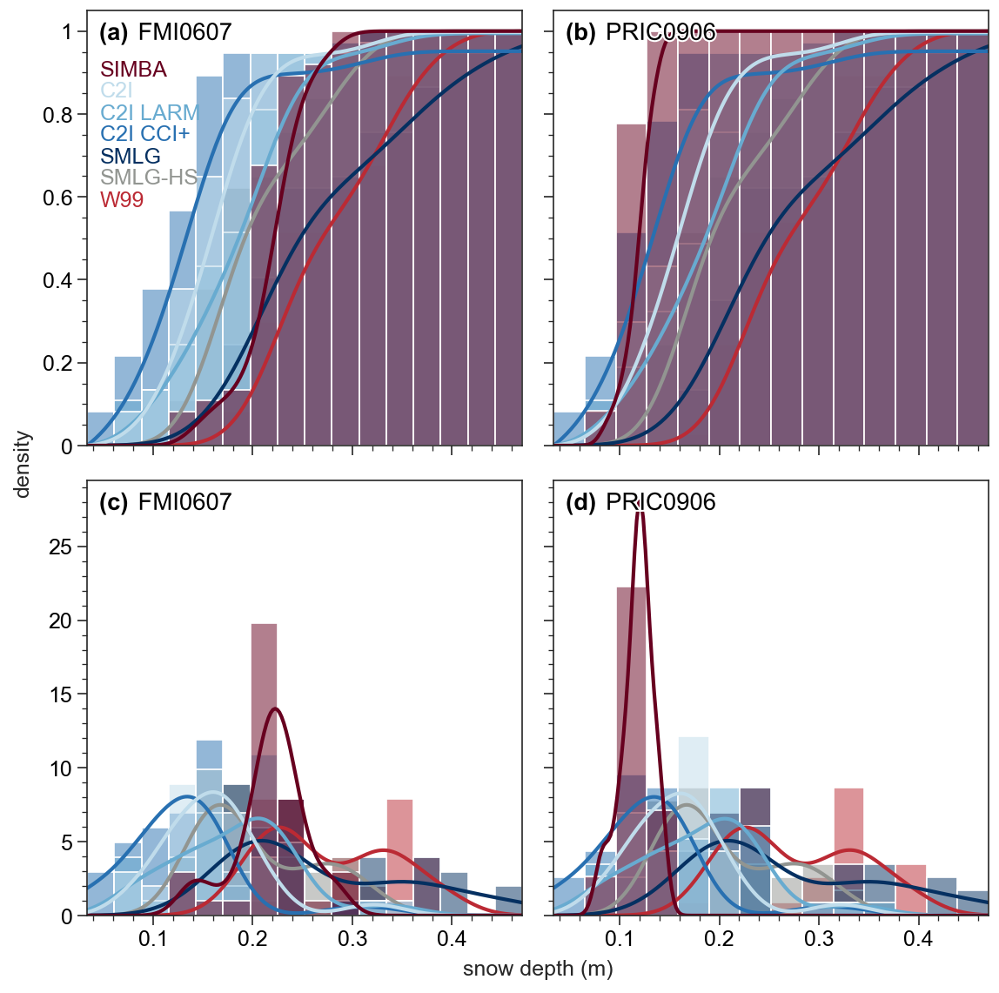

In [119]:
palette_custom ={'snow depth/cm': cmap_qual(0),
          'W99_snow_depth': cmap_qual(1),  
          "snow_depth_CRYO2ICE":cmap_qual(4), 
          "snow_depth_CRYO2ICE_LARM":cmap_qual(5), 
          "snow_depth_CRYO2ICE_CCI":cmap_qual(6), 
          "SMLG_snow_depth":cmap_qual(7), 
          "SMLG_snow_depth_v2":cmap_qual(8)}

fig, axs = pplt.subplots(nrows=2, ncols=2)

coincident_data = df_SIMBA_buoy_1[(df_SIMBA_buoy_1['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
sns.histplot(data = coincident_data, cumulative=True,common_norm=False,kde=True, palette=palette_custom, stat='density',ax=axs[0])
axs[0].legend().set_visible(False)
#axs[0].legend(['SIMBA', 'CRYO2ICE (C2I)', 'C2I LARM', 'C2I CCI', 'SMLG v1', 'SMLG v2', 'W99'])
axs[0].text(0.03, 0.85, 'SIMBA', transform=axs[0].transAxes,c=cmap_qual(0))
axs[0].text(0.03, 0.80, 'C2I', transform=axs[0].transAxes,c=cmap_qual(4))
axs[0].text(0.03, 0.75, 'C2I LARM', transform=axs[0].transAxes,c=cmap_qual(5))
axs[0].text(0.03, 0.70, 'C2I CCI+', transform=axs[0].transAxes,c=cmap_qual(6))
axs[0].text(0.03, 0.65, 'SMLG', transform=axs[0].transAxes,c=cmap_qual(7))
axs[0].text(0.03, 0.60, 'SMLG-HS', transform=axs[0].transAxes,c=cmap_qual(8))
axs[0].text(0.03, 0.55, 'W99', transform=axs[0].transAxes,c=cmap_qual(1))
axs[0].format(ultitle=df_SIMBA_buoy_1['ID'][0])

coincident_data = df_SIMBA_buoy_2[(df_SIMBA_buoy_2['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
sns.histplot(data = coincident_data, cumulative=True,common_norm=False,kde=True, palette=palette_custom, stat='density',ax=axs[1])
axs[1].legend().set_visible(False)
fig.format(xlabel='snow depth (m)', ylabel='density', abc='(a)', abcloc='ul')
axs[1].format(ultitle=df_SIMBA_buoy_2['ID'][0])

palette_custom ={'snow depth/cm': cmap_qual(0),
          'W99_snow_depth': cmap_qual(1),  
          "snow_depth_CRYO2ICE":cmap_qual(4), 
          "snow_depth_CRYO2ICE_LARM":cmap_qual(5), 
          "snow_depth_CRYO2ICE_CCI":cmap_qual(6), 
          "SMLG_snow_depth":cmap_qual(7), 
          "SMLG_snow_depth_v2":cmap_qual(8)}


coincident_data = df_SIMBA_buoy_1[(df_SIMBA_buoy_1['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
sns.histplot(data = coincident_data,common_norm=False,kde=True, palette=palette_custom, stat='density',ax=axs[2])
axs[2].legend().set_visible(False)
#axs[0].legend(['SIMBA', 'CRYO2ICE (C2I)', 'C2I LARM', 'C2I CCI', 'SMLG v1', 'SMLG v2', 'W99'])
axs[2].format(ultitle=df_SIMBA_buoy_1['ID'][0])

coincident_data = df_SIMBA_buoy_2[(df_SIMBA_buoy_2['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
sns.histplot(data = coincident_data, common_norm=False,kde=True, palette=palette_custom, stat='density',ax=axs[3])
axs[3].legend().set_visible(False)
fig.format(xlabel='snow depth (m)', ylabel='density', abc='(a)', abcloc='ul')
axs[3].format(ultitle=df_SIMBA_buoy_2['ID'][0])
plt.savefig('E:\demo_CRYO2ICE_SIMBA_sep_2d_50km_smoothed.png', transparent=True)

In [129]:
print('Statistics for: '+ str(df_SIMBA_buoy_1['ID'][0]))
coincident_data = df_SIMBA_buoy_1[(df_SIMBA_buoy_1['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_1['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
coincident_data.corr()
coincident_data.mean()
coincident_data.std()

print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_LARM']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_CCI']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth_v2']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['W99_snow_depth']))

from sklearn.metrics import mean_squared_error
a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE']
fit = linregress(b,a)
print('C2I - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_LARM']
fit = linregress(b,a)
print('C2I LARM - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_CCI']
fit = linregress(b,a)
print('C2I CCI - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth']
fit = linregress(b,a)
print('SMLG - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth_v2']
fit = linregress(b,a)
print('SMLG v2 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['W99_snow_depth']
fit = linregress(b,a)
print('W99 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))





Statistics for: FMI0607
0.05624707399139361
0.03535789454340212
0.0888075970548101
-0.05245315983488749
0.01261715152779143
-0.05918918918918919
C2I - Slope: 0.29970079092418067, intercept: 0.16978749822003
RMSE: 0.07325609130723199
C2I LARM - Slope: 0.32282210954170304, intercept: 0.15929531969742824
RMSE: 0.06050919665016304
C2I CCI - Slope: 0.28308363030526584, intercept: 0.18169901121981297
RMSE: 0.10220485098681771
SMLG - Slope: 0.1420287463693192, intercept: 0.1799125145286739
RMSE: 0.09798768017864107
SMLG v2 - Slope: 0.3397596123323057, intercept: 0.1484690237106034
RMSE: 0.04833039675343182
W99 - Slope: 0.2115581207715522, intercept: 0.159656705396653
RMSE: 0.08278733745714524


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/505365789.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  coincident_data.mean()
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/505365789.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  coincident_data.std()


In [133]:
print('Statistics for: '+ str(df_SIMBA_buoy_2['ID'][0]))
coincident_data = df_SIMBA_buoy_2[(df_SIMBA_buoy_2['snow depth/cm'].notna())&(df_SIMBA_buoy_2['snow_depth_CRYO2ICE'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_LARM'].notna()) & (df_SIMBA_buoy_2['snow_depth_CRYO2ICE_CCI'].notna())]
coincident_data=coincident_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'GPSLat', 'GPSLng', 'AMSR2_snow_depth_v2'])
coincident_data.corr()
coincident_data.mean()
coincident_data.std()

print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_LARM']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['snow_depth_CRYO2ICE_CCI']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['SMLG_snow_depth_v2']))
print(np.mean(coincident_data['snow depth/cm']-coincident_data['W99_snow_depth']))

from sklearn.metrics import mean_squared_error
a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE']
fit = linregress(b,a)
print('C2I - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_LARM']
fit = linregress(b,a)
print('C2I LARM - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['snow_depth_CRYO2ICE_CCI']
fit = linregress(b,a)
print('C2I CCI - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth']
fit = linregress(b,a)
print('SMLG - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['SMLG_snow_depth_v2']
fit = linregress(b,a)
print('SMLG v2 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

a = coincident_data['snow depth/cm']
b = coincident_data['W99_snow_depth']
fit = linregress(b,a)
print('W99 - Slope: '+ str(fit[0]) + ', intercept: ' + str(fit[1]))
print('RMSE: '+str(mean_squared_error(a,b,squared=False)))

Statistics for: PRIC0906


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1117525022.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  coincident_data.mean()
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/1117525022.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  coincident_data.std()


snow depth/cm               0.015236
snow_depth_CRYO2ICE         0.053281
snow_depth_CRYO2ICE_LARM    0.061904
snow_depth_CRYO2ICE_CCI     0.059003
SMLG_snow_depth             0.090534
SMLG_snow_depth_v2          0.058337
W99_snow_depth              0.063000
dtype: float64

# Snow density uncertainty simulation 

"\naxs[3].plot(sden_change,(t_change_sw-t_change_const_sw)*100, c=cmap_qual(0), label='$\\Delta$fb = 0.1 m, fb = 0.1 m')\naxs[3].plot(sden_change,(t_change_sw-t_change2_const_sw)*100, c=cmap_qual(1), label='$\\Delta$fb = 0.2 m, fb = 0.2 m')\naxs[3].plot(sden_change,(t_change_sw-t_change3_const_sw)*100, c=cmap_qual(2), label='$\\Delta$fb = 0.3 m, fb = 0.3 m')\naxs[3].plot(sden_change,(t_change_sw-t_change4_const_sw)*100, c='red', label='$\\Delta$fb = 0.4 m, fb = 0.4 m')\nfig.format(xlabel='snow density (kg/m$^{3}$)', abc='(a)', abcloc='ul' )\naxs[2].format(ylabel='$\\Delta$sea ice thickness (cm): variable-const.' )\naxs[3].format(ylabel='')\n"

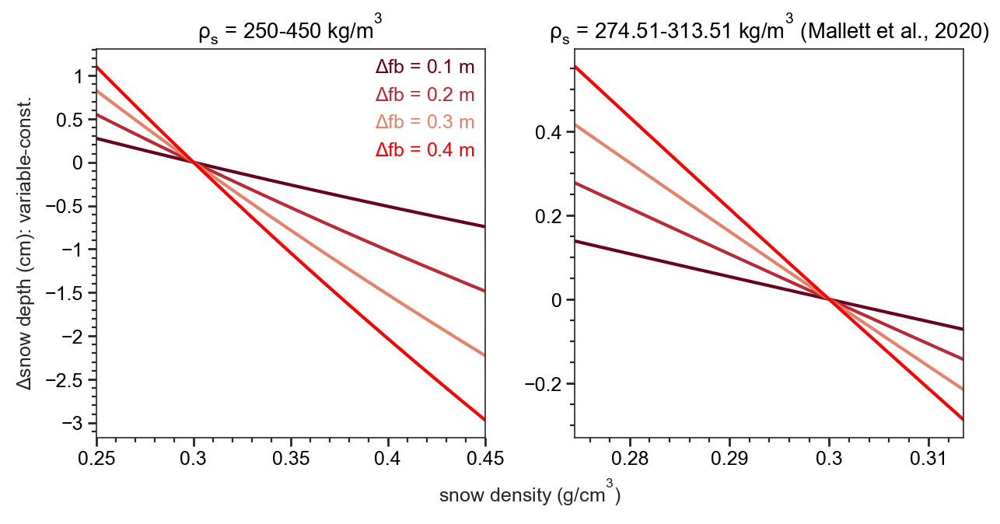

In [875]:
fig, axs = pplt.subplots(nrows=1, ncols=2, sharey=False)

rfb_change = np.full(100, 0.10)
rfb_change2 = np.full(100, 0.20)
rfb_change3 = np.full(100, 0.30)
rfb_change4 = np.full(100, 0.40)

sden_change = np.linspace(0.25, 0.45,100)
sden_change_const = np.full(100, 0.3)
ns = (1+0.51*sden_change)**(1.5)
ns_const = (1+0.51*sden_change_const)**(1.5)
snow_depth = (rfb_change/ns)
snow_depth2 = (rfb_change2/ns)
snow_depth3 = (rfb_change3/ns)
snow_depth4 = (rfb_change4/ns)
snow_depth_const = (rfb_change/ns_const)
snow_depth2_const = (rfb_change2/ns_const)
snow_depth3_const = (rfb_change3/ns_const)
snow_depth4_const = (rfb_change4/ns_const)

ns = (1+0.51*sden_change)**(-1.5)
ns_const = (1+0.51*sden_change_const)**(-1.5)
c = 3e+6
cs = c*ns
rfb_change_sw = rfb_change+((c/cs)-1)*snow_depth
rfb_change2_sw = rfb_change+((c/cs)-1)*snow_depth2
rfb_change3_sw = rfb_change+((c/cs)-1)*snow_depth3
rfb_change4_sw = rfb_change+((c/cs)-1)*snow_depth4
rho_w, rho_i = 1024, 900
t_change_sw = (rho_w/(rho_w-rho_i))*rfb_change_sw+(sden_change/(rho_w-rho_i))*snow_depth
t_change2_sw = (rho_w/(rho_w-rho_i))*rfb_change2_sw+(sden_change/(rho_w-rho_i))*snow_depth2
t_change3_sw = (rho_w/(rho_w-rho_i))*rfb_change3_sw+(sden_change/(rho_w-rho_i))*snow_depth3
t_change4_sw = (rho_w/(rho_w-rho_i))*rfb_change4_sw+(sden_change/(rho_w-rho_i))*snow_depth4
cs = c*ns_const
rfb_change_const_sw = rfb_change+((c/cs)-1)*snow_depth_const
rfb_change2_const_sw = rfb_change+((c/cs)-1)*snow_depth2_const
rfb_change3_const_sw = rfb_change+((c/cs)-1)*snow_depth3_const
rfb_change4_const_sw = rfb_change+((c/cs)-1)*snow_depth4_const
rho_w, rho_i = 1024, 900
t_change_const_sw = (rho_w/(rho_w-rho_i))*rfb_change_const_sw+(sden_change/(rho_w-rho_i))*snow_depth_const
t_change2_const_sw = (rho_w/(rho_w-rho_i))*rfb_change2_const_sw+(sden_change/(rho_w-rho_i))*snow_depth2_const
t_change3_const_sw = (rho_w/(rho_w-rho_i))*rfb_change3_const_sw+(sden_change/(rho_w-rho_i))*snow_depth3_const
t_change4_const_sw = (rho_w/(rho_w-rho_i))*rfb_change4_const_sw+(sden_change/(rho_w-rho_i))*snow_depth4_const



axs[0].plot(sden_change,(snow_depth-snow_depth_const)*100, c=cmap_qual(0), label='$\Delta$fb = 0.1 m')
axs[0].plot(sden_change,(snow_depth2-snow_depth2_const)*100, c=cmap_qual(1), label='$\Delta$fb = 0.2 m')
axs[0].plot(sden_change,(snow_depth3-snow_depth3_const)*100, c=cmap_qual(2), label='$\Delta$fb = 0.3 m')
axs[0].plot(sden_change,(snow_depth4-snow_depth4_const)*100, c='red', label='$\Delta$fb = 0.4 m')
axs[0].legend(ncol=1, handlelength=0, labelcolor='linecolor', frame=False)
fig.format(xlabel='snow density (g/cm$^{3}$)', ylabel='$\Delta$snow depth (cm): variable-const.' )

'''
axs[2].plot(sden_change,(t_change_sw-t_change_const_sw)*100, c=cmap_qual(0), label='$\Delta$fb = 0.1 m, fb = 0.1 m')
axs[2].plot(sden_change,(t_change_sw-t_change2_const_sw)*100, c=cmap_qual(1), label='$\Delta$fb = 0.2 m, fb = 0.2 m')
axs[2].plot(sden_change,(t_change_sw-t_change3_const_sw)*100, c=cmap_qual(2), label='$\Delta$fb = 0.3 m, fb = 0.3 m')
axs[2].plot(sden_change,(t_change_sw-t_change4_const_sw)*100, c='red', label='$\Delta$fb = 0.4 m, fb = 0.4 m')
axs[2].legend(ncol=1, handlelength=0, labelcolor='linecolor', frame=False)
fig.format(xlabel='snow density (kg/m$^{3}$)', abc='(a)', abcloc='ul' )
'''
axs[0].format(ylabel='$\Delta$snow depth (cm): variable-const.', title=r'$\rho_s$ = 250-450 kg/m$^3$' )
axs[1].format(ylabel='', title=r'$\rho_s$ = 274.51-313.51 kg/m$^3$ (Mallett et al., 2020)')

sden_change = np.linspace((6.50*0+274.51)/1000, (6.50*6+274.51)/1000,100)
sden_change_const = np.full(100, 0.3)
ns = (1+0.51*sden_change)**(1.5)
ns_const = (1+0.51*sden_change_const)**(1.5)
snow_depth = (rfb_change/ns)
snow_depth2 = (rfb_change2/ns)
snow_depth3 = (rfb_change3/ns)
snow_depth4 = (rfb_change4/ns)
snow_depth_const = (rfb_change/ns_const)
snow_depth2_const = (rfb_change2/ns_const)
snow_depth3_const = (rfb_change3/ns_const)
snow_depth4_const = (rfb_change4/ns_const)

ns = (1+0.51*sden_change)**(-1.5)
ns_const = (1+0.51*sden_change_const)**(-1.5)
c = 3e+6
cs = c*ns
rfb_change_sw = rfb_change+((c/cs)-1)*snow_depth
rfb_change2_sw = rfb_change+((c/cs)-1)*snow_depth2
rfb_change3_sw = rfb_change+((c/cs)-1)*snow_depth3
rfb_change4_sw = rfb_change+((c/cs)-1)*snow_depth4
rho_w, rho_i = 1024, 900
t_change_sw = (rho_w/(rho_w-rho_i))*rfb_change_sw+(sden_change/(rho_w-rho_i))*snow_depth
t_change2_sw = (rho_w/(rho_w-rho_i))*rfb_change2_sw+(sden_change/(rho_w-rho_i))*snow_depth2
t_change3_sw = (rho_w/(rho_w-rho_i))*rfb_change3_sw+(sden_change/(rho_w-rho_i))*snow_depth3
t_change4_sw = (rho_w/(rho_w-rho_i))*rfb_change4_sw+(sden_change/(rho_w-rho_i))*snow_depth4
cs = c*ns_const
rfb_change_const_sw = rfb_change+((c/cs)-1)*snow_depth_const
rfb_change2_const_sw = rfb_change+((c/cs)-1)*snow_depth2_const
rfb_change3_const_sw = rfb_change+((c/cs)-1)*snow_depth3_const
rfb_change4_const_sw = rfb_change+((c/cs)-1)*snow_depth4_const
rho_w, rho_i = 1024, 900
t_change_const_sw = (rho_w/(rho_w-rho_i))*rfb_change_const_sw+(sden_change/(rho_w-rho_i))*snow_depth_const
t_change2_const_sw = (rho_w/(rho_w-rho_i))*rfb_change2_const_sw+(sden_change/(rho_w-rho_i))*snow_depth2_const
t_change3_const_sw = (rho_w/(rho_w-rho_i))*rfb_change3_const_sw+(sden_change/(rho_w-rho_i))*snow_depth3_const
t_change4_const_sw = (rho_w/(rho_w-rho_i))*rfb_change4_const_sw+(sden_change/(rho_w-rho_i))*snow_depth4_const


axs[1].plot(sden_change,(snow_depth-snow_depth_const)*100, c=cmap_qual(0), label='$\Delta$fb = 0.1 m')
axs[1].plot(sden_change,(snow_depth2-snow_depth2_const)*100, c=cmap_qual(1), label='$\Delta$fb = 0.2 m')
axs[1].plot(sden_change,(snow_depth3-snow_depth3_const)*100, c=cmap_qual(2), label='$\Delta$fb = 0.3 m')
axs[1].plot(sden_change,(snow_depth4-snow_depth4_const)*100, c='red', label='$\Delta$fb = 0.4 m')
#axs[1].legend(ncol=1, handlelength=0, labelcolor='linecolor', frame=False)


'''
axs[3].plot(sden_change,(t_change_sw-t_change_const_sw)*100, c=cmap_qual(0), label='$\Delta$fb = 0.1 m, fb = 0.1 m')
axs[3].plot(sden_change,(t_change_sw-t_change2_const_sw)*100, c=cmap_qual(1), label='$\Delta$fb = 0.2 m, fb = 0.2 m')
axs[3].plot(sden_change,(t_change_sw-t_change3_const_sw)*100, c=cmap_qual(2), label='$\Delta$fb = 0.3 m, fb = 0.3 m')
axs[3].plot(sden_change,(t_change_sw-t_change4_const_sw)*100, c='red', label='$\Delta$fb = 0.4 m, fb = 0.4 m')
fig.format(xlabel='snow density (kg/m$^{3}$)', abc='(a)', abcloc='ul' )
axs[2].format(ylabel='$\Delta$sea ice thickness (cm): variable-const.' )
axs[3].format(ylabel='')
'''

# AWI raw vs processed data

In [493]:
path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S108'
filename_AWI = '2020S108_300234066081170_proc.csv'
filename_AWI2 = '2020S108_300234066081170_raw+filterflag.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0,0,0,0 # metres
#'''
'''
folder_AWI = '2020S107'
filename_AWI = '2020S107_300234066081140_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = np.nan, np.nan, np.nan, np.nan # metres
'''
'''
folder_AWI = '2020S106'
filename_AWI = '2020S106_300234066083120_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0,0,0,0 # metres
'''
'''
folder_AWI = '2020S105'
filename_AWI = '2020S105_300234066080130_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0.03,np.nan,0.02,0.04 # metres
'''
'''
folder_AWI = '2020S98'
filename_AWI = '2020S98_300234066087160_proc.csv'
init_sd_1, init_sd_2,init_sd_3,init_sd_4 = 0, 0, 0, 0 # metres
'''
df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

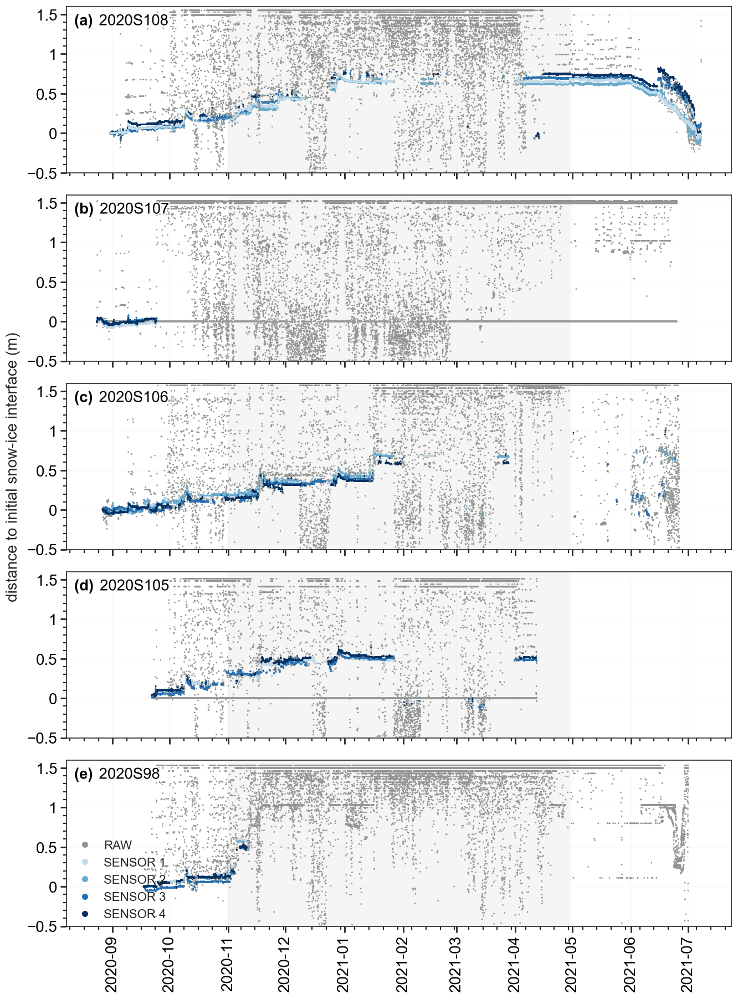

In [499]:
import seaborn as sns
import proplot as pplt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import linregress
pplt.rc.update(grid=True,gridminor=False)
pplt.rc['tick.linewidth'] = 1
#sns.set_style(style="ticks")
fig, axs = pplt.subplots([[1],[2], [3], [4], [5]],refwidth=6, refheight=1.5,share=True, span=True)
#fig, ax = plt.subplots(4,1, figsize=(10,10),constrained_layout=True)

### subplot A
path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S108'
filename_AWI = '2020S108_300234066081170_proc.csv'
filename_AWI2 = '2020S108_300234066081170_raw+filterflag.csv'

df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

df_AWI_buoy2['ID']='RAW'
df_AWI_buoy['ID']='FILT'

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(5)}

size_plot=1
axes=axs[0]
sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue="ID",palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(6)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(7)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(4)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)
axs[0].format(ultitle=folder_AWI)

### SUBPLOT B) 

path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S107'
filename_AWI = '2020S107_300234066081140_proc.csv'
filename_AWI2 = '2020S107_300234066081140_raw+filterflag.csv'

df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

df_AWI_buoy2['ID']='RAW'
df_AWI_buoy['ID']='FILT'

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(4)}

axes=axs[1]
sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue="ID",palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(5)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(6)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(7)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)
axs[1].format(ultitle=folder_AWI)

### SUBPLOT C) 

path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S106'
filename_AWI = '2020S106_300234066083120_proc.csv'
filename_AWI2 = '2020S106_300234066083120_raw+filterflag.csv'

df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

df_AWI_buoy2['ID']='RAW'
df_AWI_buoy['ID']='FILT'

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(4)}

axes=axs[2]
sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue="ID",palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(5)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(6)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(7)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)
axs[2].format(ultitle=folder_AWI)

### SUBPLOT D) 

path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S105'
filename_AWI = '2020S105_300234066080130_proc.csv'
filename_AWI2 = '2020S105_300234066080130_raw+filterflag.csv'

df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

df_AWI_buoy2['ID']='RAW'
df_AWI_buoy['ID']='FILT'

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(4)}

axes=axs[3]
sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue="ID",palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(5)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(6)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(7)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)
axs[3].format(ultitle=folder_AWI)

### SUBPLOT D) 

path_AWI = r'E:\DTU\CRYO2ICE\AWI_buoy'
#'''
folder_AWI = '2020S98'
filename_AWI = '2020S98_300234066087160_proc.csv'
filename_AWI2 = '2020S98_300234066087160_raw+filterflag.csv'

df_AWI_buoy = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI)
df_AWI_buoy["datetime"] = pd.to_datetime(df_AWI_buoy["time"])

df_AWI_buoy2 = pd.read_csv(path_AWI+'/' + folder_AWI + '/'+filename_AWI2)
df_AWI_buoy2["datetime"] = pd.to_datetime(df_AWI_buoy2["time"])

df_AWI_buoy2['ID']='RAW'
df_AWI_buoy['ID']='FILT'

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(4)}

axes=axs[4]
sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue="ID",palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_1 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(5)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_2 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(6)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_3 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)

palette_custom ={'RAW': cmap_qual_green(1),
          "FILT": cmap_qual(7)}

sns.scatterplot(data=df_AWI_buoy2,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue="ID", palette = palette_custom,legend="full",linewidth=0, s=size_plot,zorder=-1)
sns.scatterplot(data=df_AWI_buoy,x='datetime', y='distance_to_initial_snow_ice_interface_4 (m)',ax=axes, hue='ID', palette = palette_custom,legend="full",linewidth=0, s=size_plot)
axs[4].format(ultitle=folder_AWI)


axs[0].legend().set_visible(False)
axs[1].legend().set_visible(False)
axs[2].legend().set_visible(False)
axs[3].legend().set_visible(False)
axs[4].legend().set_visible(False)

fig.format(abc='(a)',abcloc='ul', ylabel='distance to initial snow-ice interface (m)', xlabel='', ylim=[-0.5, 1.6],ticklabelsize =10,labelsize =10)

axs[0].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[1].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[2].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[3].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
axs[4].axvspan(xmin=datetime.date(2020,11,1), xmax=datetime.date(2021, 4, 30), ymin=0, ymax=1, color='whitesmoke',zorder=-2)
 
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', label='RAW',
                          markerfacecolor='grey',color='w', markersize=5),
                   Line2D([0], [0], marker='o', color='w',label='SENSOR 1',
                          markerfacecolor=cmap_qual(4), markersize=5),
                   Line2D([0], [0], marker='o',color='w', label='SENSOR 2',
                          markerfacecolor=cmap_qual(5), markersize=5),
                  Line2D([0], [0], marker='o', color='w',label='SENSOR 3',
                          markerfacecolor=cmap_qual(6), markersize=5),
                  Line2D([0], [0], marker='o', color='w',label='SENSOR 4',
                          markerfacecolor=cmap_qual(7), markersize=5)]

# Create the figure

axs[4].legend(handles=legend_elements, loc='ll', ncols=1, frameon=False, prop={'size': 8})

plt.savefig('E:\demo_CRYO2ICE_AWI_raw_data_filtered_data.png', transparent=True, dpi=300)

# Grid to 25 km orbit segments and compare monthly

In [134]:
files_check_CS2_L2 = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_original_MSS/*W99_smooth_test.csv
    
list_total = np.arange(0, len(files_check_CS2_L2))
for k in list_total:
    fp1 = files_check_CS2_L2[k]
    basename_without_ext = os.path.splitext(os.path.basename(files_check_CS2_L2[k]))[0]
    print('File '+str(k)+'/'+str(len(list_total))+ ': ' + basename_without_ext)
    df_jan = pd.read_csv(fp1, index_col=None, header=0)
    
    print('Orbit-segment separation begun...')
    j=25e3 # in metres
    idx_multiplic = int(np.floor(np.max(df_jan['along_track_dist_in_metres'])/j))
    new_idx = np.arange(0+j/2, idx_multiplic*j, j)

    lat_new, lon_new, C2I_new, C2I_LARM_new, C2I_CCI_new, AMSR2_new, SMLGv1_new, SMLGv2_new, IS2_new, W99, CS2_smooth, CS2_LARM_smooth, CS2_CCI_smooth =  np.empty(len(new_idx)),np.empty(len(new_idx)),np.empty(len(new_idx)),np.empty(len(new_idx)),np.empty(len(new_idx)),np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx)), np.empty(len(new_idx))
    for i in np.arange(0, len(new_idx)):
        bol=df_jan['along_track_dist_in_metres']-new_idx[i]
        idx = np.where(abs(bol)<=j/2)
        if len(idx) >=1:
            lat_new[i] = np.nanmean(df_jan['lat'].iloc[idx])
            lon_new[i] = np.nanmean(df_jan['lon'].iloc[idx])
            C2I_new[i] = np.nanmean(df_jan['fb'].iloc[idx])
            C2I_LARM_new[i] = np.nanmean(df_jan['LARM_rfb'].iloc[idx])
            C2I_CCI_new[i] = np.nanmean(df_jan['CCI_rfb'].iloc[idx])
            IS2_new[i] = np.nanmean(df_jan['IS2_w_mean_fb_MSS'].iloc[idx])
            SMLGv1_new[i] = np.nanmean(df_jan['SMLG_snow_depth'].iloc[idx])
            SMLGv2_new[i] = np.nanmean(df_jan['SMLG_snow_depth_v2'].iloc[idx])
            W99[i] = np.nanmean(df_jan['W99'].iloc[idx])
            CS2_smooth[i] = np.nanmean(df_jan['CS2_smooth'].iloc[idx])
            CS2_LARM_smooth[i] = np.nanmean(df_jan['LARM_rfb_smooth'].iloc[idx])
            CS2_CCI_smooth[i] = np.nanmean(df_jan['CCI_rfb_smooth'].iloc[idx])
            AMSR2_data = df_jan['AMSR2_snow_depth'].iloc[idx]
            if -9999 in AMSR2_data:
                AMSR2_new[i]=-9999
            else:
                AMSR2_new[i] = np.nanmean(AMSR2_data)
        else:
            lat_new[i] = np.nan
            lon_new[i] = np.nan
            C2I_new[i] = np.nan
            C2I_LARM_new[i] = np.nan
            C2I_CCI_new[i] = np.nan
            IS2_new[i] = np.nan
            AMSR2_new[i] = np.nan
            SMLGv1_new[i] = np.nan
            SMLGv2_new[i] = np.nan
            W99[i] = np.nan
            C2I_smooth[i] = np.nan

    df_grid = pd.DataFrame({'lat':lat_new, 'lon':lon_new,'along_track_dist_in_metres':new_idx, 'fb':C2I_new, 'LARM_rfb':C2I_LARM_new,
             'CCI_rfb':C2I_CCI_new, 'IS2_fb':IS2_new,'AMSR2_snow_depth':AMSR2_new, 'SMLG_snow_depth':SMLGv1_new, 
             'SMLG_snow_depth_v2':SMLGv2_new, 'W99':W99, 'CS2_fb_smooth':CS2_smooth, 'CS2_LARM_fb_smooth':CS2_LARM_smooth, 'CS2_CCI_fb_smooth':CS2_CCI_smooth})
    
    ds=0.3
    ns = (1+0.51*ds)**1.5
    
    
    df_grid['C2I_snow'] = (df_grid['IS2_fb']-df_grid['fb'])/ns
    df_grid['C2I_LARM_snow'] = (df_grid['IS2_fb']-df_grid['LARM_rfb'])/ns
    df_grid['C2I_CCI_snow'] = (df_grid['IS2_fb']-df_grid['CCI_rfb'])/ns
    df_grid['C2I_smooth_snow'] = (df_grid['IS2_fb']-df_grid['CS2_fb_smooth'])/ns
    df_grid['C2I_LARM_smooth_snow'] = (df_grid['IS2_fb']-df_grid['CS2_LARM_fb_smooth'])/ns
    df_grid['C2I_CCI_smooth_snow'] = (df_grid['IS2_fb']-df_grid['CS2_CCI_fb_smooth'])/ns

    print('Saving data...')
    path='E:/DTU/CRYO2ICE'
    resolution_name='smooth_25km'
    df_grid.to_csv(path+'/'+basename_without_ext+'_gridded_'+resolution_name+'.csv')

    print('Analysis finished. Data available in CRYO2ICE-folder.')
  

print('Analysis finalized. All data processed whenever possible.')



File 0/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201102T123414_20201102T123933_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 1/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201105T032414_20201105T033327_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...


C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:20: RuntimeWarning: Mean of empty slice
  lat_new[i] = np.nanmean(df_jan['lat'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:21: RuntimeWarning: Mean of empty slice
  lon_new[i] = np.nanmean(df_jan['lon'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:22: RuntimeWarning: Mean of empty slice
  C2I_new[i] = np.nanmean(df_jan['fb'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:23: RuntimeWarning: Mean of empty slice
  C2I_LARM_new[i] = np.nanmean(df_jan['LARM_rfb'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:24: RuntimeWarning: Mean of empty slice
  C2I_CCI_new[i] = np.nanmean(df_jan['CCI_rfb'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipykernel_32640/3494333059.py:25: RuntimeWarning: Mean of empty slice
  IS2_new[i] = np.nanmean(df_jan['IS2_w_mean_fb_MSS'].iloc[idx])
C:\Users\rmfha\AppData\Local\Temp/ipyke

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 2/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201105T050433_20201105T051225_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 3/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201106T091244_20201106T091824_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 4/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201106T105159_20201106T105849_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 5/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201108T204331_20201108T204757_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Da

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 39/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201202T184118_20201202T184601_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 40/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201203T211042_20201203T211444_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 41/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201203T224742_20201203T225401_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 42/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201204T002920_20201204T003416_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 76/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201215T210038_20201215T210325_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 77/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201216T232729_20201216T233148_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 78/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201217T010445_20201217T011327_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 79/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20201217T024524_20201217T025312_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 111/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210107T013549_20210107T014337_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 112/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210107T045524_20210107T050255_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 113/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T040454_20210108T041151_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 114/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210108T054355_20210108T054938_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis fini

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 147/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210126T184048_20210126T184406_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 148/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T192831_20210127T193253_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 149/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T210810_20210127T211218_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 150/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210127T224237_20210127T225258_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis fini

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 183/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210209T214508_20210209T215034_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 184/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210209T232417_20210209T233210_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 185/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210210T010227_20210210T011158_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 186/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210210T042245_20210210T042826_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis fini

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 217/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T040158_20210304T040916_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 218/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T054043_20210304T054314_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 219/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T071906_20210304T072737_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 220/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210304T085559_20210304T090340_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis fini

Analysis finished. Data available in CRYO2ICE-folder.
File 251/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T003208_20210316T003921_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 252/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T021111_20210316T021825_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 253/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210316T035027_20210316T035714_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 254/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210317T061716_20210317T062222_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data avai

Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 287/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T060538_20210329T061431_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 288/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210329T092206_20210329T092825_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 289/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210330T100908_20210330T101657_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 290/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210330T133032_20210330T133450_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis fini

Analysis finished. Data available in CRYO2ICE-folder.
File 322/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210410T023659_20210410T024347_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 323/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T032526_20210411T033225_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 324/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T050348_20210411T050855_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
File 325/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210411T064100_20210411T064923_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data avai

Analysis finished. Data available in CRYO2ICE-folder.
File 357/358: CRYO2ICE_CRYO2ICE_CS_OFFL_SIR_SAR_2__20210429T194005_20210429T194755_D001_original_MSS_smooth_LARM_AMSR2_SMLG_W99_smooth_test
Orbit-segment separation begun...
Saving data...
Analysis finished. Data available in CRYO2ICE-folder.
Analysis finalized. All data processed whenever possible.


In [136]:
from scipy import signal 
def load_CRYO2ICE_month_v2(files_check_CS2_data, change_names=False):
    li = []
    k = 0
    for filename in files_check_CS2_data:
        df = pd.read_csv(filename, index_col=None, header=0)

        li.append(df)
        k = k+1
        li.append(df)

    frame2 = pd.concat(li, axis=0, ignore_index=True)
    
    return frame2

files_check_CS2_data = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/November/*_25km.csv
CRYO2ICE_nov = load_CRYO2ICE_month_v2(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/December/*_25km.csv
CRYO2ICE_dec = load_CRYO2ICE_month_v2(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/January/*_25km.csv
CRYO2ICE_jan = load_CRYO2ICE_month_v2(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/February/*_25km.csv
CRYO2ICE_feb = load_CRYO2ICE_month_v2(files_check_CS2_data)

files_check_CS2_data =  !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/March/*_25km.csv
CRYO2ICE_mar = load_CRYO2ICE_month_v2(files_check_CS2_data)

files_check_CS2_data = !ls E:/DTU/CRYO2ICE/Data/CRYO2ICE_gridded/W99_smooth/April/*_25km.csv
CRYO2ICE_apr = load_CRYO2ICE_month_v2(files_check_CS2_data)
CRYO2ICE_apr

CRYO2ICE_nov['month']='November'
CRYO2ICE_dec['month']='December'
CRYO2ICE_jan['month']='January'
CRYO2ICE_feb['month']='February'
CRYO2ICE_mar['month']='March'
CRYO2ICE_apr['month']='April'

frames = [CRYO2ICE_nov, CRYO2ICE_dec, CRYO2ICE_jan, CRYO2ICE_feb, CRYO2ICE_mar, CRYO2ICE_apr]

CRYO2ICE_comb_all = pd.concat(frames)
CRYO2ICE_comb_all['AMSR2_snow_depth_unit_m']=CRYO2ICE_comb_all['AMSR2_snow_depth']/100



In [138]:
def plot_panArctic10(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=75,lon_0=0, resolution='h',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    m.drawmapboundary(fill_color='white')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=1,vmin = min_set, vmax=max_set, cmap='reds', zorder=1)
     #cbar = plt.colorbar(x, extend =extend_info, orientation="horizontal",ax=ax)
    #cbar.set_label(label)

    ax.set_title(title, y=1.08,fontsize=18)
    return x


## Bi-monthly plots

First row plotted.
Second row plotted.
Third row plotted.
Fourth row plotted.
Fifth row plotted.
Formatted figure.
Added month-text.
Saving figure.
Figure saved.


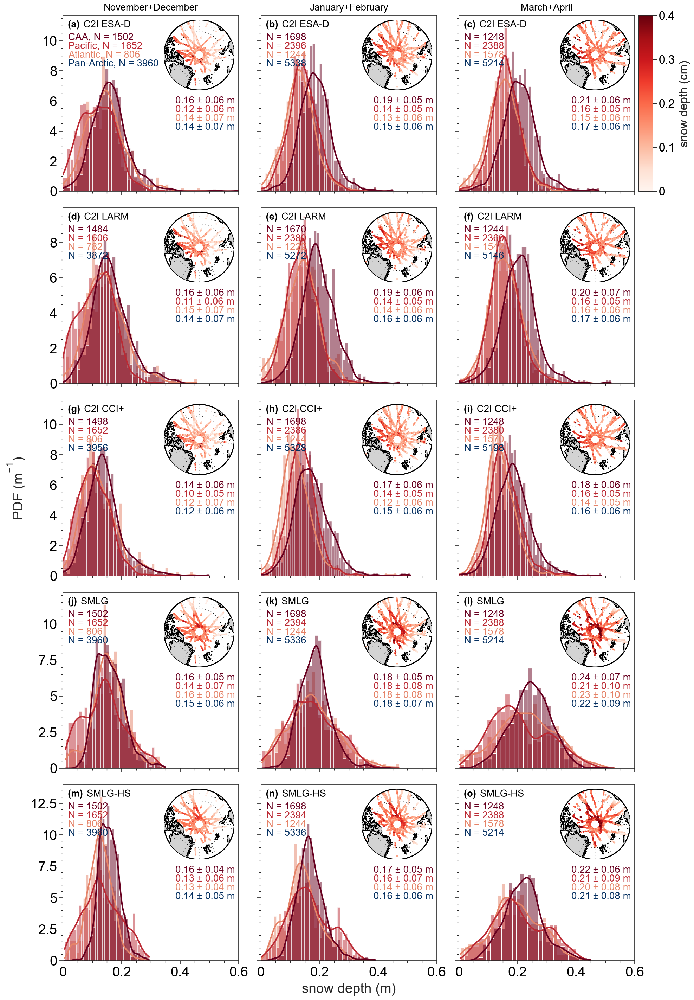

In [140]:
def plot_distributions_init(df, var, label, axes_def):
    df_CA = df[(df['lon']<-30) & (df['lon']>-150)]
    df_PA = df[~((df['lon']<90) & (df['lon']>-150))]
    df_AT = df[(df['lon']<90) & (df['lon']>-30)]
    df_check = pd.DataFrame({'snow_CA':df_CA[var],'snow_PA':df_PA[var],'snow_AT':df_AT[var]})
    palette_custom = {'snow_CA':cmap_qual(0),
                     'snow_PA':cmap_qual(1),
                     'snow_AT':cmap_qual(2)}
    _plot = sns.histplot(data = df_check,common_norm=False,kde=True,palette=palette_custom, stat='density',ax=axes_def)
    axes_def.legend().set_visible(False)
    axes_def.format(ultitle=label)
    axins = inset_axes(axes_def, width=1, height=1)
    axins.tick_params(labelleft=False, labelbottom=False)
    im = plot_panArctic10(df['lon'], df['lat'], df[var], 0, 0.4, cmap, 'radar freeboard (m)','max', axins,fig)
    text_CA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_CA[var]), np.nanstd(df_CA[var]))
    text_PA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_PA[var]), np.nanstd(df_PA[var]))
    text_AT = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_AT[var]), np.nanstd(df_AT[var]))
    text_panArctic = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df[var]), np.nanstd(df[var]))
    axes_def.text(0.64, 0.5, text_CA, transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.64, 0.45, text_PA, transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.64, 0.4, text_AT, transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.64, 0.35, text_panArctic, transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)
    axes_def.text(0.03, 0.86, 'CAA, N = {}'.format(len(df_CA[df_CA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.03, 0.81, 'Pacific, N = {}'.format(len(df_PA[df_PA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.03, 0.76, 'Atlantic, N = {}'.format(len(df_AT[df_AT[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.03, 0.71, 'Pan-Arctic, N = {}'.format(len(df[df[var].notna()])), transform=axs[0].transAxes,c=cmap_qual(7),fontsize=10)
    return im 

def plot_distributions(df, var, label, axes_def):
    df_CA = df[(df['lon']<-30) & (df['lon']>-150)]
    df_PA = df[~((df['lon']<90) & (df['lon']>-150))]
    df_AT = df[(df['lon']<90) & (df['lon']>-30)]
    df_check = pd.DataFrame({'snow_CA':df_CA[var],'snow_PA':df_PA[var],'snow_AT':df_AT[var]})
    palette_custom = {'snow_CA':cmap_qual(0),
                     'snow_PA':cmap_qual(1),
                     'snow_AT':cmap_qual(2)}
    _plot = sns.histplot(data = df_check,common_norm=False,kde=True,palette=palette_custom, stat='density',ax=axes_def)
    axes_def.legend().set_visible(False)
    axes_def.format(ultitle=label)
    axins = inset_axes(axes_def, width=1, height=1)
    axins.tick_params(labelleft=False, labelbottom=False)
    plot_panArctic10(df['lon'], df['lat'], df[var], 0, 0.4, cmap, 'radar freeboard (m)','max', axins,fig)
    text_CA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_CA[var]), np.nanstd(df_CA[var]))
    text_PA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_PA[var]), np.nanstd(df_PA[var]))
    text_AT = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_AT[var]), np.nanstd(df_AT[var]))
    text_panArctic = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df[var]), np.nanstd(df[var]))
    axes_def.text(0.64, 0.5, text_CA, transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.64, 0.45, text_PA, transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.64, 0.4, text_AT, transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.64, 0.35, text_panArctic, transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)
    axes_def.text(0.03, 0.86, 'N = {}'.format(len(df_CA[df_CA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.03, 0.81, 'N = {}'.format(len(df_PA[df_PA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.03, 0.76, 'N = {}'.format(len(df_AT[df_AT[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.03, 0.71, 'N = {}'.format(len(df[df[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)



from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, axs = pplt.subplots(ncols=3, nrows=5)

frames = [CRYO2ICE_nov, CRYO2ICE_dec]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_smooth_snow', 'C2I ESA-D', axs[0]
im = plot_distributions_init(df, var, label, axes_def)
cb = axs[2].colorbar(im, label='snow depth (cm)')
cb.ax.tick_params(labelsize=12)
cb.set_label('snow depth (cm)', size=12)
frames = [CRYO2ICE_jan, CRYO2ICE_feb]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_smooth_snow', 'C2I ESA-D', axs[1]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_mar, CRYO2ICE_apr]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_smooth_snow', 'C2I ESA-D', axs[2]
plot_distributions(df, var, label, axes_def)

print('First row plotted.')

frames = [CRYO2ICE_nov, CRYO2ICE_dec]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_LARM_smooth_snow', 'C2I LARM', axs[3]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_jan, CRYO2ICE_feb]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_LARM_smooth_snow', 'C2I LARM', axs[4]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_mar, CRYO2ICE_apr]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_LARM_smooth_snow', 'C2I LARM', axs[5]
plot_distributions(df, var, label, axes_def)

print('Second row plotted.')

frames = [CRYO2ICE_nov, CRYO2ICE_dec]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_CCI_smooth_snow', 'C2I CCI+', axs[6]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_jan, CRYO2ICE_feb]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_CCI_smooth_snow', 'C2I CCI+', axs[7]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_mar, CRYO2ICE_apr]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'C2I_CCI_smooth_snow', 'C2I CCI+', axs[8]
plot_distributions(df, var, label, axes_def)

print('Third row plotted.')

frames = [CRYO2ICE_nov, CRYO2ICE_dec]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth', 'SMLG', axs[9]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_jan, CRYO2ICE_feb]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth', 'SMLG', axs[10]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_mar, CRYO2ICE_apr]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth', 'SMLG', axs[11]
plot_distributions(df, var, label, axes_def)

print('Fourth row plotted.')

frames = [CRYO2ICE_nov, CRYO2ICE_dec]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth_v2', 'SMLG-HS', axs[12]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_jan, CRYO2ICE_feb]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth_v2', 'SMLG-HS', axs[13]
plot_distributions(df, var, label, axes_def)
frames = [CRYO2ICE_mar, CRYO2ICE_apr]
df = pd.concat(frames, ignore_index=True)
df, var, label,axes_def = df,'SMLG_snow_depth_v2', 'SMLG-HS', axs[14]
plot_distributions(df, var, label, axes_def)

print('Fifth row plotted.')


fig.format(abc='(a)', abcloc='ul',ticklabelsize =14,labelsize =14, xlabel='snow depth (m)', ylabel='PDF (m$^{-1}$)', xlim=[0, 0.6])
print('Formatted figure.')
axs[0].format(title='November+December')
axs[1].format(title='January+February')
axs[2].format(title='March+April')
print('Added month-text.')

print('Saving figure.')
plt.savefig('E:\distributions_plots_bimonthly.png', dpi=300)
print('Figure saved.')

## Accumulation rates plot

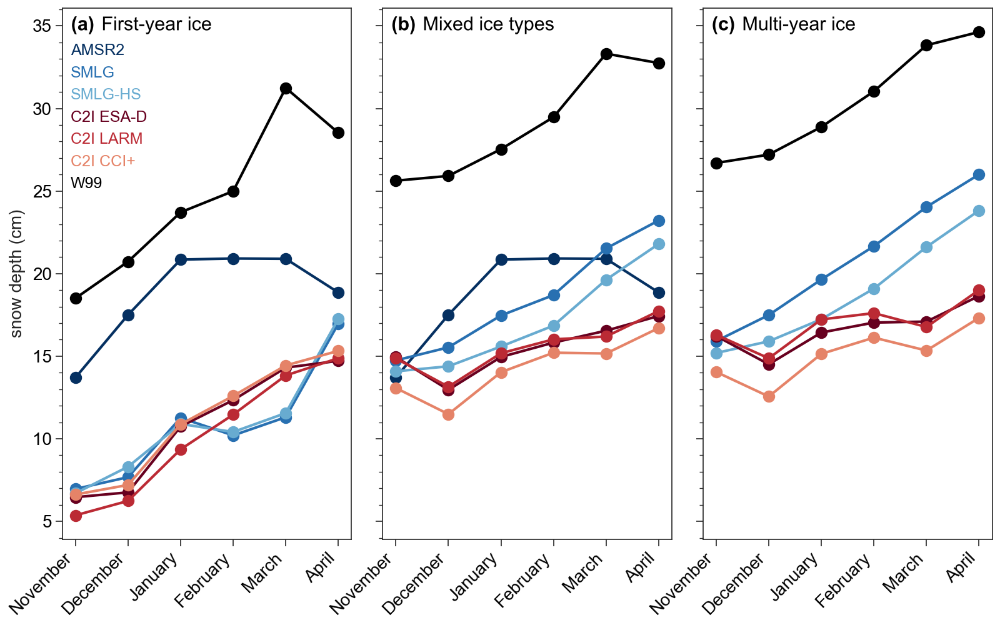

In [141]:
import proplot as pplt
fig = pplt.figure(space=2, figsize=(8,5), span=False, sharex=False, sharey=True)
ax = fig.subplots(nrows=1, ncols=3)
#fig, ax = plt.subplots(2, 3, figsize=(6,4), constrained_layout=True, sharey=True)
colours = cmap_qual
colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(5)[0:3],cmap_qual(6)[0:3],cmap_qual(7)[0:3]]
months = ['','November', 'December', 'January', 'February', 'March', 'April','']

def compute_monthly_growth(df_AMSR2, var):
    monthly_growth = [np.nan,np.nanmean(df_AMSR2[df_AMSR2['month']=='November'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='December'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='January'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='February'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='March'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='April'][var]),np.nan]
    return monthly_growth



df = CRYO2ICE_comb_all[(CRYO2ICE_comb_all['SMLG_snow_depth'].notna())&(CRYO2ICE_comb_all['C2I_snow'].notna()) & (CRYO2ICE_comb_all['C2I_LARM_snow'].notna()) & CRYO2ICE_comb_all['C2I_CCI_snow'].notna()]
df['W99_cm']=df['W99']*100
df['C2I_smooth_snow_unit_cm']=df['C2I_smooth_snow']*100
df['C2I_LARM_smooth_snow_unit_cm']=df['C2I_LARM_smooth_snow']*100
df['C2I_CCI_smooth_snow_unit_cm']=df['C2I_CCI_smooth_snow']*100
df['SMLG_snow_depth_unit_cm']=df['SMLG_snow_depth']*100
df['SMLG_snow_depth_v2_unit_cm']=df['SMLG_snow_depth_v2']*100
df_AMSR2 = df[(df['AMSR2_snow_depth'].notna()) & (df['AMSR2_snow_depth']!=-9999)]
df_MYI = df[df['AMSR2_snow_depth']<0]
df.loc[df['AMSR2_snow_depth']<0, 'AMSR2_snow_depth'] = np.nan
df_AMSR2[df_AMSR2['AMSR2_snow_depth']<0]=np.nan

monthly_growth_AMSR2 = compute_monthly_growth(df_AMSR2, 'AMSR2_snow_depth')
monthly_growth_SMLG = compute_monthly_growth(df_AMSR2, 'SMLG_snow_depth_unit_cm')
monthly_growth_SMLG_v2  = compute_monthly_growth(df_AMSR2, 'SMLG_snow_depth_v2_unit_cm')
monthly_growth_C2I = compute_monthly_growth(df_AMSR2, 'C2I_smooth_snow_unit_cm')
monthly_growth_C2I_LARM  = compute_monthly_growth(df_AMSR2, 'C2I_LARM_smooth_snow_unit_cm')
monthly_growth_C2I_CCI  = compute_monthly_growth(df_AMSR2, 'C2I_CCI_smooth_snow_unit_cm')
monthly_growth_W99  = compute_monthly_growth(df_AMSR2, 'W99_cm')


ax[0].plot(months, monthly_growth_AMSR2, linestyle='-',marker='o', c=colours[5], label='AMSR2')
ax[0].plot(months, monthly_growth_SMLG, linestyle='-',marker='o', c=colours[4], label="SMLG")
ax[0].plot(months, monthly_growth_SMLG_v2, linestyle='-',marker='o', c=colours[3], label="SMLG-HS")
ax[0].plot(months, monthly_growth_C2I, linestyle='-',marker='o', c=colours[0], label="C2I ESA-D")
ax[0].plot(months, monthly_growth_C2I_LARM, linestyle='-',marker='o', c=colours[1], label="C2I LARM")
ax[0].plot(months, monthly_growth_C2I_CCI, linestyle='-',marker='o', c=colours[2], label="C2I CCI+")
ax[0].plot(months, monthly_growth_W99, linestyle='-',marker='o', c='k', label="W99")

ax[0].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10, ultitle='First-year ice')

monthly_growth_AMSR2_exp2 = compute_monthly_growth(df, 'AMSR2_snow_depth')
monthly_growth_SMLG_exp2 = compute_monthly_growth(df, 'SMLG_snow_depth_unit_cm')
monthly_growth_SMLG_v2_exp2  = compute_monthly_growth(df, 'SMLG_snow_depth_v2_unit_cm')
monthly_growth_C2I_exp2  = compute_monthly_growth(df, 'C2I_smooth_snow_unit_cm')
monthly_growth_C2I_LARM_exp2  = compute_monthly_growth(df, 'C2I_LARM_smooth_snow_unit_cm')
monthly_growth_C2I_CCI_exp2  = compute_monthly_growth(df, 'C2I_CCI_smooth_snow_unit_cm')
monthly_growth_W99_exp2  = compute_monthly_growth(df, 'W99_cm')

ax[1].plot(months, monthly_growth_AMSR2_exp2, linestyle='-',marker='o', c=colours[5])
ax[1].plot(months, monthly_growth_SMLG_exp2, linestyle='-',marker='o', c=colours[4])
ax[1].plot(months, monthly_growth_SMLG_v2_exp2, linestyle='-',marker='o', c=colours[3])
ax[1].plot(months, monthly_growth_C2I_exp2, linestyle='-',marker='o', c=colours[0])
ax[1].plot(months, monthly_growth_C2I_LARM_exp2, linestyle='-',marker='o', c=colours[1])
ax[1].plot(months, monthly_growth_C2I_CCI_exp2, linestyle='-',marker='o', c=colours[2])
ax[1].plot(months, monthly_growth_W99_exp2, linestyle='-',marker='o', c='k')
ax[1].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)

ax[1].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10, ultitle='Mixed ice types')

monthly_growth_SMLG_exp3 = compute_monthly_growth(df_MYI, 'SMLG_snow_depth_unit_cm')
monthly_growth_SMLG_v2_exp3  = compute_monthly_growth(df_MYI, 'SMLG_snow_depth_v2_unit_cm')
monthly_growth_C2I_exp3  = compute_monthly_growth(df_MYI, 'C2I_smooth_snow_unit_cm')
monthly_growth_C2I_LARM_exp3  = compute_monthly_growth(df_MYI, 'C2I_LARM_smooth_snow_unit_cm')
monthly_growth_C2I_CCI_exp3  = compute_monthly_growth(df_MYI, 'C2I_CCI_smooth_snow_unit_cm')
monthly_growth_W99_exp3  = compute_monthly_growth(df_MYI, 'W99_cm')

ax[2].plot(months, monthly_growth_SMLG_exp3, linestyle='-',marker='o', c=colours[4])
ax[2].plot(months, monthly_growth_SMLG_v2_exp3, linestyle='-',marker='o', c=colours[3])
ax[2].plot(months, monthly_growth_C2I_exp3, linestyle='-',marker='o', c=colours[0])
ax[2].plot(months, monthly_growth_C2I_LARM_exp3, linestyle='-',marker='o', c=colours[1])
ax[2].plot(months, monthly_growth_C2I_CCI_exp3, linestyle='-',marker='o', c=colours[2])
ax[2].plot(months, monthly_growth_W99_exp3, linestyle='-',marker='o', c='k')
ax[2].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)

ax[2].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10, ultitle='Multi-year ice')

ax[0].legend(ncol=1, handlelength=0, markersize=0,labelcolor='linecolor', bbox_to_anchor=(0.32, 0.64), frame=False)


fig.format(abc='(a)', abcloc='ul')

#plt.savefig('E:\demo_CRYO2ICE_overall_comp_monthly_growth_gridded_orbit_wise_new_func_orbit_seg_25km_no_smooth.png', dpi=300)

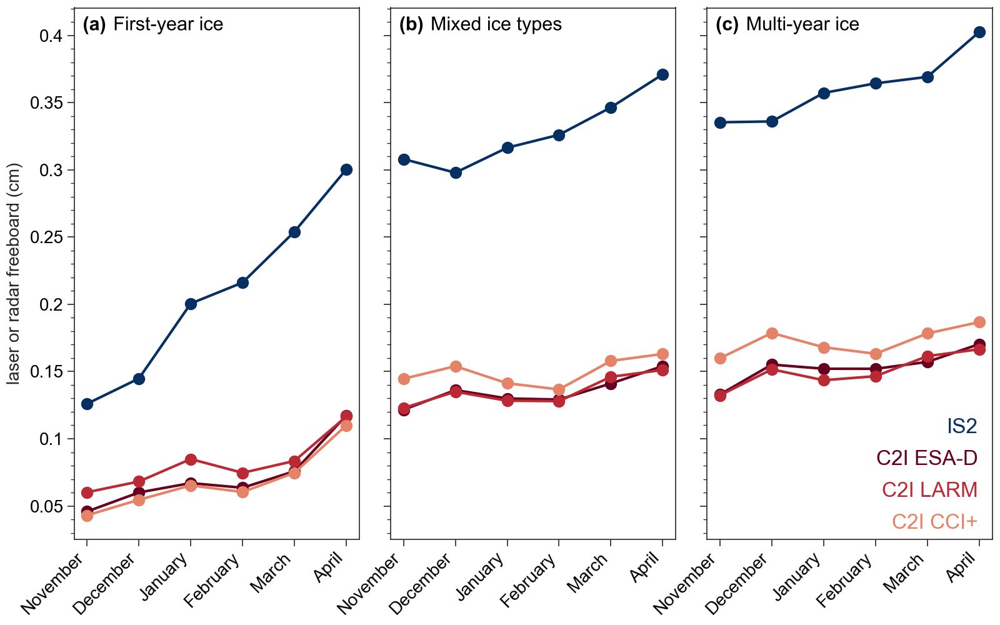

In [143]:
import proplot as pplt
fig = pplt.figure(space=2, figsize=(8,5), span=False, sharex=False, sharey=True)
ax = fig.subplots(nrows=1, ncols=3)
#fig, ax = plt.subplots(2, 3, figsize=(6,4), constrained_layout=True, sharey=True)
colours = cmap_qual
colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(5)[0:3],cmap_qual(6)[0:3],cmap_qual(7)[0:3]]
months = ['','November', 'December', 'January', 'February', 'March', 'April','']

def compute_monthly_growth(df_AMSR2, var):
    monthly_growth = [np.nan,np.nanmean(df_AMSR2[df_AMSR2['month']=='November'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='December'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='January'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='February'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='March'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='April'][var]),np.nan]
    return monthly_growth



df = CRYO2ICE_comb_all[(CRYO2ICE_comb_all['SMLG_snow_depth'].notna())&(CRYO2ICE_comb_all['C2I_snow'].notna()) & (CRYO2ICE_comb_all['C2I_LARM_snow'].notna()) & CRYO2ICE_comb_all['C2I_CCI_snow'].notna()]
df_AMSR2 = df[(df['AMSR2_snow_depth'].notna()) & (df['AMSR2_snow_depth']!=-9999)]
df_MYI = df[df['AMSR2_snow_depth']<0]
df.loc[df['AMSR2_snow_depth']<0, 'AMSR2_snow_depth'] = np.nan
df_AMSR2[df_AMSR2['AMSR2_snow_depth']<0]=np.nan



monthly_growth_AMSR2 = compute_monthly_growth(df_AMSR2, 'IS2_fb')
monthly_growth_C2I = compute_monthly_growth(df_AMSR2, 'fb')
monthly_growth_C2I_LARM  = compute_monthly_growth(df_AMSR2, 'LARM_rfb')
monthly_growth_C2I_CCI  = compute_monthly_growth(df_AMSR2, 'CCI_rfb')


ax[0].plot(months, monthly_growth_AMSR2, linestyle='-',marker='o', c=colours[5])

ax[0].plot(months, monthly_growth_C2I, linestyle='-',marker='o', c=colours[0])
ax[0].plot(months, monthly_growth_C2I_LARM, linestyle='-',marker='o', c=colours[1])
ax[0].plot(months, monthly_growth_C2I_CCI, linestyle='-',marker='o', c=colours[2])

ax[0].format(xrotation=45, ylabel='freeboard (cm)', fontsize=10, ultitle='First-year ice')


monthly_growth_AMSR2_exp2 = compute_monthly_growth(df, 'IS2_fb')
monthly_growth_C2I_exp2  = compute_monthly_growth(df, 'fb')
monthly_growth_C2I_LARM_exp2  = compute_monthly_growth(df, 'LARM_rfb')
monthly_growth_C2I_CCI_exp2  = compute_monthly_growth(df, 'CCI_rfb')

ax[1].plot(months, monthly_growth_AMSR2_exp2, linestyle='-',marker='o', c=colours[5])
ax[1].plot(months, monthly_growth_C2I_exp2, linestyle='-',marker='o', c=colours[0])
ax[1].plot(months, monthly_growth_C2I_LARM_exp2, linestyle='-',marker='o', c=colours[1])
ax[1].plot(months, monthly_growth_C2I_CCI_exp2, linestyle='-',marker='o', c=colours[2])
ax[1].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)

ax[1].format(xrotation=45, ylabel='freeboard (cm)', fontsize=10, ultitle='Mixed ice types')

monthly_growth_SMLG_exp3 = compute_monthly_growth(df_MYI, 'IS2_fb')
monthly_growth_C2I_exp3  = compute_monthly_growth(df_MYI, 'fb')
monthly_growth_C2I_LARM_exp3  = compute_monthly_growth(df_MYI, 'LARM_rfb')
monthly_growth_C2I_CCI_exp3  = compute_monthly_growth(df_MYI, 'CCI_rfb')

ax[2].plot(months, monthly_growth_SMLG_exp3, linestyle='-',marker='o', c=colours[5])
ax[2].plot(months, monthly_growth_C2I_exp3, linestyle='-',marker='o', c=colours[0])
ax[2].plot(months, monthly_growth_C2I_LARM_exp3, linestyle='-',marker='o', c=colours[1])
ax[2].plot(months, monthly_growth_C2I_CCI_exp3, linestyle='-',marker='o', c=colours[2])
ax[2].format(xrotation=45, ylabel='freeboard (cm)', fontsize=10)


x,y = np.arange(6), monthly_growth_SMLG_exp3[1:7]
coef = np.polyfit(x,y,1)
ax[2].text(0.95, 0.20, 'IS2', c=colours[5], transform = ax[2].transAxes, ha='right', fontsize=12)


x,y = np.arange(6), monthly_growth_C2I_exp3[1:7]
coef = np.polyfit(x,y,1)
ax[2].text(0.95, 0.14, 'C2I ESA-D', c=colours[0], transform = ax[2].transAxes, ha='right', fontsize=12)

x,y = np.arange(6), monthly_growth_C2I_LARM_exp3[1:7]
coef = np.polyfit(x,y,1)
ax[2].text(0.95, 0.08, 'C2I LARM',  c=colours[1], transform = ax[2].transAxes, ha='right', fontsize=12)

x,y = np.arange(6), monthly_growth_C2I_CCI_exp3[1:7]
coef = np.polyfit(x,y,1)
ax[2].text(0.95, 0.02, 'C2I CCI+',  c=colours[2], transform = ax[2].transAxes, ha='right', fontsize=12)

ax[2].format(xrotation=45, ylabel='laser or radar freeboard (cm)', fontsize=10, ultitle='Multi-year ice')



fig.format(abc='(a)', abcloc='ul')


# CryoSat2, ICESat-2, SnowModel-LG monthly products

In [144]:
import h5py
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20201101002333_05780901_003_01.h5"

with h5py.File(filename, "r") as f:
    lat = f['grid_lat'][:]
    lon = f['grid_lon'][:]
    nov_fb = f['monthly/mean_fb'][:]
    nov_fb[nov_fb>100]=np.nan
    lat=lat.ravel()
    lon=lon.ravel()
    nov_fb=nov_fb.ravel()
    
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20201201000814_10360901_003_01.h5"
with h5py.File(filename, "r") as f:
    dec_fb = f['monthly/mean_fb'][:]
    dec_fb[dec_fb>100]=np.nan
    dec_fb=dec_fb.ravel()
    
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20210101010136_01231001_003_01.h5"
with h5py.File(filename, "r") as f:
    jan_fb = f['monthly/mean_fb'][:]
    jan_fb[jan_fb>100]=np.nan
    jan_fb=nov_fb.ravel()
    
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20210201002039_05961001_003_01.h5"
with h5py.File(filename, "r") as f:
    feb_fb = f['monthly/mean_fb'][:]
    feb_fb[feb_fb>100]=np.nan
    feb_fb=feb_fb.ravel()
    
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20210301005637_10241001_003_01.h5"
with h5py.File(filename, "r") as f:
    mar_fb = f['monthly/mean_fb'][:]
    mar_fb[mar_fb>100]=np.nan
    mar_fb=mar_fb.ravel()
    
filename = r"E:\DTU\CRYO2ICE\ATL20\ATL20-01_20210401001541_01101101_003_01.h5"
with h5py.File(filename, "r") as f:
    apr_fb = f['monthly/mean_fb'][:]
    apr_fb[apr_fb>100]=np.nan
    apr_fb=apr_fb.ravel()
    
    
df_ATL20 = pd.DataFrame({'lat':lat, 'lon':lon, 'IS2_fb_nov':nov_fb,'IS2_fb_dec':dec_fb,'IS2_fb_jan':jan_fb,'IS2_fb_feb':feb_fb,
                        'IS2_fb_mar':mar_fb,'IS2_fb_apr':apr_fb})

In [145]:
def grid_data(lat_ori, lon_ori, var_ori, ref_lat, ref_lon, method_name='nearest'):
    grid_var = griddata((lon_ori, lat_ori), var_ori, (ref_lon, ref_lat), method=method_name)
    
    return grid_var

In [146]:
def load_data(path, fp):
    nc_file = netCDF4.Dataset(path + '/' + fp, 'r')
    sea_ice_freeboard = nc_file.variables['radar_freeboard'][:][0]
    lat = nc_file.variables['lat'][:]
    lon = nc_file.variables['lon'][:]
    nc_file.close()
    return sea_ice_freeboard, lat, lon

path = r"E:\DTU\CRYO2ICE\CCI\Gridded_CCI"
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202011-fv3p0-rc1.nc"
CCI_fb_nov, lat, lon = load_data(path, filename)
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202012-fv3p0-rc1.nc"
CCI_fb_dec, lat, lon = load_data(path, filename)
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202101-fv3p0-rc1.nc"
CCI_fb_jan, lat, lon = load_data(path, filename)
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202102-fv3p0-rc1.nc"
CCI_fb_feb, lat, lon = load_data(path, filename)
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202103-fv3p0-rc1.nc"
CCI_fb_mar, lat, lon = load_data(path, filename)
filename = "ESACCI-SEAICE-l3C-SITHICK-SIRAL_CRYOSAT2-NH_25KM_EASE2-202104-fv3p0-rc1.nc"
CCI_fb_apr, lat, lon = load_data(path, filename)

df_CCI_month = pd.DataFrame({'lat':lat.flatten(), 'lon':lon.flatten(), 'CCI_fb_nov':CCI_fb_nov.flatten(),'CCI_fb_dec':CCI_fb_dec.flatten(), 'CCI_fb_jan':CCI_fb_jan.flatten(),
                             'CCI_fb_feb':CCI_fb_feb.flatten(), 'CCI_fb_mar':CCI_fb_mar.flatten(), 'CCI_fb_apr':CCI_fb_apr.flatten()})

In [147]:
def load_data(path, fp):
    nc_file = netCDF4.Dataset(path + '/' + fp, 'r')
    sea_ice_freeboard = nc_file.variables['Radar_Freeboard_CS2'][:]
    ice_freeboard = nc_file.variables['Laser_Freeboard_IS2'][:]
    lat = nc_file.variables['Latitude'][:]
    lon = nc_file.variables['Longitude'][:]
    yr = nc_file.variables['Year'][:]
    month = nc_file.variables['Month'][:]
    nc_file.close()
    return sea_ice_freeboard, lat, lon, yr, month, ice_freeboard

path = r"E:\DTU\CRYO2ICE\LARM"
filename = "uit_snow_depth_50km_v2.nc"
LARM, lat, lon, yr, month, IS2 = load_data(path, filename)
LARM_nov = LARM[np.where((yr==2020)&(month==11))][0]
LARM_dec = LARM[np.where((yr==2020)&(month==12))][0]
LARM_jan = LARM[np.where((yr==2021)&(month==1))][0]
LARM_feb = LARM[np.where((yr==2021)&(month==2))][0]
LARM_mar = LARM[np.where((yr==2021)&(month==3))][0]
LARM_apr = LARM[np.where((yr==2021)&(month==4))][0]
IS2_nov = IS2[np.where((yr==2020)&(month==11))][0]
IS2_dec = IS2[np.where((yr==2020)&(month==12))][0]
IS2_jan = IS2[np.where((yr==2021)&(month==1))][0]
IS2_feb = IS2[np.where((yr==2021)&(month==2))][0]
IS2_mar = IS2[np.where((yr==2021)&(month==3))][0]
IS2_apr = IS2[np.where((yr==2021)&(month==4))][0]

df_LARM_month = pd.DataFrame({'lat':lat.flatten(), 'lon':lon.flatten(), 'LARM_fb_nov':LARM_nov.flatten(), 'LARM_fb_dec':LARM_dec.flatten(), 'LARM_fb_jan':LARM_jan.flatten(),
                             'LARM_fb_feb':LARM_feb.flatten(), 'LARM_fb_mar':LARM_mar.flatten(), 'LARM_fb_apr':LARM_apr.flatten(),
                             'IS2_fb_nov':IS2_nov.flatten(),'IS2_fb_dec':IS2_dec.flatten(), 'IS2_fb_jan':IS2_jan.flatten(),
                             'IS2_fb_feb':IS2_feb.flatten(), 'IS2_fb_mar':IS2_mar.flatten(), 'IS2_fb_apr':IS2_apr.flatten()})



In [148]:
def load_data(path, fp):
    nc_file = netCDF4.Dataset(path + '/' + fp, 'r')
    snow_depth = nc_file.variables['Snow_Depth_W99'][:]
    lat = nc_file.variables['Latitude'][:]
    lon = nc_file.variables['Longitude'][:]
    nc_file.close()
    return snow_depth, lat, lon, 

path = r"E:\DTU\CRYO2ICE\LARM\W99_from_LARM_product"
filename = "ubristol_cryosat2_seaicethickness_nh25km_2014_11_v1.nc"
mW99_nov, lat, lon = load_data(path, filename)
filename = "ubristol_cryosat2_seaicethickness_nh25km_2014_12_v1.nc"
mW99_dec, lat, lon = load_data(path, filename)
filename = "ubristol_cryosat2_seaicethickness_nh25km_2015_01_v1.nc"
mW99_jan, lat, lon = load_data(path, filename)
filename = "ubristol_cryosat2_seaicethickness_nh25km_2015_02_v1.nc"
mW99_feb, lat, lon = load_data(path, filename)
filename = "ubristol_cryosat2_seaicethickness_nh25km_2015_03_v1.nc"
mW99_mar, lat, lon = load_data(path, filename)
filename = "ubristol_cryosat2_seaicethickness_nh25km_2015_04_v1.nc"
mW99_apr, lat, lon = load_data(path, filename)


df_mW99_month = pd.DataFrame({'lat':lat.flatten(), 'lon':lon.flatten(), 'mW99_nov':mW99_nov.flatten(),'mW99_dec':mW99_dec.flatten(),
                              'mW99_jan':mW99_jan.flatten(),'mW99_feb':mW99_feb.flatten(),'mW99_mar':mW99_mar.flatten(),'mW99_apr':mW99_apr.flatten(),
                             })
df = df_mW99_month
var = 'mW99_nov'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'mW99_dec'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'mW99_jan'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'mW99_feb'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'mW99_mar'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'mW99_apr'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid

In [149]:

df = df_CCI_month
var = 'CCI_fb_nov'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'CCI_fb_dec'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'CCI_fb_jan'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'CCI_fb_feb'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'CCI_fb_mar'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid
var = 'CCI_fb_apr'
regrid = grid_data(df['lat'], df['lon'], df[var], df_LARM_month['lat'], df_LARM_month['lon'])
df_LARM_month[var]=regrid

In [151]:
def add_CRYO2ICE_snow_depth(df, var1, var2, var3, df2):
    
    ds = 0.30
    ns = (1+0.51*ds)**(1.5)
    df2[var3] = (df[var1]-df[var2])/ns
    return df2
    

df_CRYO2ICE_month = pd.DataFrame({'lat':df_LARM_month['lat'], 'lon':df_LARM_month['lon']})

df = df_LARM_month
var1, var2, var3 = 'IS2_fb_nov', 'LARM_fb_nov', 'C2I_LARM_nov'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_jan', 'LARM_fb_jan', 'C2I_LARM_jan'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_dec', 'LARM_fb_dec', 'C2I_LARM_dec'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_feb', 'LARM_fb_feb', 'C2I_LARM_feb'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_mar', 'LARM_fb_mar', 'C2I_LARM_mar'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_apr', 'LARM_fb_apr', 'C2I_LARM_apr'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)

var1, var2, var3 = 'IS2_fb_nov', 'CCI_fb_nov', 'C2I_CCI_nov'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_nov', 'CCI_fb_nov', 'C2I_CCI_dec'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_jan', 'CCI_fb_jan', 'C2I_CCI_jan'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_feb', 'CCI_fb_feb', 'C2I_CCI_feb'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_mar', 'CCI_fb_mar', 'C2I_CCI_mar'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)
var1, var2, var3 = 'IS2_fb_apr', 'CCI_fb_apr', 'C2I_CCI_apr'
df_CRYO2ICE_month = add_CRYO2ICE_snow_depth(df, var1, var2, var3, df_CRYO2ICE_month)

In [152]:
df_CRYO2ICE_month['C2I_LARM_nov_dec']=(df_CRYO2ICE_month['C2I_LARM_nov']+df_CRYO2ICE_month['C2I_LARM_dec'])/2
df_CRYO2ICE_month['C2I_LARM_jan_feb']=(df_CRYO2ICE_month['C2I_LARM_jan']+df_CRYO2ICE_month['C2I_LARM_feb'])/2
df_CRYO2ICE_month['C2I_LARM_mar_apr']=(df_CRYO2ICE_month['C2I_LARM_mar']+df_CRYO2ICE_month['C2I_LARM_apr'])/2
df_CRYO2ICE_month['C2I_CCI_nov_dec']=(df_CRYO2ICE_month['C2I_CCI_nov']+df_CRYO2ICE_month['C2I_CCI_dec'])/2
df_CRYO2ICE_month['C2I_CCI_jan_feb']=(df_CRYO2ICE_month['C2I_CCI_jan']+df_CRYO2ICE_month['C2I_CCI_feb'])/2
df_CRYO2ICE_month['C2I_CCI_mar_apr']=(df_CRYO2ICE_month['C2I_CCI_mar']+df_CRYO2ICE_month['C2I_CCI_apr'])/2

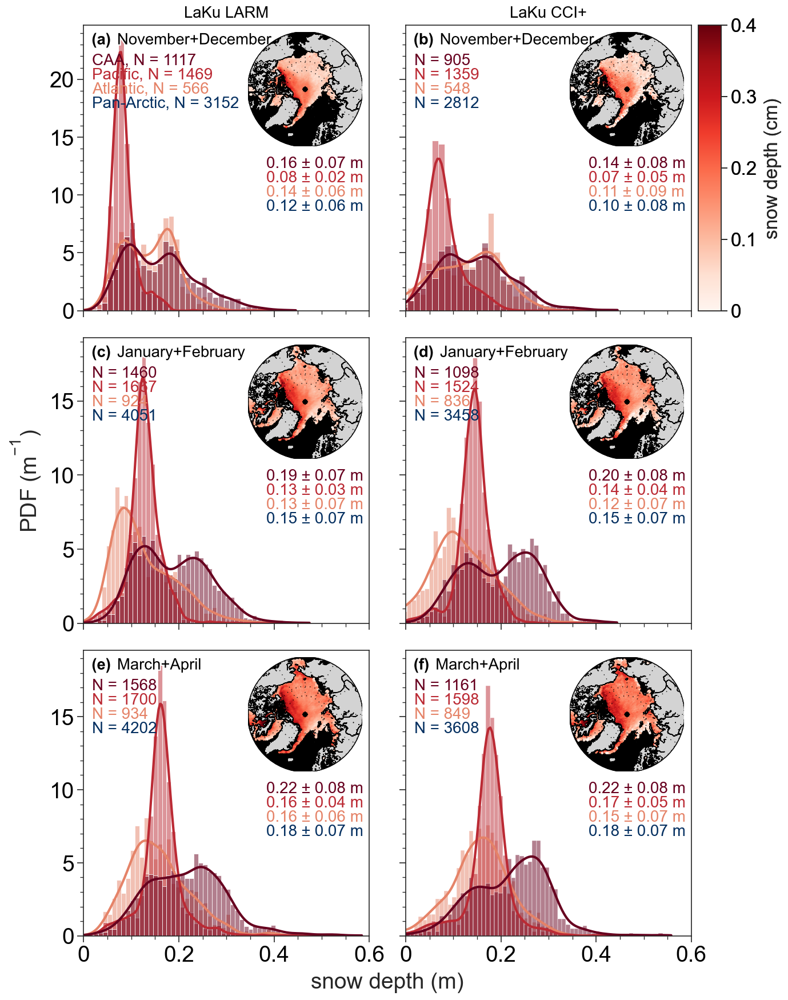

In [155]:
def plot_distributions_init(df, var, label, axes_def):
    df_CA = df[(df['lon']<-30) & (df['lon']>-150)]
    df_PA = df[~((df['lon']<90) & (df['lon']>-150))]
    df_AT = df[(df['lon']<90) & (df['lon']>-30)]
    df_check = pd.DataFrame({'snow_CA':df_CA[var],'snow_PA':df_PA[var],'snow_AT':df_AT[var]})
    palette_custom = {'snow_CA':cmap_qual(0),
                     'snow_PA':cmap_qual(1),
                     'snow_AT':cmap_qual(2)}
    _plot = sns.histplot(data = df_check,common_norm=False,kde=True,palette=palette_custom, stat='density',ax=axes_def)
    axes_def.legend().set_visible(False)
    axes_def.format(ultitle=label)
    axins = inset_axes(axes_def, width=1, height=1)
    axins.tick_params(labelleft=False, labelbottom=False)
    im = plot_panArctic10(df['lon'], df['lat'], df[var], 0, 0.4, cmap, 'radar freeboard (m)','max', axins,fig)
    text_CA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_CA[var]), np.nanstd(df_CA[var]))
    text_PA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_PA[var]), np.nanstd(df_PA[var]))
    text_AT = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_AT[var]), np.nanstd(df_AT[var]))
    text_panArctic = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df[var]), np.nanstd(df[var]))
    axes_def.text(0.64, 0.5, text_CA, transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.64, 0.45, text_PA, transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.64, 0.4, text_AT, transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.64, 0.35, text_panArctic, transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)
    axes_def.text(0.03, 0.86, 'CAA, N = {}'.format(len(df_CA[df_CA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.03, 0.81, 'Pacific, N = {}'.format(len(df_PA[df_PA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.03, 0.76, 'Atlantic, N = {}'.format(len(df_AT[df_AT[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.03, 0.71, 'Pan-Arctic, N = {}'.format(len(df[df[var].notna()])), transform=axs[0].transAxes,c=cmap_qual(7),fontsize=10)
    return im 

def plot_distributions(df, var, label, axes_def):
    df_CA = df[(df['lon']<-30) & (df['lon']>-150)]
    df_PA = df[~((df['lon']<90) & (df['lon']>-150))]
    df_AT = df[(df['lon']<90) & (df['lon']>-30)]
    df_check = pd.DataFrame({'snow_CA':df_CA[var],'snow_PA':df_PA[var],'snow_AT':df_AT[var]})
    palette_custom = {'snow_CA':cmap_qual(0),
                     'snow_PA':cmap_qual(1),
                     'snow_AT':cmap_qual(2)}
    _plot = sns.histplot(data = df_check,common_norm=False,kde=True,palette=palette_custom, stat='density',ax=axes_def)
    axes_def.legend().set_visible(False)
    axes_def.format(ultitle=label)
    axins = inset_axes(axes_def, width=1, height=1)
    axins.tick_params(labelleft=False, labelbottom=False)
    plot_panArctic10(df['lon'], df['lat'], df[var], 0, 0.4, cmap, 'radar freeboard (m)','max', axins,fig)
    text_CA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_CA[var]), np.nanstd(df_CA[var]))
    text_PA = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_PA[var]), np.nanstd(df_PA[var]))
    text_AT = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df_AT[var]), np.nanstd(df_AT[var]))
    text_panArctic = '{:.2f} \u00B1 {:.2f} m'.format(np.nanmean(df[var]), np.nanstd(df[var]))
    axes_def.text(0.64, 0.5, text_CA, transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.64, 0.45, text_PA, transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.64, 0.4, text_AT, transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.64, 0.35, text_panArctic, transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)
    axes_def.text(0.03, 0.86, 'N = {}'.format(len(df_CA[df_CA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(0),fontsize=10)
    axes_def.text(0.03, 0.81, 'N = {}'.format(len(df_PA[df_PA[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(1),fontsize=10)
    axes_def.text(0.03, 0.76, 'N = {}'.format(len(df_AT[df_AT[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(2),fontsize=10)
    axes_def.text(0.03, 0.71, 'N = {}'.format(len(df[df[var].notna()])), transform=axes_def.transAxes,c=cmap_qual(7),fontsize=10)

def plot_panArctic10(lon, lat, sit, min_set, max_set, cmap_set, label, extend_info, ax, fig):
    #fig = plt.figure(figsize=(6,5))
    fig.patch.set_facecolor('white')
    #ax = plt.gca()
    #m = Basemap(projection='ortho',lat_0=90,lon_0=0,resolution='l', ax=ax);
    x1 = -180
    x2 = 180
    y1 = 0
    y2 = 90
    cmap1 = plt.get_cmap('greys', 4)

    m = Basemap(projection='npstere', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,boundinglat=60,lon_0=0, resolution='i',ax=ax, round=True)
    m.drawmeridians(np.arange(0,360,30),labels=[0,0,0,0],linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawparallels(np.arange(-90,90,15),linewidth=0.5, fontsize=10, dashes=[1,5],labels=[0,0,0,0])
    m.drawcoastlines(linewidth=0.5)
    m.fillcontinents(color='lightgray')
    #m.fillcontinents(color='darkgray')
    m.drawmapboundary(fill_color='black')
    #cbar = m.etopo()
    x=m.scatter(lon, lat, latlon=True, c=sit, s=1,vmin = min_set, vmax=max_set, cmap=cmap_set, zorder=1)

    return x

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns
fig, axs = pplt.subplots(ncols=2, nrows=3)
cmap = 'reds'

df = df_CRYO2ICE_month
df, var, label,axes_def = df,'C2I_LARM_nov_dec', 'November+December', axs[0]
im = plot_distributions_init(df, var, label, axes_def)
cb = axs[1].colorbar(im, label='snow depth (cm)')
cb.ax.tick_params(labelsize=12)
cb.set_label('snow depth (cm)', size=12)

df, var, label,axes_def = df,'C2I_CCI_nov_dec', 'November+December', axs[1]
plot_distributions(df, var, label, axes_def)

df, var, label,axes_def = df,'C2I_LARM_jan_feb', 'January+February', axs[2]
plot_distributions(df, var, label, axes_def)
df, var, label,axes_def = df,'C2I_CCI_jan_feb', 'January+February', axs[3]
plot_distributions(df, var, label, axes_def)

df, var, label,axes_def = df,'C2I_LARM_mar_apr', 'March+April', axs[4]
plot_distributions(df, var, label, axes_def)
df, var, label,axes_def = df,'C2I_CCI_mar_apr', 'March+April', axs[5]
plot_distributions(df, var, label, axes_def)


axs[0].format(title='LaKu LARM')
axs[1].format(title='LaKu CCI+')

fig.format(abc='(a)', abcloc='ul',ticklabelsize =14,labelsize =14, xlabel='snow depth (m)', ylabel='PDF (m$^{-1}$)', xlim=[0, 0.6])

In [153]:
df = df_CRYO2ICE_month
df_CA_LaKu = df[(df['lon']<-30) & (df['lon']>-150)]
df_PA_LaKu  = df[~((df['lon']<90) & (df['lon']>-150))]
df_AT_LaKu  = df[(df['lon']<90) & (df['lon']>-30)]
LaKu_monthly_LARM_CA = [np.nan,np.nanmean(df_CA_LaKu ['C2I_LARM_nov']),np.nanmean(df_CA_LaKu ['C2I_LARM_dec']),np.nanmean(df_CA_LaKu['C2I_LARM_jan']),
                       np.nanmean(df_CA_LaKu ['C2I_LARM_feb']),np.nanmean(df_CA_LaKu ['C2I_LARM_mar']),np.nanmean(df_CA_LaKu['C2I_LARM_apr']),np.nan]
LaKu_monthly_LARM_PA = [np.nan,np.nanmean(df_PA_LaKu ['C2I_LARM_nov']),np.nanmean(df_PA_LaKu['C2I_LARM_dec']),np.nanmean(df_PA_LaKu['C2I_LARM_jan']),
                       np.nanmean(df_PA_LaKu ['C2I_LARM_feb']),np.nanmean(df_PA_LaKu['C2I_LARM_mar']),np.nanmean(df_PA_LaKu['C2I_LARM_apr']),np.nan]
LaKu_monthly_LARM_AT = [np.nan,np.nanmean(df_AT_LaKu ['C2I_LARM_nov']),np.nanmean(df_AT_LaKu['C2I_LARM_dec']),np.nanmean(df_AT_LaKu['C2I_LARM_jan']),
                       np.nanmean(df_AT_LaKu ['C2I_LARM_feb']),np.nanmean(df_AT_LaKu['C2I_LARM_mar']),np.nanmean(df_AT_LaKu['C2I_LARM_apr']),np.nan]

LaKu_monthly_CCI_CA = [np.nan,np.nanmean(df_CA_LaKu ['C2I_CCI_nov']),np.nanmean(df_CA_LaKu['C2I_CCI_dec']),np.nanmean(df_CA_LaKu['C2I_CCI_jan']),
                       np.nanmean(df_CA_LaKu ['C2I_CCI_feb']),np.nanmean(df_CA_LaKu['C2I_CCI_mar']),np.nanmean(df_CA_LaKu['C2I_CCI_apr']),np.nan]
LaKu_monthly_CCI_PA = [np.nan,np.nanmean(df_PA_LaKu ['C2I_CCI_nov']),np.nanmean(df_PA_LaKu['C2I_CCI_dec']),np.nanmean(df_PA_LaKu['C2I_CCI_jan']),
                       np.nanmean(df_PA_LaKu ['C2I_CCI_feb']),np.nanmean(df_PA_LaKu['C2I_CCI_mar']),np.nanmean(df_PA_LaKu['C2I_CCI_apr']),np.nan]
LaKu_monthly_CCI_AT = [np.nan,np.nanmean(df_AT_LaKu ['C2I_CCI_nov']),np.nanmean(df_AT_LaKu['C2I_CCI_dec']),np.nanmean(df_AT_LaKu['C2I_CCI_jan']),
                       np.nanmean(df_AT_LaKu ['C2I_CCI_feb']),np.nanmean(df_AT_LaKu['C2I_CCI_mar']),np.nanmean(df_AT_LaKu['C2I_CCI_apr']),np.nan]

df = df_LARM_month
df_CA_LaKu = df[(df['lon']<-30) & (df['lon']>-150)]
df_PA_LaKu  = df[~((df['lon']<90) & (df['lon']>-150))]
df_AT_LaKu  = df[(df['lon']<90) & (df['lon']>-30)]
mW99_monthly_CA = [np.nan,np.nanmean(df_CA_LaKu ['mW99_nov']),np.nanmean(df_CA_LaKu['mW99_dec']),np.nanmean(df_CA_LaKu['mW99_jan']),
                       np.nanmean(df_CA_LaKu ['mW99_feb']),np.nanmean(df_CA_LaKu['mW99_mar']),np.nanmean(df_CA_LaKu['mW99_apr']),np.nan]
mW99_monthly_PA = [np.nan,np.nanmean(df_PA_LaKu ['mW99_nov']),np.nanmean(df_PA_LaKu['mW99_dec']),np.nanmean(df_PA_LaKu['mW99_jan']),
                       np.nanmean(df_PA_LaKu ['mW99_feb']),np.nanmean(df_PA_LaKu['mW99_mar']),np.nanmean(df_PA_LaKu['mW99_apr']),np.nan]
mW99_monthly_AT = [np.nan,np.nanmean(df_AT_LaKu ['mW99_nov']),np.nanmean(df_AT_LaKu['mW99_dec']),np.nanmean(df_AT_LaKu['mW99_jan']),
                       np.nanmean(df_AT_LaKu ['mW99_feb']),np.nanmean(df_AT_LaKu['mW99_mar']),np.nanmean(df_AT_LaKu['mW99_apr']),np.nan]

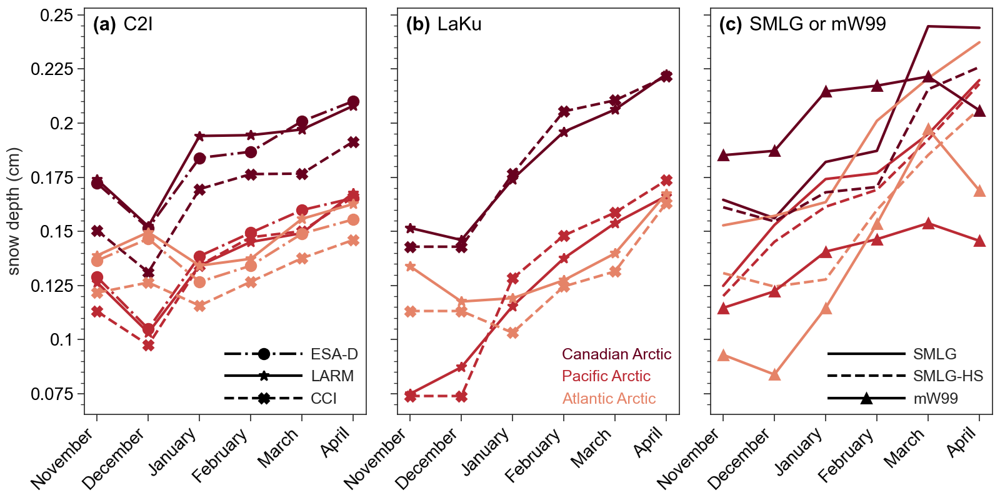

In [154]:
import proplot as pplt
fig = pplt.figure(space=2, figsize=(8,4), span=False, sharex=False, sharey=True)
ax = fig.subplots(nrows=1, ncols=3)
#fig, ax = plt.subplots(2, 3, figsize=(6,4), constrained_layout=True, sharey=True)
colours = cmap_qual
colours = [cmap_qual(0)[0:3],cmap_qual(1)[0:3],cmap_qual(2)[0:3],cmap_qual(5)[0:3],cmap_qual(6)[0:3],cmap_qual(7)[0:3]]
months = ['','November', 'December', 'January', 'February', 'March', 'April','']

def compute_monthly_growth(df_AMSR2, var):
    monthly_growth = [np.nan,np.nanmean(df_AMSR2[df_AMSR2['month']=='November'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='December'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='January'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='February'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='March'][var]),
                            np.nanmean(df_AMSR2[df_AMSR2['month']=='April'][var]),np.nan]
    return monthly_growth
df = CRYO2ICE_comb_all
df_CA = df[(df['lon']<-30) & (df['lon']>-150)]
df_PA = df[~((df['lon']<90) & (df['lon']>-150))]
df_AT = df[(df['lon']<90) & (df['lon']>-30)]

C2I_monthly_ESAD_CA = compute_monthly_growth(df_CA, 'C2I_smooth_snow')
C2I_monthly_LARM_CA = compute_monthly_growth(df_CA, 'C2I_LARM_smooth_snow')
C2I_monthly_CCI_CA = compute_monthly_growth(df_CA, 'C2I_CCI_smooth_snow')

C2I_monthly_ESAD_PA = compute_monthly_growth(df_PA, 'C2I_smooth_snow')
C2I_monthly_LARM_PA = compute_monthly_growth(df_PA, 'C2I_LARM_smooth_snow')
C2I_monthly_CCI_PA = compute_monthly_growth(df_PA, 'C2I_CCI_smooth_snow')

C2I_monthly_ESAD_AT = compute_monthly_growth(df_AT, 'C2I_smooth_snow')
C2I_monthly_LARM_AT = compute_monthly_growth(df_AT, 'C2I_LARM_smooth_snow')
C2I_monthly_CCI_AT = compute_monthly_growth(df_AT, 'C2I_CCI_smooth_snow')

C2I_monthly_SMLG_CA = compute_monthly_growth(df_CA, 'SMLG_snow_depth')
C2I_monthly_SMLG_PA= compute_monthly_growth(df_PA, 'SMLG_snow_depth')
C2I_monthly_SMLG_AT = compute_monthly_growth(df_AT, 'SMLG_snow_depth')

C2I_monthly_SMLG_v2_CA = compute_monthly_growth(df_CA, 'SMLG_snow_depth_v2')
C2I_monthly_SMLG_v2_PA= compute_monthly_growth(df_PA, 'SMLG_snow_depth_v2')
C2I_monthly_SMLG_v2_AT = compute_monthly_growth(df_AT, 'SMLG_snow_depth_v2')

ax[0].plot(months, C2I_monthly_ESAD_CA, linestyle='-.',marker='o', c=colours[0], label='ESA-D')
ax[0].plot(months, C2I_monthly_LARM_CA, linestyle='-',marker='*', c=colours[0], label='LARM')
ax[0].plot(months, C2I_monthly_CCI_CA , linestyle='--',marker='X', c=colours[0], label='CCI')

ax[0].plot(months, C2I_monthly_ESAD_PA, linestyle='-.',marker='o', c=colours[1])
ax[0].plot(months, C2I_monthly_LARM_PA, linestyle='-',marker='*', c=colours[1])
ax[0].plot(months, C2I_monthly_CCI_PA , linestyle='--',marker='X', c=colours[1])

ax[0].plot(months, C2I_monthly_ESAD_AT, linestyle='-.',marker='o', c=colours[2])
ax[0].plot(months, C2I_monthly_LARM_AT, linestyle='-',marker='*', c=colours[2])
ax[0].plot(months, C2I_monthly_CCI_AT , linestyle='--',marker='X', c=colours[2])


ax[1].plot(months, LaKu_monthly_LARM_CA, linestyle='-',marker='*', c=colours[0], label='Canadian Arctic')
ax[1].plot(months, LaKu_monthly_LARM_PA, linestyle='-',marker='*', c=colours[1], label='Pacific Arctic')
ax[1].plot(months, LaKu_monthly_LARM_AT, linestyle='-',marker='*', c=colours[2], label='Atlantic Arctic')

ax[1].plot(months, LaKu_monthly_CCI_CA, linestyle='--',marker='X', c=colours[0])
ax[1].plot(months, LaKu_monthly_CCI_PA, linestyle='--',marker='X', c=colours[1])
ax[1].plot(months, LaKu_monthly_CCI_AT, linestyle='--',marker='X', c=colours[2])


ax[2].plot(months, C2I_monthly_SMLG_CA , linestyle='-', c=colours[0], label='SMLG')
ax[2].plot(months, C2I_monthly_SMLG_PA , linestyle='-', c=colours[1])
ax[2].plot(months, C2I_monthly_SMLG_AT, linestyle='-', c=colours[2])
ax[2].plot(months, C2I_monthly_SMLG_v2_CA , linestyle='--', c=colours[0], label='SMLG-HS')
ax[2].plot(months, C2I_monthly_SMLG_v2_PA, linestyle='--', c=colours[1])
ax[2].plot(months, C2I_monthly_SMLG_v2_AT, linestyle='--', c=colours[2])
ax[2].plot(months, mW99_monthly_CA, linestyle='-',marker='^', c=colours[0], label= 'mW99')
ax[2].plot(months, mW99_monthly_PA, linestyle='-',marker='^', c=colours[1])
ax[2].plot(months, mW99_monthly_AT, linestyle='-',marker='^', c=colours[2])



ax[0].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)
ax[1].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)
ax[2].format(xrotation=45, ylabel='snow depth (cm)', fontsize=10)
ax[2].format(ultitle='SMLG or mW99')
ax[1].format(ultitle='LaKu')
ax[0].format(ultitle='C2I')

ax[1].legend(loc='lr',handlelength=0, markersize=0,labelcolor='linecolor',frameon=False, ncol=1,fontsize=20)
ax[0].legend(loc='lr',fontsize=20, frameon=False, c='k',handlelength=5, ncol=1,)
ax[2].legend(loc='lr',fontsize=20, frameon=False, c='k',handlelength=5, ncol=1,)
fig.format(abc='(a)', abcloc='ul')



#plt.savefig('E:\demo_CRYO2ICE_overall_comp_monthly_growth_gridded_orbit_wise_new_func_orbit_seg_25km_no_smooth.png', dpi=300)